# - Global Horizontal Irradiance

In [1]:
import glob
import cv2
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
from scipy.interpolate import interp1d
import pickle
from os import environ
from sklearn.preprocessing import PolynomialFeatures


environ['TZ'] = 'America/Denver'

### Program to corrent systematic errors on GHI measuments with Girasol Project

(3,) 7
E:clear_sky_data\2017_12_08/trajectory_file.txt
342 2017 1.4577419828902878 138.2
1.4577419828902878 69 (27730, 2)
(99386, 1) (99386, 1) (99386, 1) (99386, 1) (99386, 1)


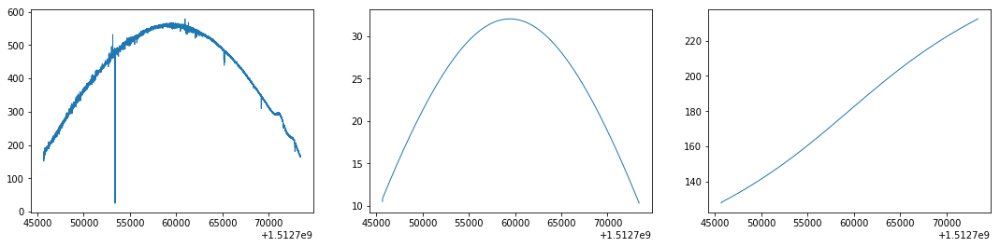

(99386, 1) (99386, 1) (99386, 1)
E:clear_sky_data\2017_12_09/trajectory_file.txt
343 2017 1.45921505555932 138.2
1.45921505555932 69 (27695, 2)
(99277, 1) (99277, 1) (99277, 1) (99277, 1) (99277, 1)


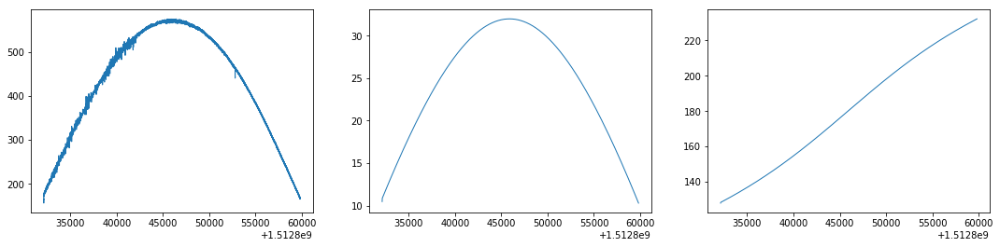

(99277, 1) (99277, 1) (99277, 1)
E:clear_sky_data\2017_12_12/trajectory_file.txt
346 2017 1.4636836693610291 138.2
1.4636836693610291 69 (27604, 2)
(98969, 1) (98969, 1) (98969, 1) (98969, 1) (98969, 1)


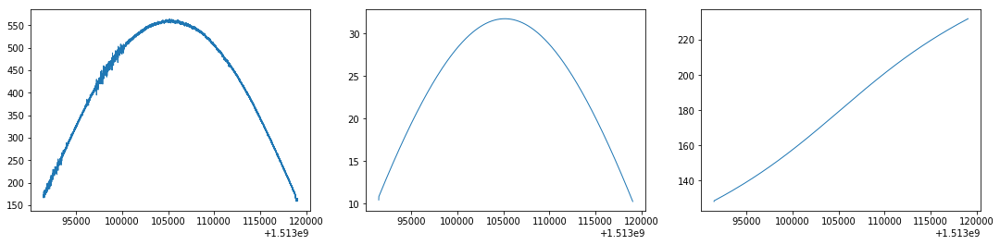

(98969, 1) (98969, 1) (98969, 1)
E:clear_sky_data\2017_12_13/trajectory_file.txt
347 2017 1.465188201271147 138.2
1.465188201271147 69 (27579, 2)
(98873, 1) (98873, 1) (98873, 1) (98873, 1) (98873, 1)


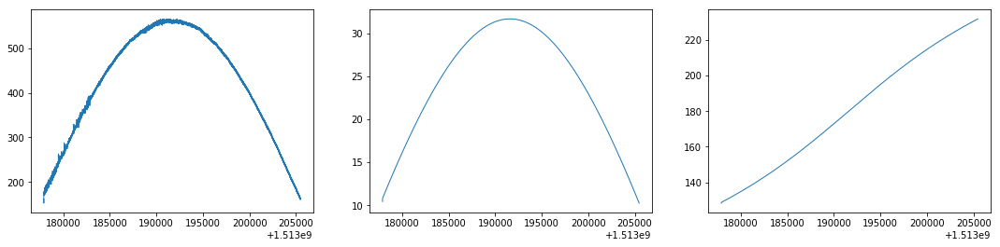

(98873, 1) (98873, 1) (98873, 1)
E:clear_sky_data\2017_12_15/trajectory_file.txt
349 2017 1.4682170845028695 138.2
1.4682170845028695 69 (27538, 2)
(98698, 1) (98698, 1) (98698, 1) (98698, 1) (98698, 1)


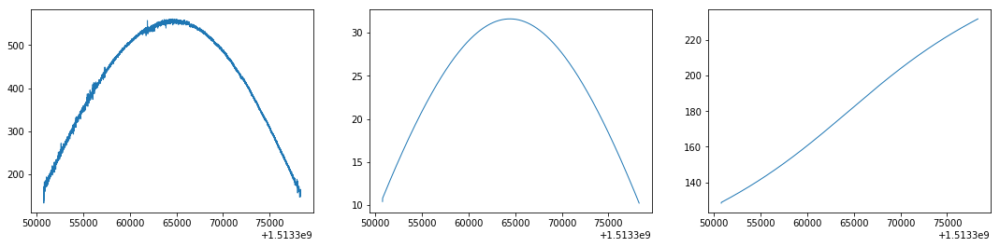

(98698, 1) (98698, 1) (98698, 1)
E:clear_sky_data\2017_12_19/trajectory_file.txt
353 2017 1.474341526832965 138.2
1.474341526832965 69 (27491, 2)
(98554, 1) (98554, 1) (98554, 1) (98554, 1) (98554, 1)


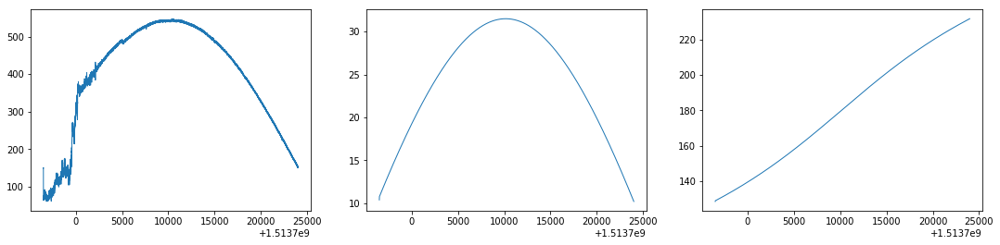

(98554, 1) (98554, 1) (98554, 1)
E:clear_sky_data\2017_12_20/trajectory_file.txt
354 2017 1.475883883849841 138.2
1.475883883849841 69 (27487, 2)
(98532, 1) (98532, 1) (98532, 1) (98532, 1) (98532, 1)


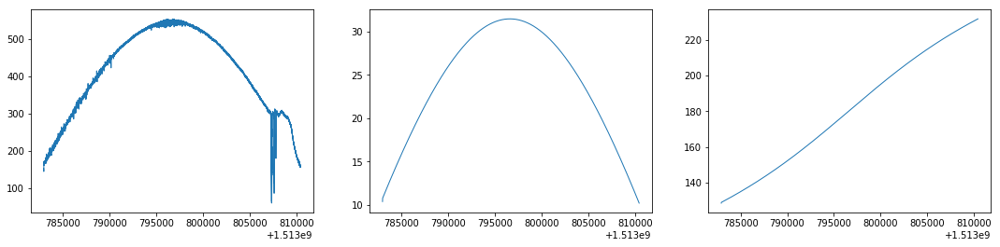

(98532, 1) (98532, 1) (98532, 1)
E:clear_sky_data\2018_01_01/trajectory_file.txt
1 2018 1.494540403083433 -83.18181818181819
1.494540403083433 -41 (27662, 2)
(99129, 1) (99129, 1) (99129, 1) (99129, 1) (99129, 1)


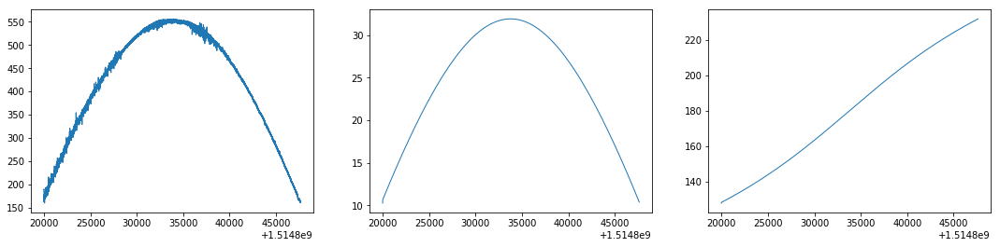

(99129, 1) (99129, 1) (99129, 1)
E:clear_sky_data\2018_01_11/trajectory_file.txt
11 2018 1.5099081870481665 -83.18181818181819
1.5099081870481665 -41 (28114, 2)
(100776, 1) (100776, 1) (100776, 1) (100776, 1) (100776, 1)


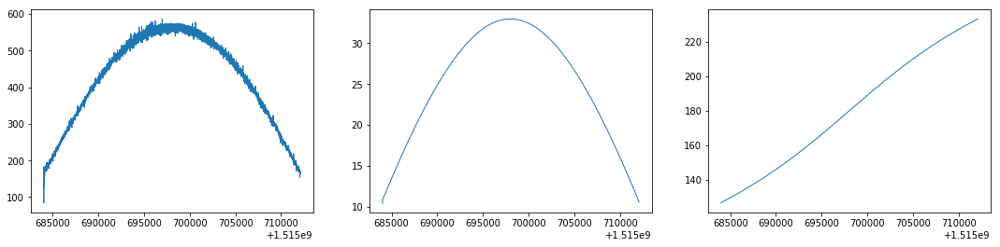

(100776, 1) (100776, 1) (100776, 1)
E:clear_sky_data\2018_01_12/trajectory_file.txt
12 2018 1.511416699090306 -83.18181818181819
1.511416699090306 -41 (28173, 2)
(101020, 1) (101020, 1) (101020, 1) (101020, 1) (101020, 1)


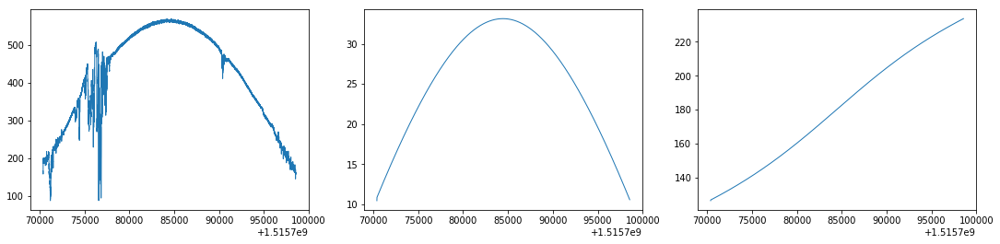

(101020, 1) (101020, 1) (101020, 1)
E:clear_sky_data\2018_01_13/trajectory_file.txt
13 2018 1.5129182683770608 -83.18181818181819
1.5129182683770608 -41 (28236, 2)
(101237, 1) (101237, 1) (101237, 1) (101237, 1) (101237, 1)


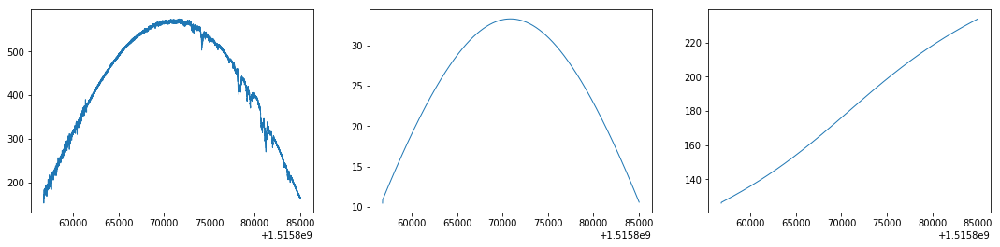

(101237, 1) (101237, 1) (101237, 1)
E:clear_sky_data\2018_01_22/trajectory_file.txt
22 2018 1.526047334345104 -83.18181818181819
1.526047334345104 -41 (28898, 2)
(103577, 1) (103577, 1) (103577, 1) (103577, 1) (103577, 1)


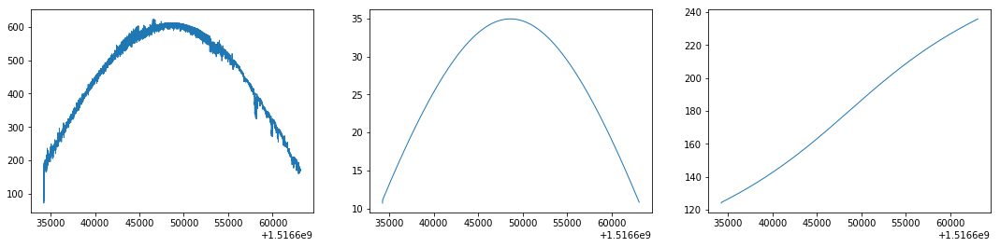

(103577, 1) (103577, 1) (103577, 1)
E:clear_sky_data\2018_01_24/trajectory_file.txt
24 2018 1.5288517865625506 -83.18181818181819
1.5288517865625506 -41 (29069, 2)
(104239, 1) (104239, 1) (104239, 1) (104239, 1) (104239, 1)


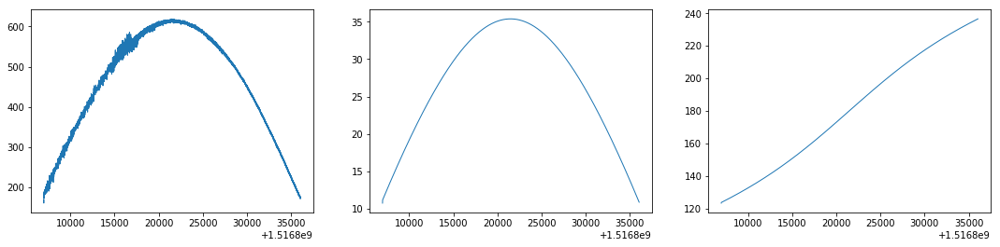

(104239, 1) (104239, 1) (104239, 1)
E:clear_sky_data\2018_01_27/trajectory_file.txt
27 2018 1.5329666298979998 -83.18181818181819
1.5329666298979998 -41 (29340, 2)
(105212, 1) (105212, 1) (105212, 1) (105212, 1) (105212, 1)


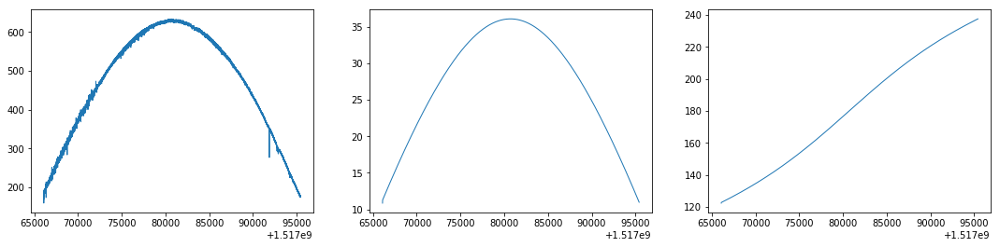

(105212, 1) (105212, 1) (105212, 1)
E:clear_sky_data\2018_02_02/trajectory_file.txt
33 2018 1.5408258672023085 -83.18181818181819
1.5408258672023085 -41 (29930, 2)
(107368, 1) (107368, 1) (107368, 1) (107368, 1) (107368, 1)


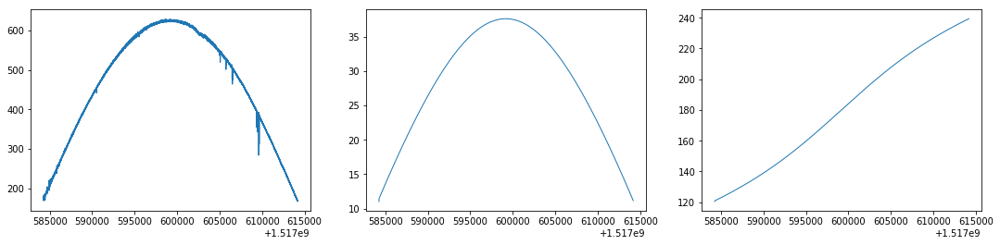

(107368, 1) (107368, 1) (107368, 1)
E:clear_sky_data\2018_02_07/trajectory_file.txt
38 2018 1.5469484076165765 -83.18181818181819
1.5469484076165765 -41 (30464, 2)
(109296, 1) (109296, 1) (109296, 1) (109296, 1) (109296, 1)


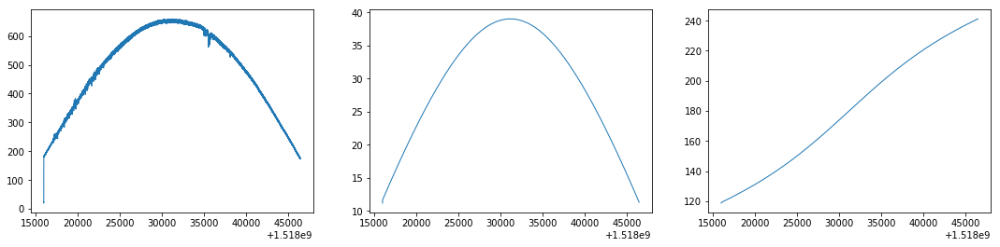

(109296, 1) (109296, 1) (109296, 1)
E:clear_sky_data\2018_02_11/trajectory_file.txt
42 2018 1.5515342078688965 -83.18181818181819
1.5515342078688965 -41 (30916, 2)
(110833, 1) (110833, 1) (110833, 1) (110833, 1) (110833, 1)


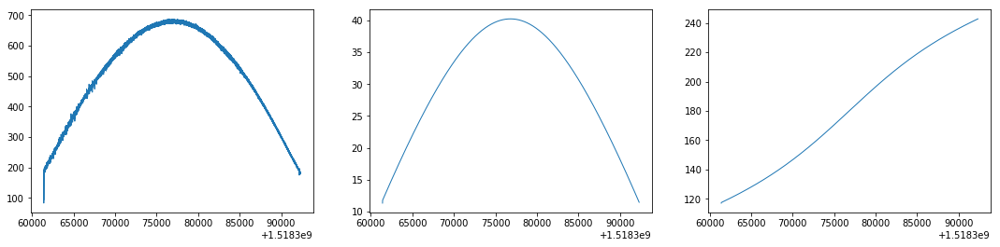

(110833, 1) (110833, 1) (110833, 1)
E:clear_sky_data\2018_02_26/trajectory_file.txt
57 2018 1.5658883213914165 -83.18181818181819
1.5658883213914165 -41 (32758, 2)
(117420, 1) (117420, 1) (117420, 1) (117420, 1) (117420, 1)


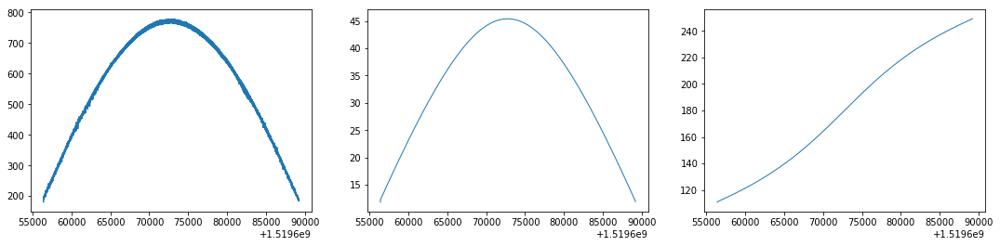

(117420, 1) (117420, 1) (117420, 1)
E:clear_sky_data\2018_03_01/trajectory_file.txt
60 2018 1.568164075379351 -83.18181818181819
1.568164075379351 -41 (33147, 2)
(118811, 1) (118811, 1) (118811, 1) (118811, 1) (118811, 1)


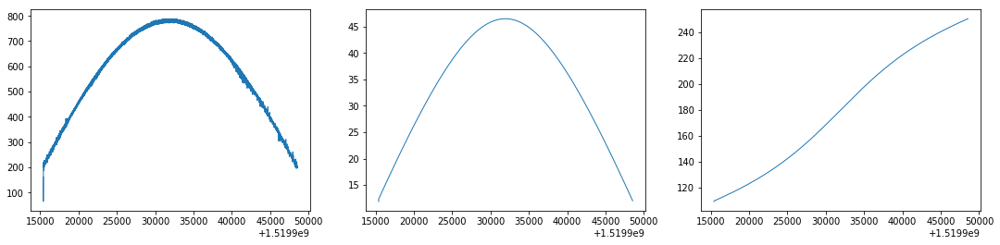

(118811, 1) (118811, 1) (118811, 1)
E:clear_sky_data\2018_03_02/trajectory_file.txt
61 2018 1.5688754363540425 -83.18181818181819
1.5688754363540425 -41 (33278, 2)
(119311, 1) (119311, 1) (119311, 1) (119311, 1) (119311, 1)


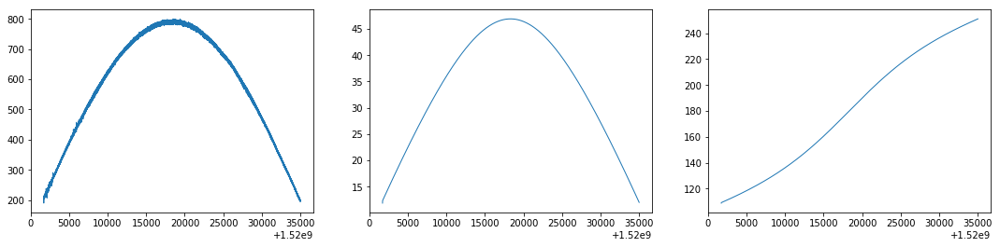

(119311, 1) (119311, 1) (119311, 1)
E:clear_sky_data\2018_03_03/trajectory_file.txt
62 2018 1.5695628283094367 -83.18181818181819
1.5695628283094367 -41 (33408, 2)
(119826, 1) (119826, 1) (119826, 1) (119826, 1) (119826, 1)


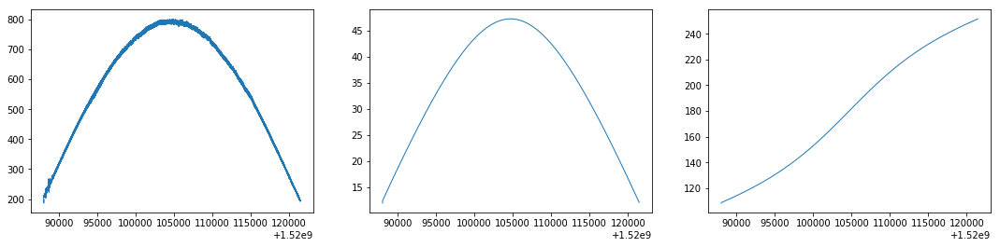

(119826, 1) (119826, 1) (119826, 1)
E:clear_sky_data\2018_03_04/trajectory_file.txt
63 2018 1.5702260475564627 -83.18181818181819
1.5702260475564627 -41 (33541, 2)
(120263, 1) (120263, 1) (120263, 1) (120263, 1) (120263, 1)


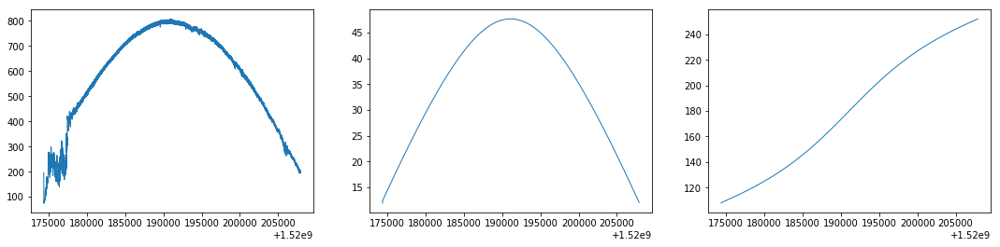

(120263, 1) (120263, 1) (120263, 1)
E:clear_sky_data\2018_04_04/trajectory_file.txt
94 2018 1.5780302885489277 2929.5789473684213
1.5780302885489277 1464 (37727, 2)
(135363, 1) (135363, 1) (135363, 1) (135363, 1) (135363, 1)


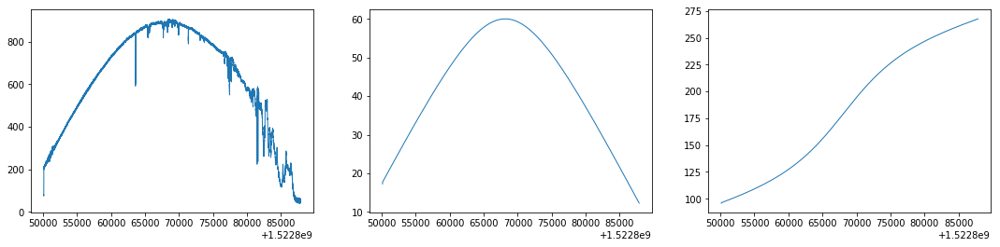

(135363, 1) (135363, 1) (135363, 1)
E:clear_sky_data\2018_04_09/trajectory_file.txt
99 2018 1.5769000833820832 2929.5789473684213
1.5769000833820832 1464 (38393, 2)
(137730, 1) (137730, 1) (137730, 1) (137730, 1) (137730, 1)


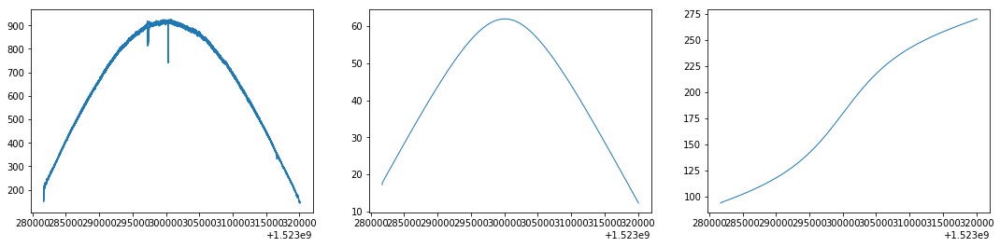

(137730, 1) (137730, 1) (137730, 1)
E:clear_sky_data\2018_04_14/trajectory_file.txt
104 2018 1.5751115961070237 2929.5789473684213
1.5751115961070237 1464 (39048, 2)
(140002, 1) (140002, 1) (140002, 1) (140002, 1) (140002, 1)


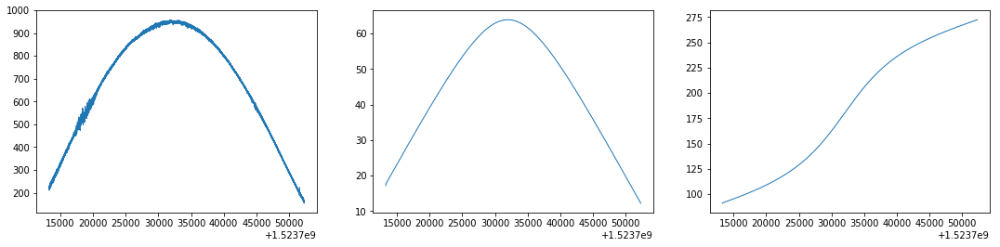

(140002, 1) (140002, 1) (140002, 1)
E:clear_sky_data\2018_04_18/trajectory_file.txt
108 2018 1.5732155799109488 2929.5789473684213
1.5732155799109488 1464 (39563, 2)
(141889, 1) (141889, 1) (141889, 1) (141889, 1) (141889, 1)


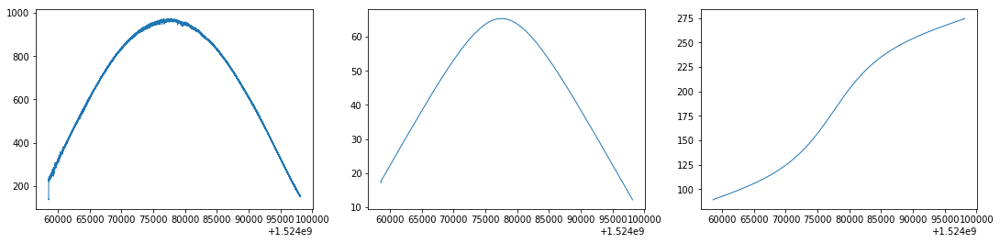

(141889, 1) (141889, 1) (141889, 1)
E:clear_sky_data\2018_04_23/trajectory_file.txt
113 2018 1.5702787664453408 2929.5789473684213
1.5702787664453408 1464 (40189, 2)
(144170, 1) (144170, 1) (144170, 1) (144170, 1) (144170, 1)


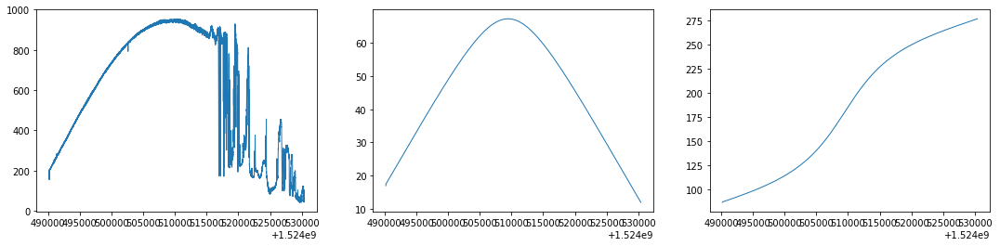

(144170, 1) (144170, 1) (144170, 1)
E:clear_sky_data\2018_05_16/trajectory_file.txt
136 2018 1.5493705599423282 2929.5789473684213
1.5493705599423282 1464 (42706, 2)
(153181, 1) (153181, 1) (153181, 1) (153181, 1) (153181, 1)


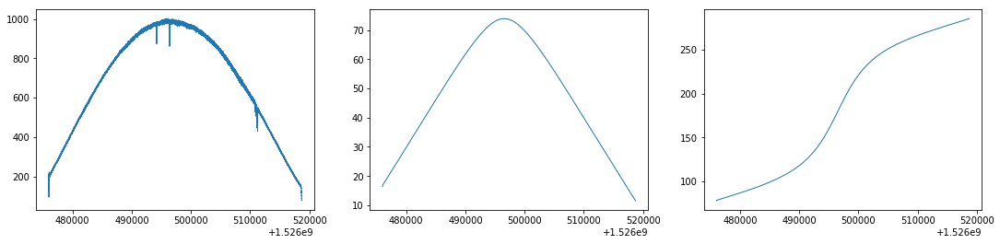

(153181, 1) (153181, 1) (153181, 1)
E:clear_sky_data\2018_05_19/trajectory_file.txt
139 2018 1.545854643421186 2929.5789473684213
1.545854643421186 1464 (42974, 2)
(154146, 1) (154146, 1) (154146, 1) (154146, 1) (154146, 1)


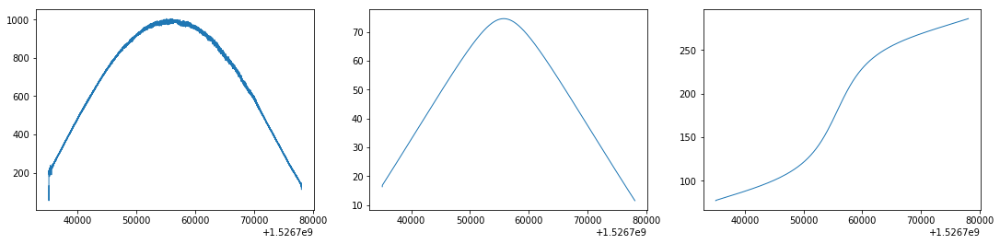

(154146, 1) (154146, 1) (154146, 1)
E:clear_sky_data\2018_05_23/trajectory_file.txt
143 2018 1.5409284177620586 2929.5789473684213
1.5409284177620586 1464 (43304, 2)
(155305, 1) (155305, 1) (155305, 1) (155305, 1) (155305, 1)


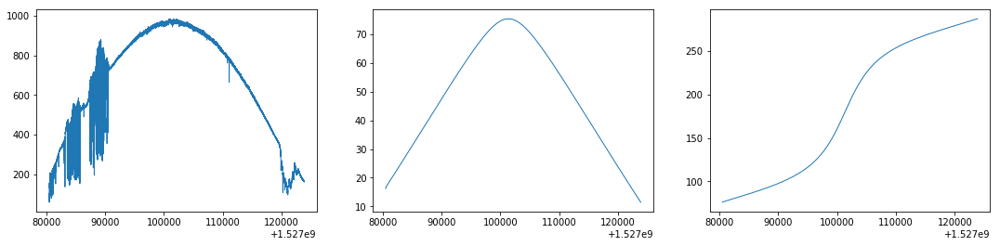

(155305, 1) (155305, 1) (155305, 1)
E:clear_sky_data\2018_05_24/trajectory_file.txt
144 2018 1.539656717577754 2929.5789473684213
1.539656717577754 1464 (43381, 2)
(155573, 1) (155573, 1) (155573, 1) (155573, 1) (155573, 1)


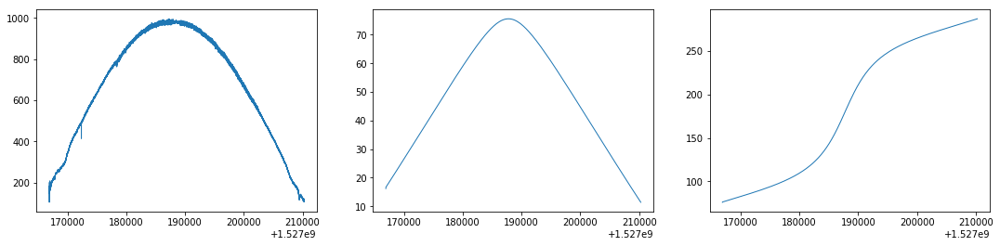

(155573, 1) (155573, 1) (155573, 1)
E:clear_sky_data\2018_06_07/trajectory_file.txt
158 2018 1.5204244845238852 2929.5789473684213
1.5204244845238852 1464 (44211, 2)
(158604, 1) (158604, 1) (158604, 1) (158604, 1) (158604, 1)


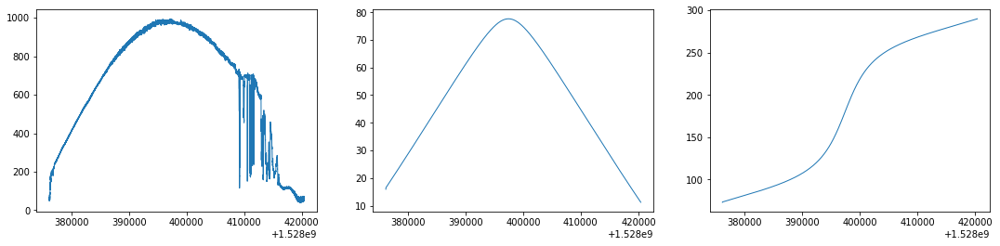

(158604, 1) (158604, 1) (158604, 1)
E:clear_sky_data\2018_06_08/trajectory_file.txt
159 2018 1.5189650180508179 2929.5789473684213
1.5189650180508179 1464 (44251, 2)
(158753, 1) (158753, 1) (158753, 1) (158753, 1) (158753, 1)


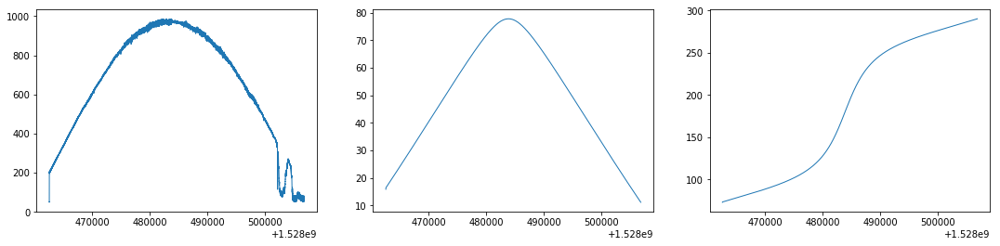

(158753, 1) (158753, 1) (158753, 1)
E:clear_sky_data\2018_06_11/trajectory_file.txt
162 2018 1.5145332850775204 2929.5789473684213
1.5145332850775204 1464 (44354, 2)
(159036, 1) (159036, 1) (159036, 1) (159036, 1) (159036, 1)


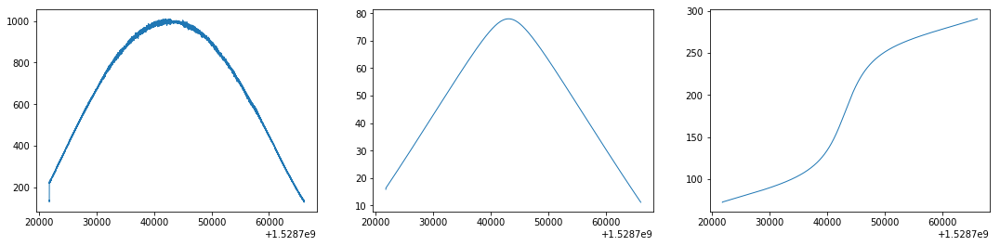

(159036, 1) (159036, 1) (159036, 1)
E:clear_sky_data\2018_06_12/trajectory_file.txt
163 2018 1.5130397220473861 2929.5789473684213
1.5130397220473861 1464 (44383, 2)
(159135, 1) (159135, 1) (159135, 1) (159135, 1) (159135, 1)


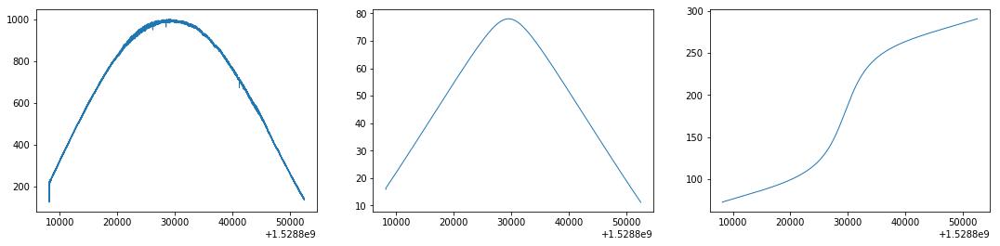

(159135, 1) (159135, 1) (159135, 1)
E:clear_sky_data\2018_06_22/trajectory_file.txt


KeyboardInterrupt: 

In [1]:
def save_data(X, Y, Z, T, path, name):
    
    with open(path.format(name), 'wb') as f:
        pickle.dump(X, f); pickle.dump(Y, f); pickle.dump(Z, f); pickle.dump(T, f)

        
def load_model(path, name):
    
    with open(path.format(name), 'rb') as f:
        C0 = pickle.Unpickler(f).load()
        C1 = pickle.Unpickler(f).load()

    print(C0.shape, len(C1))
    return C0, C1


def pyranometers_effect(t, C):
    
    def periodic_model(C, t, N = 365.):
        return C[0] * np.sin(C[1] + ( (2*np.pi) / N ) * t) + C[2]
    
    def picewise_model(C, x0, x1):
        
        if x0 <= C[4]:
            y1 = C[0]

        if x0 >  C[4]:
            y1 = C[1]

        if x0 >  C[5]:
            y1 = C[2]

        if x0 >  C[6] or x1 > 2018:
            y1 = C[3]
                       
        return y1

    x0 = t.timetuple().tm_yday
    x1 = t.timetuple().tm_year
    
    y0 = periodic_model(C[0], x0)
    y1 = picewise_model(C[1], x0, x1)
    print(x0, x1, y0, y1)
    return y0, int(y1/2)



C = load_model(path = 'Q:{}', name = 'clear_sky_ghi_model.pkl')


path = 'E:clear_sky_data/{}'
name = '{}/trajectory_file.txt'

DX = []; DY = []; DZ = []; DT = []
c = []
d = []
for folder in glob.glob(path.format('*')):
    
    if not folder.endswith('.pkl'):
        print(name.format(folder))
        A = np.loadtxt(name.format(folder), delimiter = ',')
        
        for file in glob.glob('{}\*'.format(folder)):

            if file.endswith('.csv') & (len(file) < 46):
                I = np.loadtxt(file, delimiter = ',')
                T = I[:, 0][:, np.newaxis]
                I = I[:, 1][:, np.newaxis]    
                
                N = I.shape[0]
                t = datetime.fromtimestamp(float(T[1,:]))
                n = t.timetuple().tm_yday

                amp, inc = pyranometers_effect(t, C)     
                print(amp, inc, A.shape)
    
                if inc > 0:
                    f0 = interp1d(np.linspace(0, N, A[inc:, 0].shape[0]), A[inc:, 0], kind = 'cubic')
                    f1 = interp1d(np.linspace(0, N, A[inc:, 1].shape[0]), A[inc:, 1], kind = 'cubic')
                else:
                    f0 = interp1d(np.linspace(0, N, A[:inc, 0].shape[0]), A[:inc, 0], kind = 'cubic')
                    f1 = interp1d(np.linspace(0, N, A[:inc, 1].shape[0]), A[:inc, 1], kind = 'cubic')
                    
                ELE = f0(np.linspace(0, N, N))[:, np.newaxis]
                AZ  = f1(np.linspace(0, N, N))[:, np.newaxis]
    
                #print(ELE[0], ELE[-1], I[5], I[-5])
                idx = ELE > 0.
                I   = I[idx][:, np.newaxis]/amp
                T   = T[idx][:, np.newaxis]
                ELE = ELE[idx][:, np.newaxis]
                AZ  = AZ[idx][:, np.newaxis]
                print(idx.shape, I.shape, ELE.shape, AZ.shape, T.shape)
                
                plt.subplots_adjust(right = 2.5)
                plt.subplot(1, 3, 1)
                plt.plot(T, I, linewidth = 1)

                plt.subplot(1, 3, 2)
                plt.plot(T, ELE, linewidth = 1)

                plt.subplot(1, 3, 3)
                plt.plot(T, AZ, linewidth = 1)
                plt.show()
                
                print(ELE.shape, AZ.shape, I.shape)
                
                DX.append(ELE); DY.append(AZ); DZ.append(I); DT.append(T)
    
#save_data(DX, DY, DZ, DT, path = 'Q:{}', name = 'clear_sky_ghi_model_error.pkl')
#print(len(DX), len(DY), len(DZ), len(DT))

### Program to extract data to model systematic errors found on GHI measurements with Girasol Project

E:clear_sky_data\2017_12_08/trajectory_file.txt
(99386, 1) (99386, 1) (99386, 1) (99386, 1)


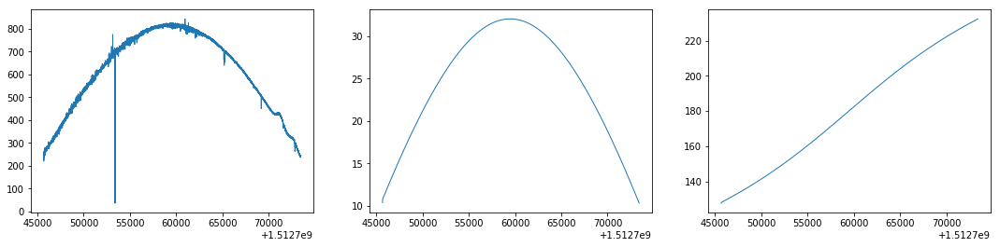

E:clear_sky_data\2017_12_09/trajectory_file.txt
(99277, 1) (99277, 1) (99277, 1) (99277, 1)


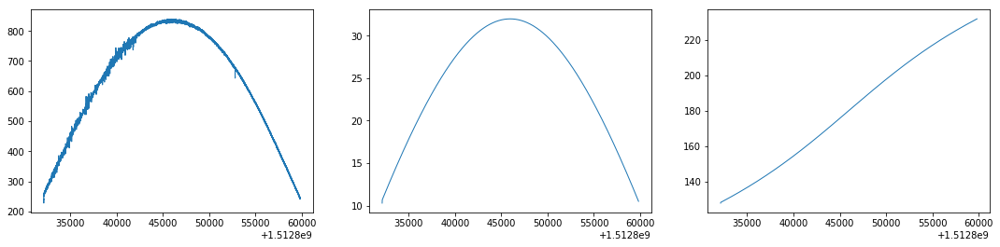

E:clear_sky_data\2017_12_12/trajectory_file.txt
(98969, 1) (98969, 1) (98969, 1) (98969, 1)


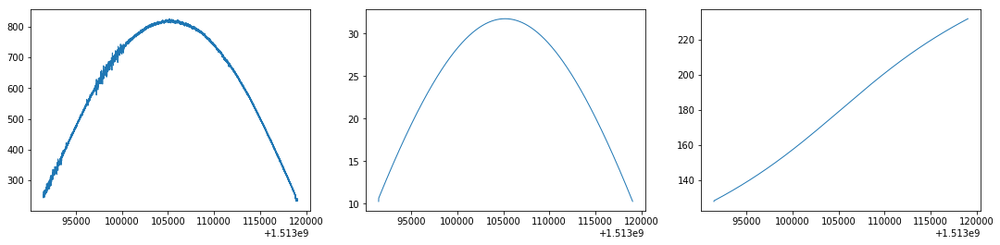

E:clear_sky_data\2017_12_13/trajectory_file.txt
(98873, 1) (98873, 1) (98873, 1) (98873, 1)


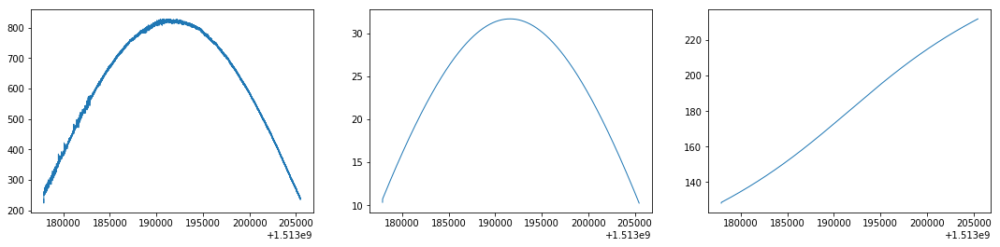

E:clear_sky_data\2017_12_15/trajectory_file.txt
(98698, 1) (98698, 1) (98698, 1) (98698, 1)


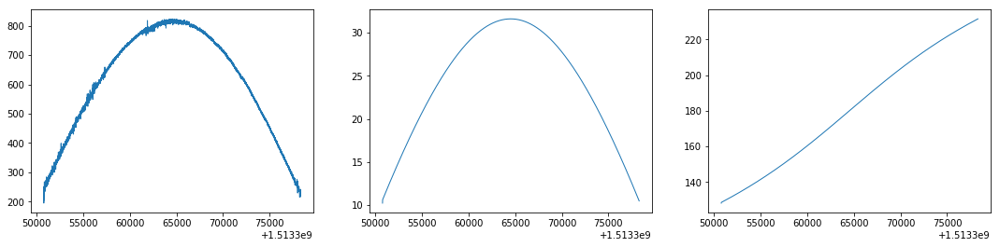

E:clear_sky_data\2017_12_19/trajectory_file.txt
(98554, 1) (98554, 1) (98554, 1) (98554, 1)


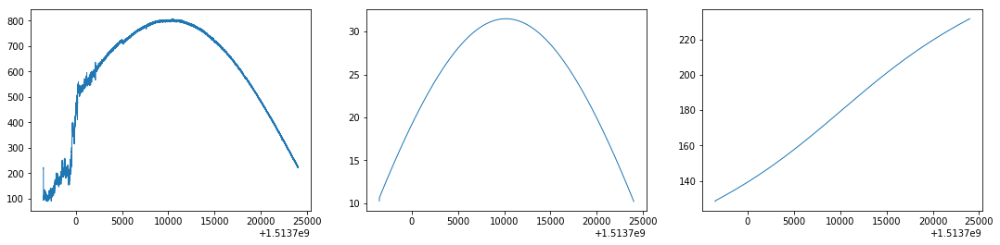

E:clear_sky_data\2017_12_20/trajectory_file.txt
(98532, 1) (98532, 1) (98532, 1) (98532, 1)


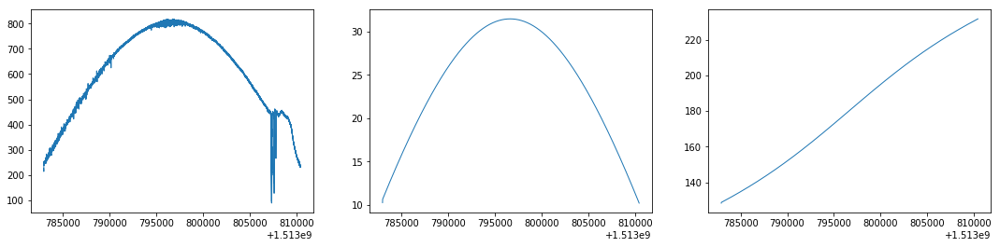

E:clear_sky_data\2018_01_01/trajectory_file.txt
(99129, 1) (99129, 1) (99129, 1) (99129, 1)


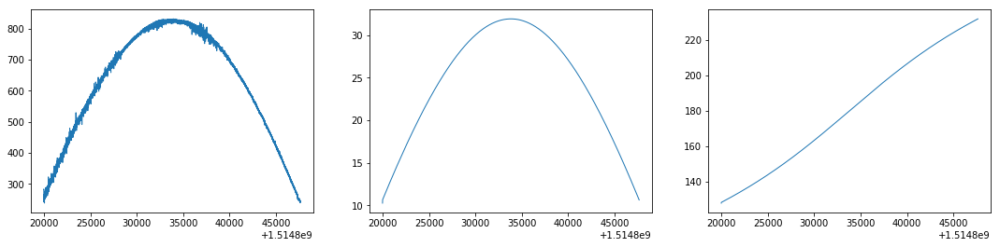

E:clear_sky_data\2018_01_11/trajectory_file.txt
(100776, 1) (100776, 1) (100776, 1) (100776, 1)


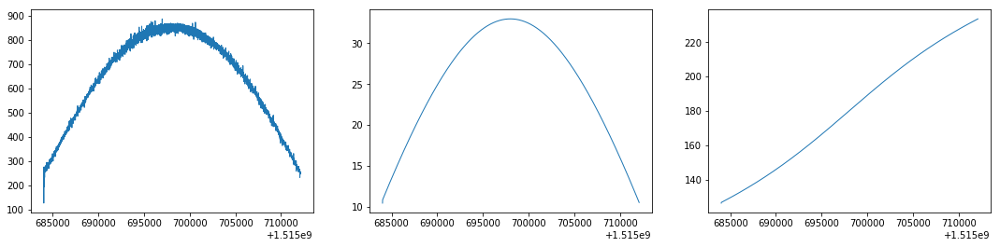

E:clear_sky_data\2018_01_12/trajectory_file.txt
(101020, 1) (101020, 1) (101020, 1) (101020, 1)


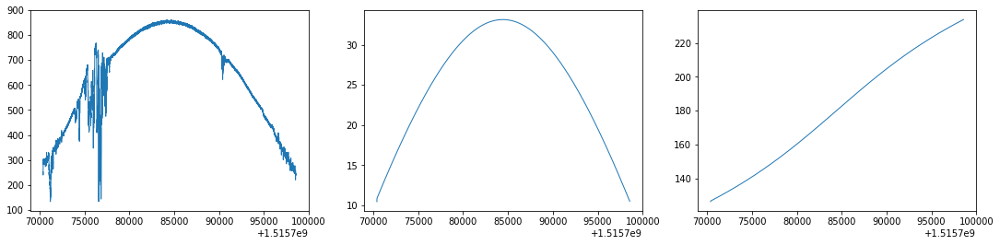

E:clear_sky_data\2018_01_13/trajectory_file.txt
(101237, 1) (101237, 1) (101237, 1) (101237, 1)


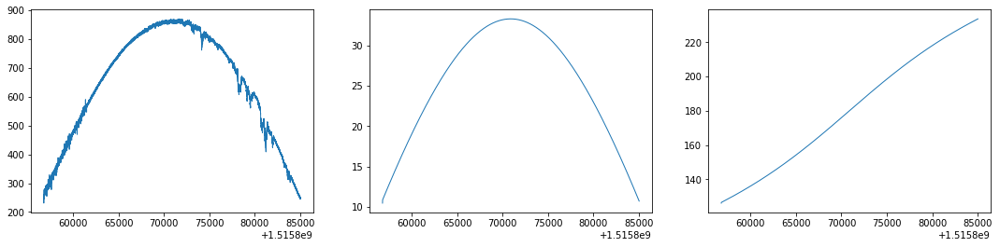

E:clear_sky_data\2018_01_22/trajectory_file.txt
(103577, 1) (103577, 1) (103577, 1) (103577, 1)


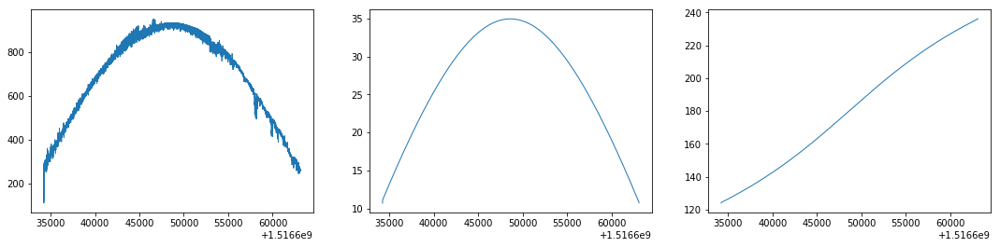

E:clear_sky_data\2018_01_24/trajectory_file.txt
(104239, 1) (104239, 1) (104239, 1) (104239, 1)


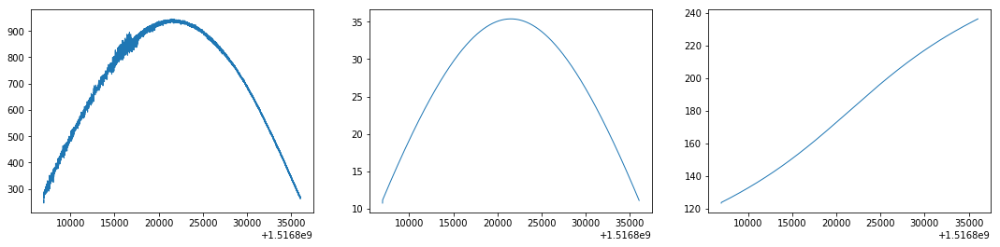

E:clear_sky_data\2018_01_27/trajectory_file.txt
(105212, 1) (105212, 1) (105212, 1) (105212, 1)


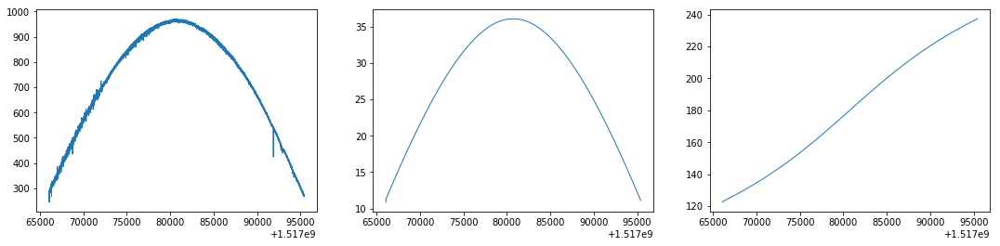

E:clear_sky_data\2018_02_02/trajectory_file.txt
(107368, 1) (107368, 1) (107368, 1) (107368, 1)


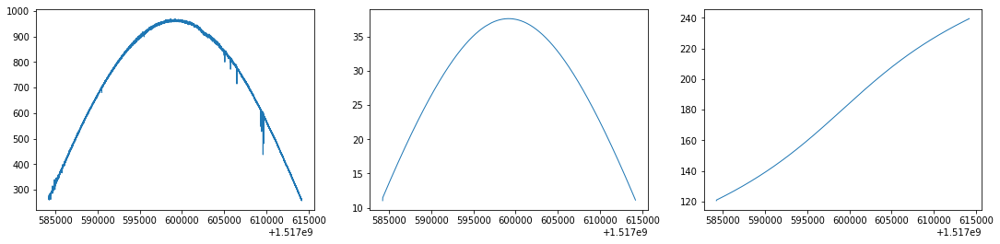

E:clear_sky_data\2018_02_07/trajectory_file.txt
(109296, 1) (109296, 1) (109296, 1) (109296, 1)


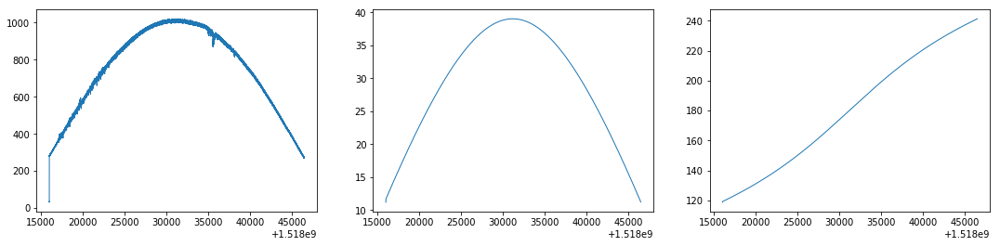

E:clear_sky_data\2018_02_11/trajectory_file.txt
(110833, 1) (110833, 1) (110833, 1) (110833, 1)


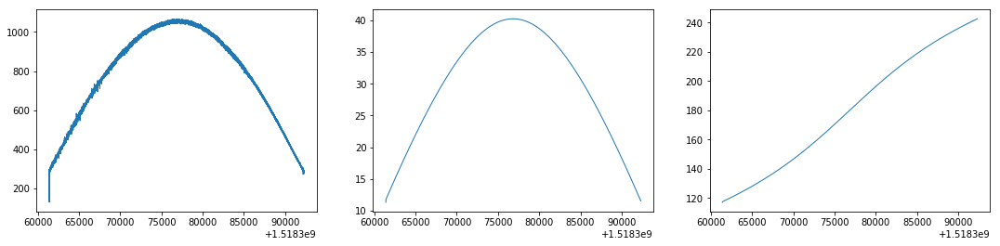

E:clear_sky_data\2018_02_26/trajectory_file.txt
(117420, 1) (117420, 1) (117420, 1) (117420, 1)


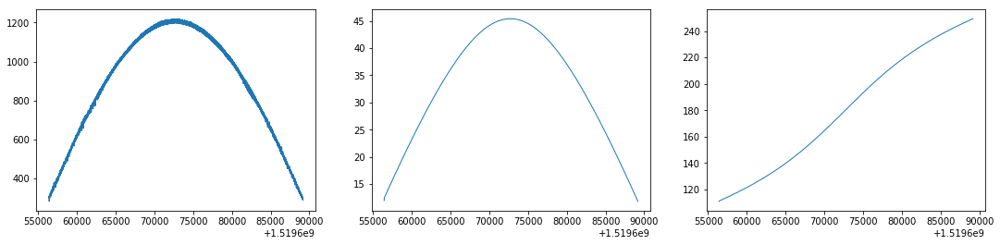

E:clear_sky_data\2018_03_01/trajectory_file.txt
(118811, 1) (118811, 1) (118811, 1) (118811, 1)


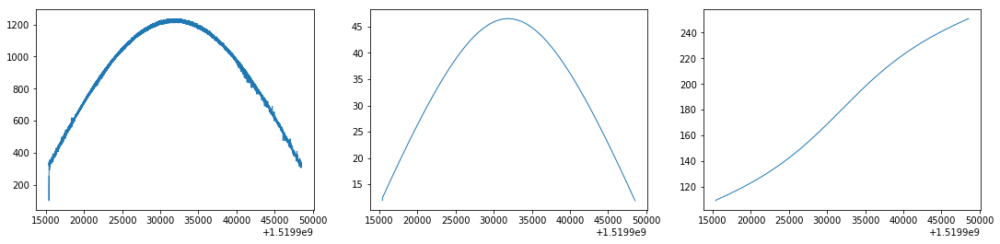

E:clear_sky_data\2018_03_02/trajectory_file.txt
(119311, 1) (119311, 1) (119311, 1) (119311, 1)


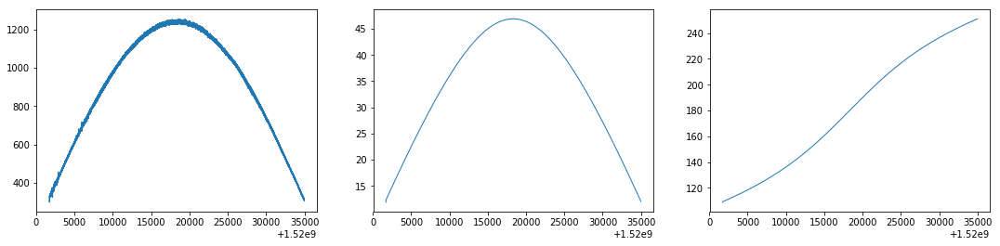

E:clear_sky_data\2018_03_03/trajectory_file.txt
(119826, 1) (119826, 1) (119826, 1) (119826, 1)


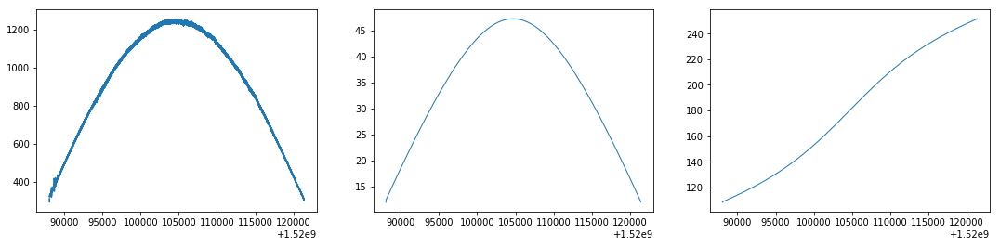

E:clear_sky_data\2018_03_04/trajectory_file.txt
(120263, 1) (120263, 1) (120263, 1) (120263, 1)


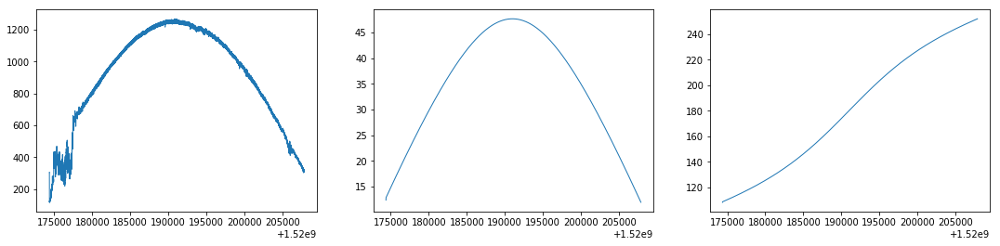

E:clear_sky_data\2018_04_04/trajectory_file.txt
(135363, 1) (135363, 1) (135363, 1) (135363, 1)


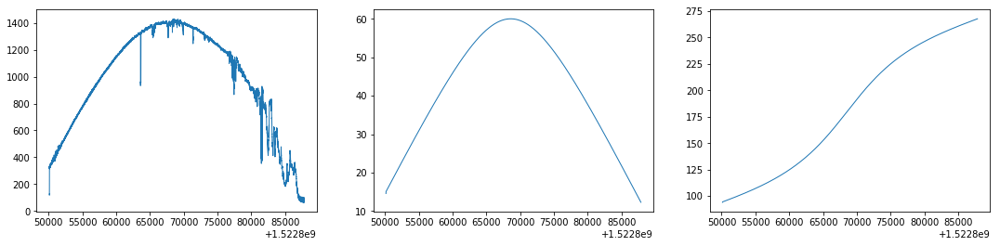

E:clear_sky_data\2018_04_09/trajectory_file.txt
(137730, 1) (137730, 1) (137730, 1) (137730, 1)


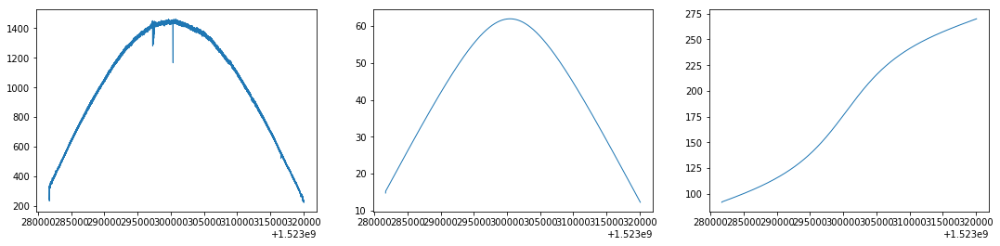

E:clear_sky_data\2018_04_14/trajectory_file.txt
(140002, 1) (140002, 1) (140002, 1) (140002, 1)


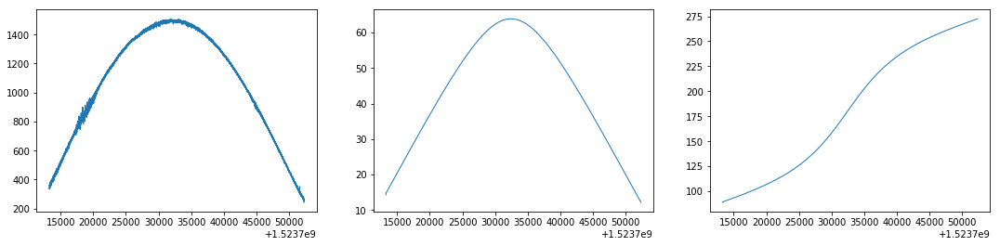

E:clear_sky_data\2018_04_18/trajectory_file.txt
(141889, 1) (141889, 1) (141889, 1) (141889, 1)


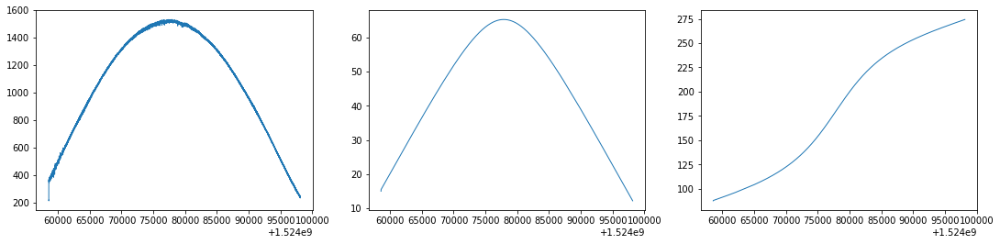

E:clear_sky_data\2018_04_23/trajectory_file.txt
(144170, 1) (144170, 1) (144170, 1) (144170, 1)


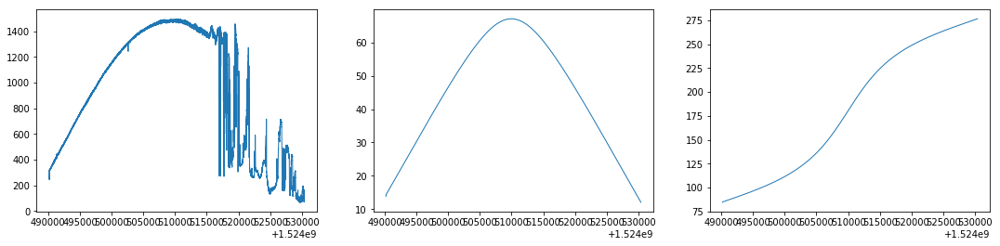

E:clear_sky_data\2018_05_16/trajectory_file.txt
(153181, 1) (153181, 1) (153181, 1) (153181, 1)


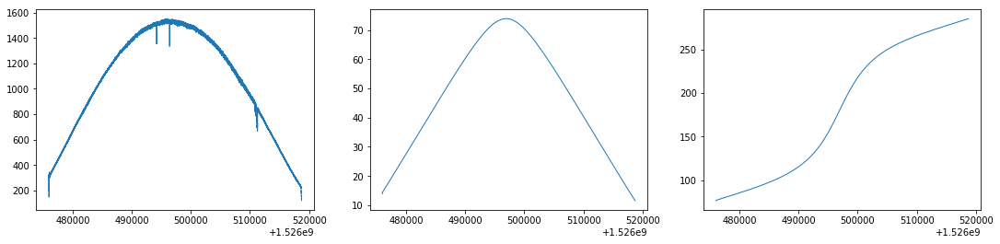

E:clear_sky_data\2018_05_19/trajectory_file.txt
(154146, 1) (154146, 1) (154146, 1) (154146, 1)


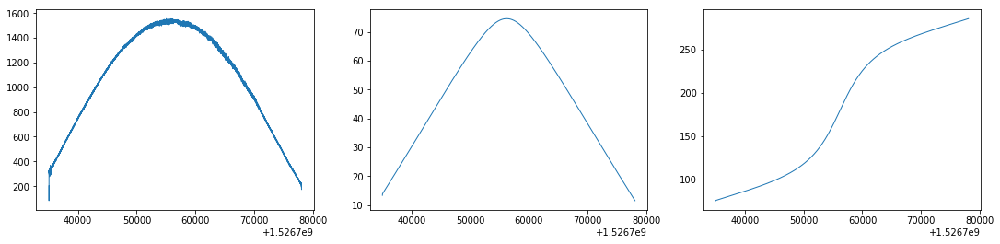

E:clear_sky_data\2018_05_23/trajectory_file.txt
(155305, 1) (155305, 1) (155305, 1) (155305, 1)


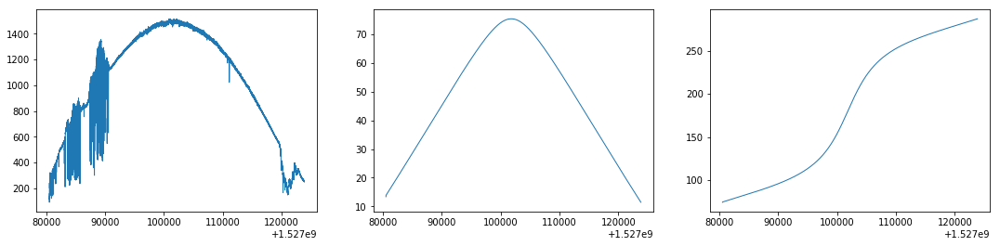

E:clear_sky_data\2018_05_24/trajectory_file.txt
(155573, 1) (155573, 1) (155573, 1) (155573, 1)


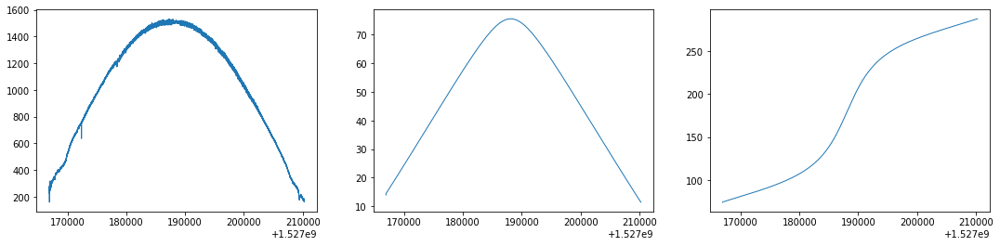

E:clear_sky_data\2018_06_07/trajectory_file.txt
(158604, 1) (158604, 1) (158604, 1) (158604, 1)


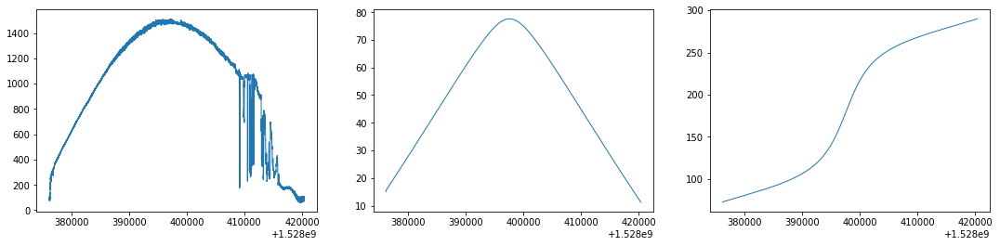

E:clear_sky_data\2018_06_08/trajectory_file.txt
(158753, 1) (158753, 1) (158753, 1) (158753, 1)


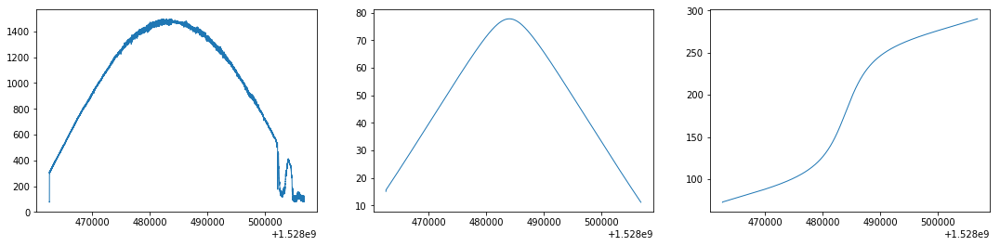

E:clear_sky_data\2018_06_11/trajectory_file.txt
(159036, 1) (159036, 1) (159036, 1) (159036, 1)


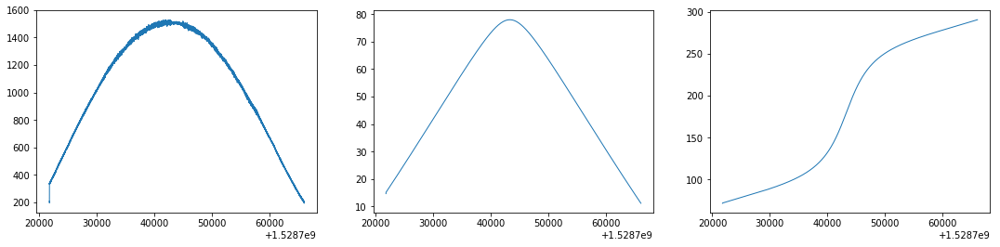

E:clear_sky_data\2018_06_12/trajectory_file.txt
(159135, 1) (159135, 1) (159135, 1) (159135, 1)


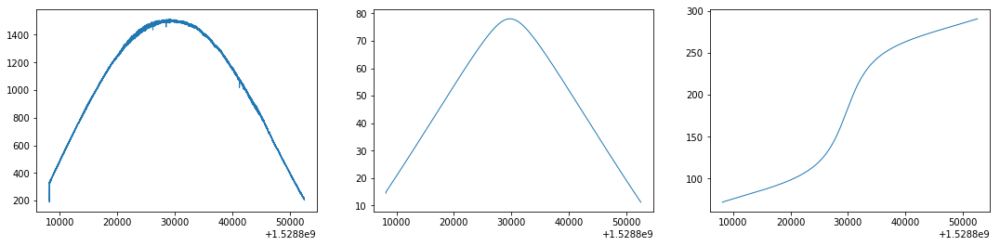

E:clear_sky_data\2018_06_22/trajectory_file.txt
(159653, 1) (159653, 1) (159653, 1) (159653, 1)


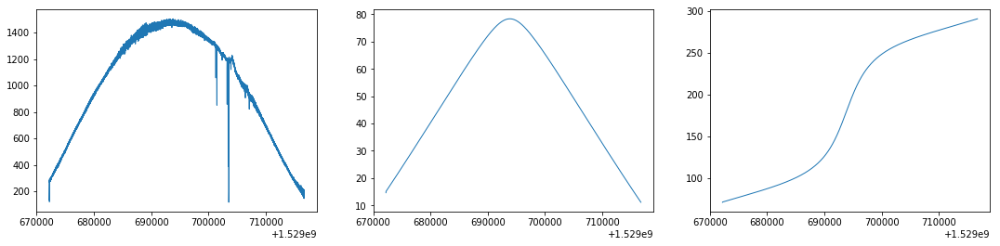

E:clear_sky_data\2018_06_24/trajectory_file.txt
(159582, 1) (159582, 1) (159582, 1) (159582, 1)


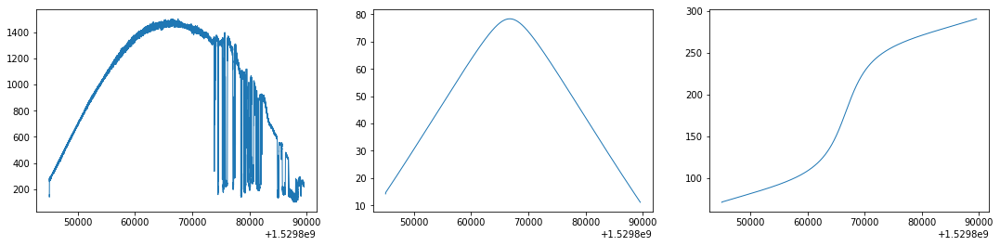

E:clear_sky_data\2018_06_25/trajectory_file.txt
(159547, 1) (159547, 1) (159547, 1) (159547, 1)


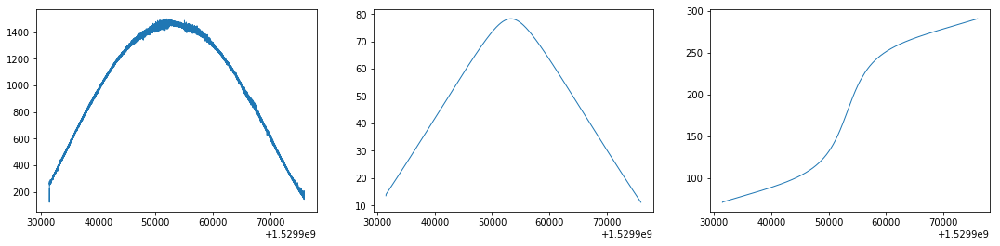

E:clear_sky_data\2018_07_01/trajectory_file.txt
(159240, 1) (159240, 1) (159240, 1) (159240, 1)


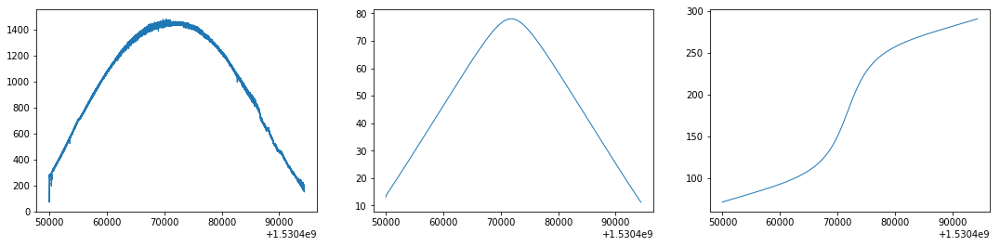

E:clear_sky_data\2018_07_18/trajectory_file.txt
(156101, 1) (156101, 1) (156101, 1) (156101, 1)


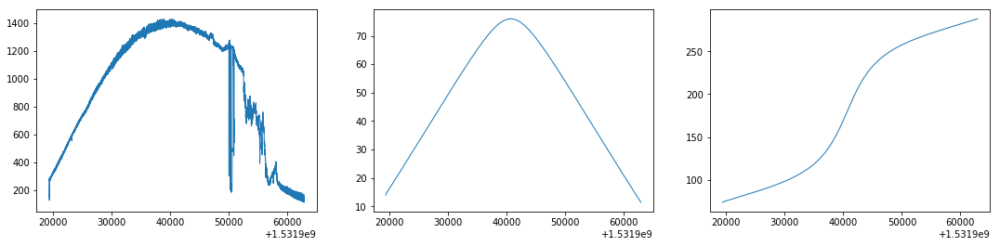

E:clear_sky_data\2018_07_21/trajectory_file.txt
(155387, 1) (155387, 1) (155387, 1) (155387, 1)


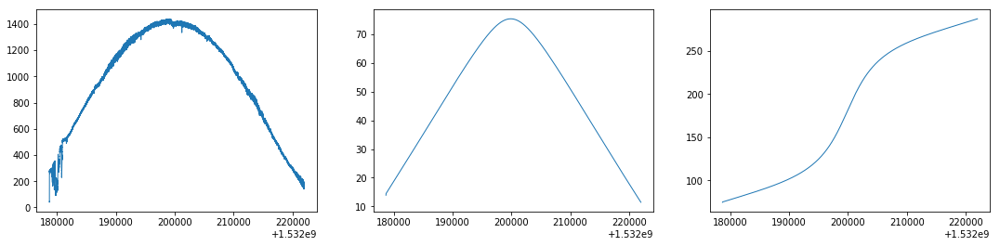

E:clear_sky_data\2018_08_09/trajectory_file.txt
(148605, 1) (148605, 1) (148605, 1) (148605, 1)


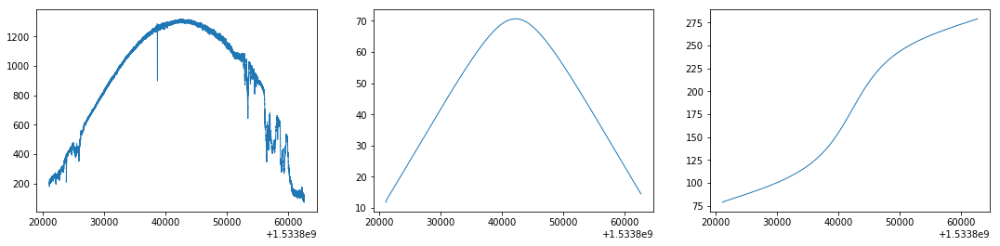

E:clear_sky_data\2018_09_12/trajectory_file.txt
(133259, 1) (133259, 1) (133259, 1) (133259, 1)


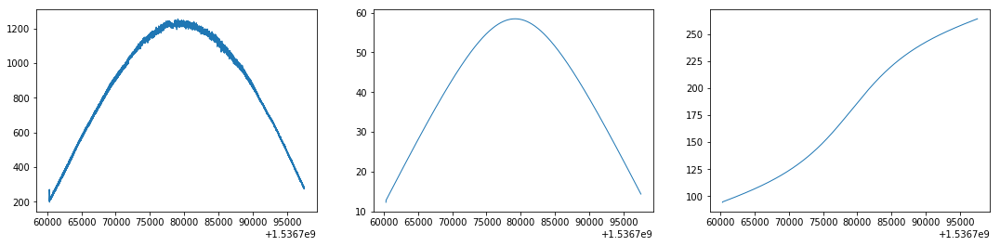

E:clear_sky_data\2018_09_13/trajectory_file.txt
(132754, 1) (132754, 1) (132754, 1) (132754, 1)


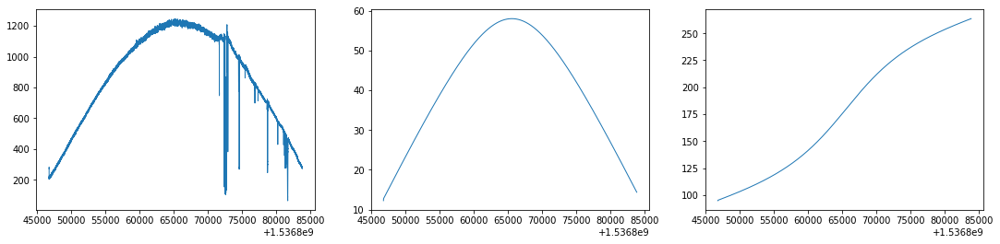

E:clear_sky_data\2018_09_15/trajectory_file.txt
(131779, 1) (131779, 1) (131779, 1) (131779, 1)


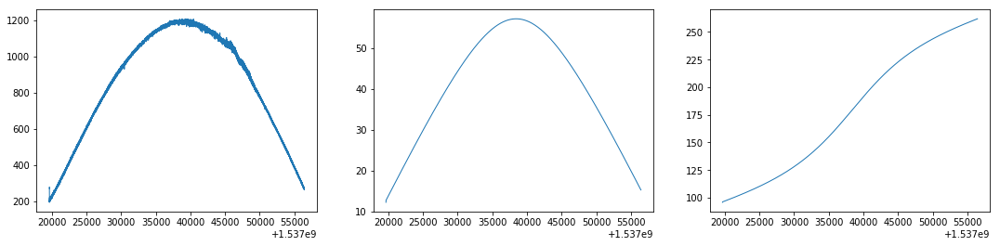

E:clear_sky_data\2018_09_18/trajectory_file.txt
(130328, 1) (130328, 1) (130328, 1) (130328, 1)


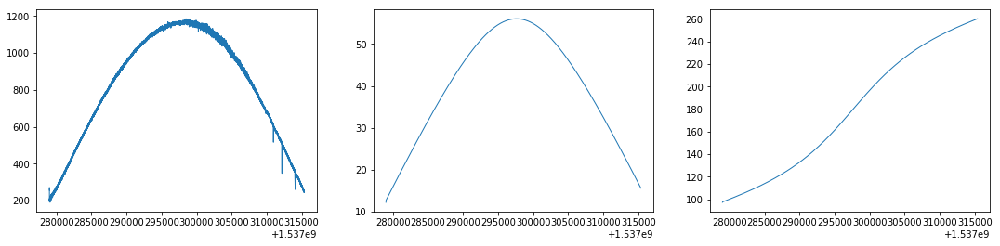

E:clear_sky_data\2018_09_22/trajectory_file.txt
(128329, 1) (128329, 1) (128329, 1) (128329, 1)


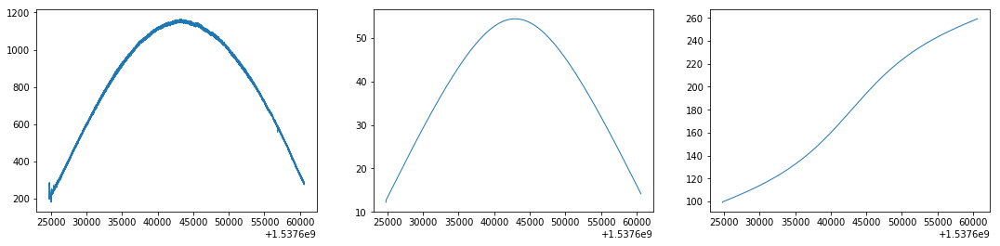

E:clear_sky_data\2018_09_23/trajectory_file.txt
(127867, 1) (127867, 1) (127867, 1) (127867, 1)


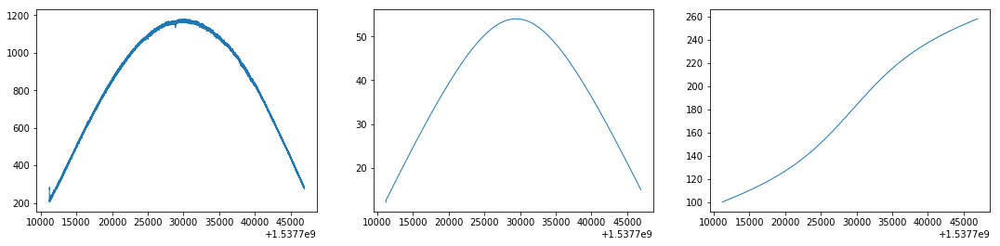

E:clear_sky_data\2018_11_02/trajectory_file.txt
(109650, 1) (109650, 1) (109650, 1) (109650, 1)


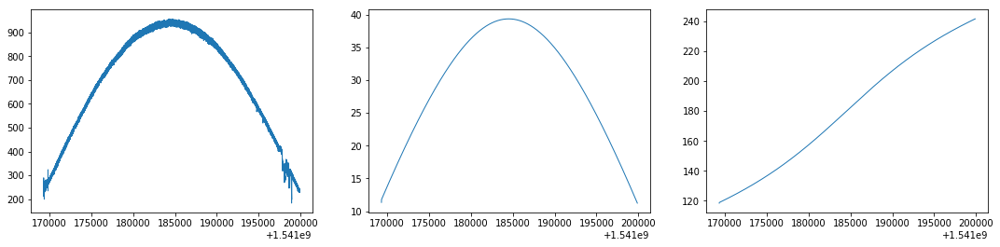

E:clear_sky_data\2018_11_05/trajectory_file.txt
(108483, 1) (108483, 1) (108483, 1) (108483, 1)


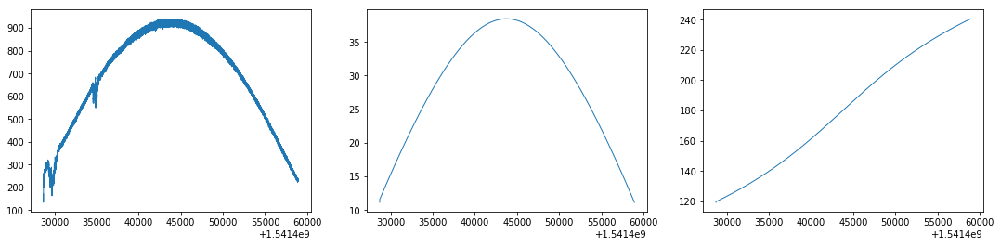

E:clear_sky_data\2018_11_06/trajectory_file.txt
(108092, 1) (108092, 1) (108092, 1) (108092, 1)


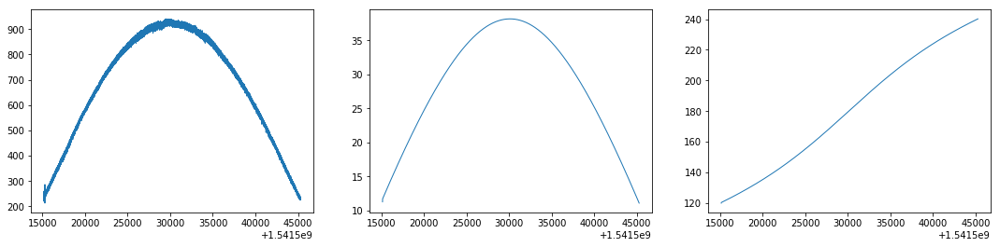

E:clear_sky_data\2018_11_07/trajectory_file.txt
(107714, 1) (107714, 1) (107714, 1) (107714, 1)


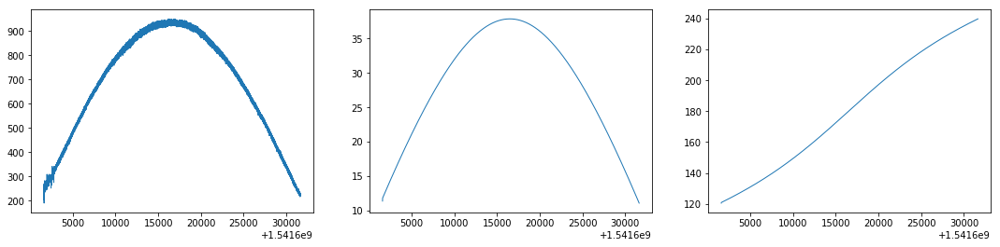

E:clear_sky_data\2018_11_08/trajectory_file.txt
(107299, 1) (107299, 1) (107299, 1) (107299, 1)


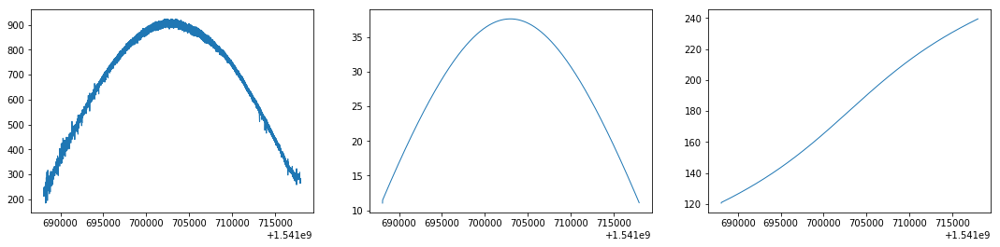

E:clear_sky_data\2018_11_24/trajectory_file.txt
(102177, 1) (102177, 1) (102177, 1) (102177, 1)


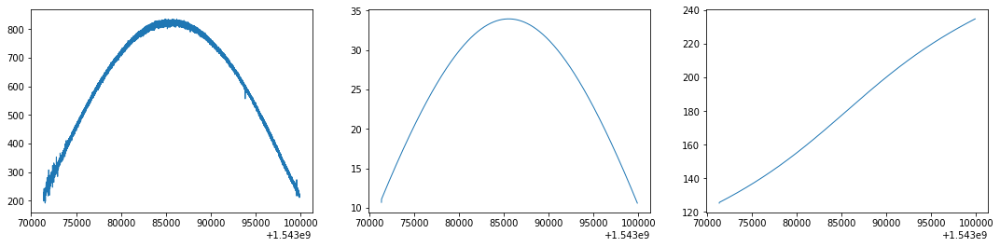

E:clear_sky_data\2018_11_27/trajectory_file.txt
(101408, 1) (101408, 1) (101408, 1) (101408, 1)


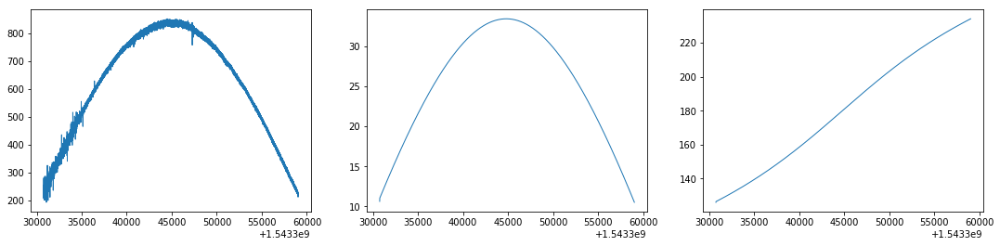

E:clear_sky_data\2018_12_09/trajectory_file.txt
(99202, 1) (99202, 1) (99202, 1) (99202, 1)


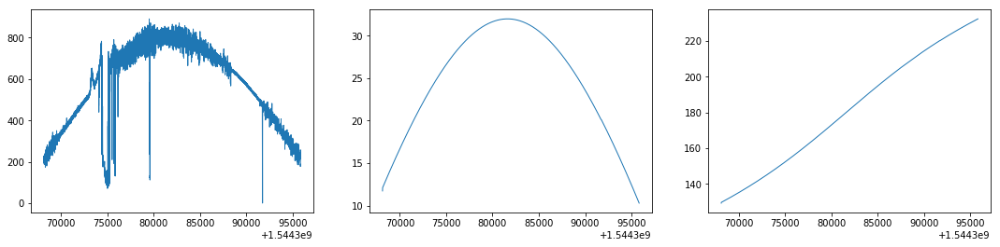

(506, 1) (506, 1) (506, 1) (506, 1)


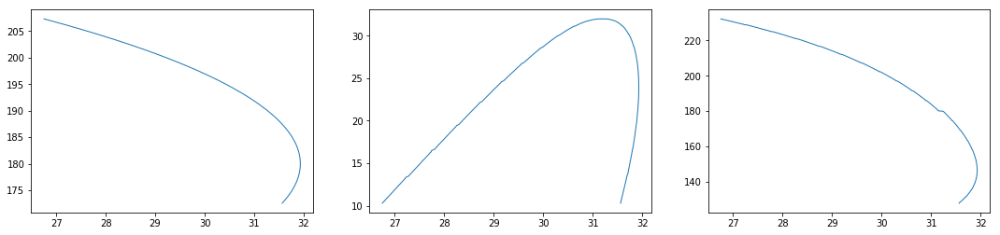

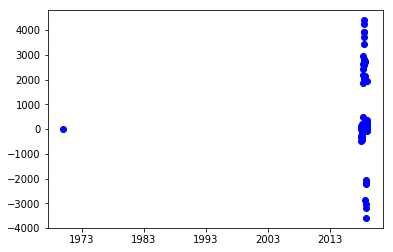

In [4]:
def save_data(X, Y, Z, T, path, name):
    
    with open(path.format(name), 'wb') as f:
        pickle.dump(X, f); pickle.dump(Y, f); pickle.dump(Z, f); pickle.dump(T, f)


path = 'E:clear_sky_data/{}'
name = '{}/trajectory_file.txt'

DX = []; DY = []; DZ = []; DT = []
c = []
d = []
i = 0

for folder in glob.glob(path.format('*')):
    
    if not folder.endswith('.pkl'):
        print(name.format(folder))
        A = np.loadtxt(name.format(folder), delimiter = ',')
        i += 1
        for file in glob.glob('{}\*'.format(folder)):

            if file.endswith('.csv') & (len(file) < 46):
                I = np.loadtxt(file, delimiter = ',')
                T = I[:, 0][:, np.newaxis]
                I = I[:, 1][:, np.newaxis]      
                N = I.shape[0]
        
                f0  = interp1d(np.linspace(0, N, A[:, 0].shape[0]), A[:, 0], kind = 'cubic')
                f1  = interp1d(np.linspace(0, N, A[:, 1].shape[0]), A[:, 1], kind = 'cubic')
                ELE = f0(np.linspace(0, N, N))[:, np.newaxis]
                AZ  = f1(np.linspace(0, N, N))[:, np.newaxis]
                
                t = datetime.fromtimestamp(float(T[1,:]))
                n = t.timetuple().tm_yday
                d.append(t)
                #print(n, i)
    
                I_max = I.max() - 75.
                x1  = np.mean(np.where(I > I_max)[0])
                x2  = np.where(ELE == ELE.max())[0]
                inc = int((x2 - x1))
                c.append(inc)
                #print(inc, N)
                if inc > 0:
                    ELE = f0(np.linspace(inc, N, N))[:, np.newaxis]
                    AZ  = f1(np.linspace(inc, N, N))[:, np.newaxis]
                else:
                    ELE = f0(np.linspace(0, N + inc, N))[:, np.newaxis]
                    AZ  = f1(np.linspace(0, N + inc, N))[:, np.newaxis]
                    
                #x1  = np.mean(np.where(I > I_max)[0])
                #x2  = np.where(ELE == ELE.max())[0]
                #inc = (x2 - x1)//2.
                #print(I.shape, ELE.shape, x1, x2, inc)
                
                idx = ELE > 0.
                I   = I[idx][:, np.newaxis]
                T   = T[idx][:, np.newaxis]
                ELE = ELE[idx][:, np.newaxis]
                AZ  = AZ[idx][:, np.newaxis]
                print(I.shape, ELE.shape, AZ.shape, T.shape)
                
                plt.subplots_adjust(right = 2.5)
                plt.subplot(131)
                plt.plot(T, I, linewidth = 1)

                plt.subplot(132)
                plt.plot(T, ELE, linewidth = 1)

                plt.subplot(133)
                plt.plot(T, AZ, linewidth = 1)
                plt.show()
                
                #print(ELE.shape, AZ.shape, I.shape)
                
                DX.append(ELE); DY.append(AZ); DZ.append(I); DT.append(T)

D = np.array(d)
C = np.array(c)

plt.figure()
plt.plot(D, C, 'bo')
plt.show()

#save_data(DX, DY, DZ, DT, path= 'Q:{}', name = 'clear_sky_normal_radiation.pkl')
#print(len(DX), len(DY), len(DZ), len(DT))

### This program saves the data for the shifting and attenuation compensation models

In [2]:
def save_data(X, Y, path, name):
    
    with open(path.format(name), 'wb') as f:
        pickle.dump(X, f); pickle.dump(Y, f)

save_data(D, C, path= 'Q:{}', name = 'clear_sky_ghi.pkl')
print(D.shape, C.shape)

(57,) (57,)


### GHI empirical and theoretical fitting function code, amplitude coefficient extraction, and error between them.

#### NOTES:

The Global Solar Irradiance (GSI) on a flat surface normal to the ground has 3 components:

$I_{GSI} = I_{Direct} + I_{Diffuse} + I_{Reflected}$

The Direct component when the body of reference is normal to the ground is fully caracterized by the Sun's elevation angle $\beta$ such as

$I_{Direct} = I_{DN} \cdot \sin \beta$

where the direct normal component is:

$I_{DN} = \theta_1 \cdot \exp \left( - \frac{\theta_2}{\sin \beta} \right)$

$\theta_1$ and $\theta_2$ are respectivately an elevation with respect to the see level and an air mass coefficients, which depend on the clearness conditions of the atmosphere.

The Diffuse component is the solar irradiance scattered by hitting particules in the atmosphere, such as the water droplets that form the clouds. There is also an expression for a flat surface normal to the ground, and it is expressed as:

$I_{Diffuse} = \theta_3 \cdot \frac{I_{DN}}{2}$

The coefficient $\theta_3$ defines the proportion of irradiance that is being scattered for a particular atmospheric conditions.

The Reflected component depends on the tilt angle. The particular case for a tilt angle 0, which is a flat surface normal to the ground is:

$I_{Reflected} = \theta_4 \cdot I_{DN} \cdot \left(\theta_3\ + sin \beta\right)$

$\theta_4$ is the reflectivety coefficient of the ground material in which the sourface have been placed normal to it.

Finally, we can put together all this equations and obtained the solution for a the GSI in function of the coefficients $\theta_i$ and the Sun's elevation angle $\beta$,

 $I_{GSI} = I_{DN} \cdot \sin \beta + \theta_3 \cdot \frac{I_{DN}}{2} + \theta_4 \cdot I_{DN} \cdot \left(\theta_3\ + sin \beta\right)$,
 
 where $I_{DN} = \theta_1 \cdot \exp \left( - \frac{\theta_2}{\sin \beta} \right)$.

57 57 57 57
(99386, 1) (99386, 1) (99386, 1) (99386, 1)
(99386, 1) (99386, 1) (99386, 1)
2017-12-08 08:08:11.005904
Th. Coeff.:  1228.5595991139 0.14409872405875604 0.060827113210006924  RMSE:  206.36336168896293
Em. Coeff.:  1691.2477823394188 0.05081499242636383 0.0  RMSE:  6.489622873669626
Am. Coeff.:  1.4723925360561434


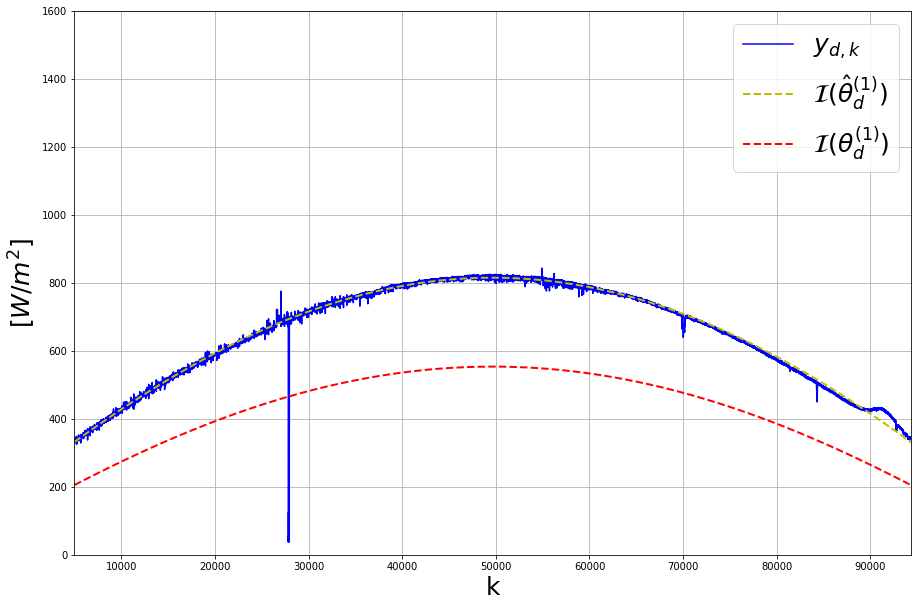

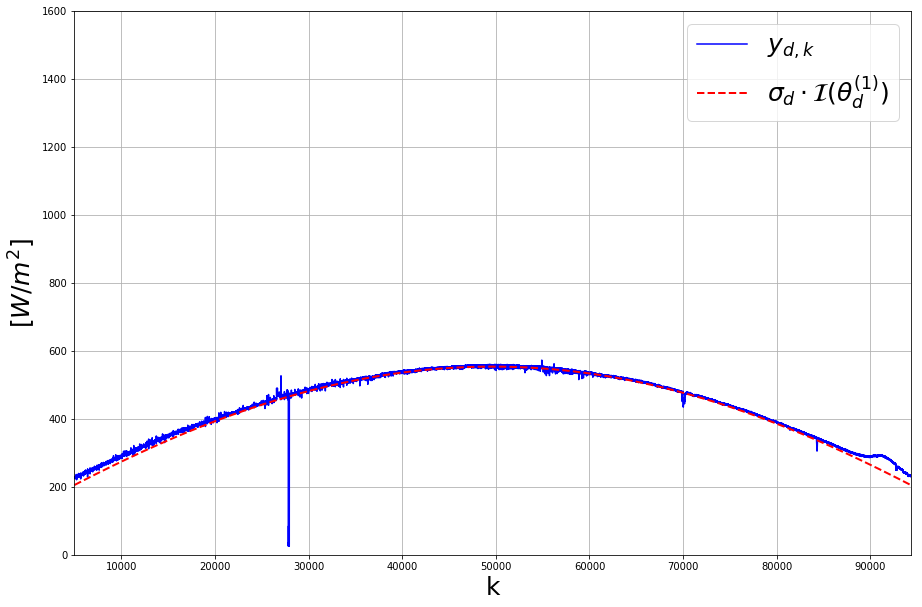

336.71374997030534 345.7028615932969
(99277, 1) (99277, 1) (99277, 1)
2017-12-09 08:08:55.212962
Th. Coeff.:  1229.0728465787477 0.1437900255182531 0.06047431487800356  RMSE:  218.18812524101708
Em. Coeff.:  1759.2499016431577 0.05850382119733477 2.596370879298418e-05  RMSE:  2.9098635919615297
Am. Coeff.:  1.5092434512087949


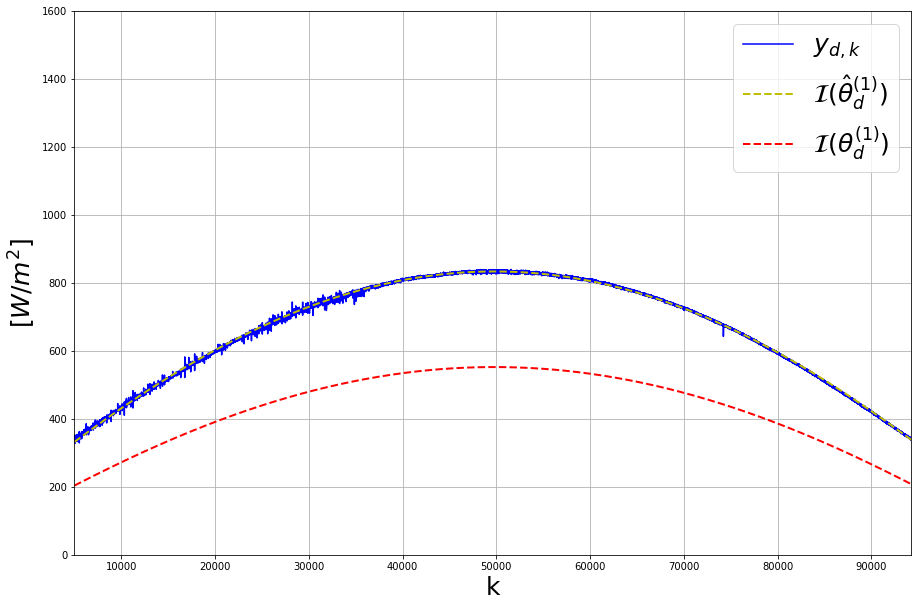

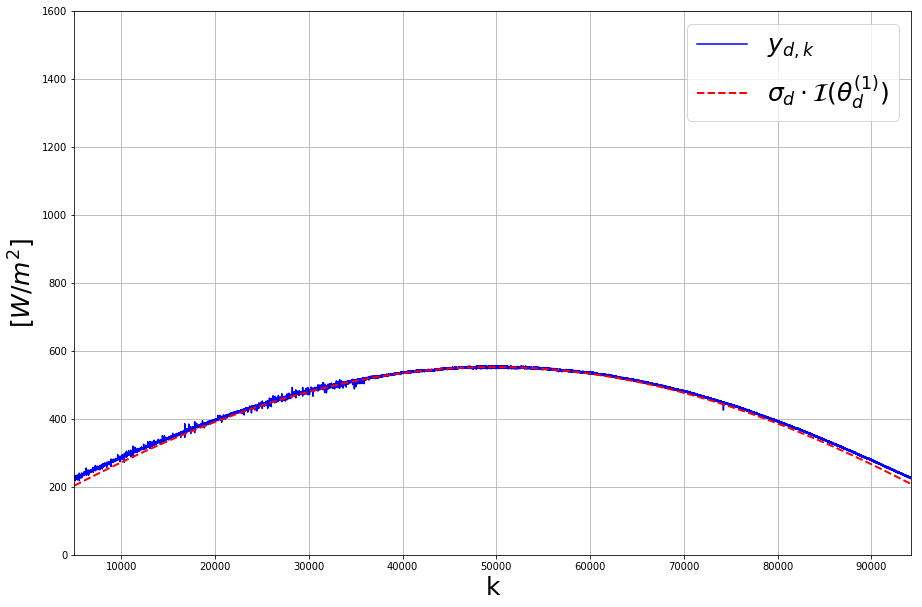

692.0969059311892 708.1714117449937
(98969, 1) (98969, 1) (98969, 1)
2017-12-12 08:11:00.005739
Th. Coeff.:  1230.489204345642 0.14291799370796773 0.05947770709482028  RMSE:  208.27305656254805
Em. Coeff.:  1739.7848531602813 0.05930862503091215 7.835635456707115e-06  RMSE:  2.7460685604175477
Am. Coeff.:  1.4890963557113746


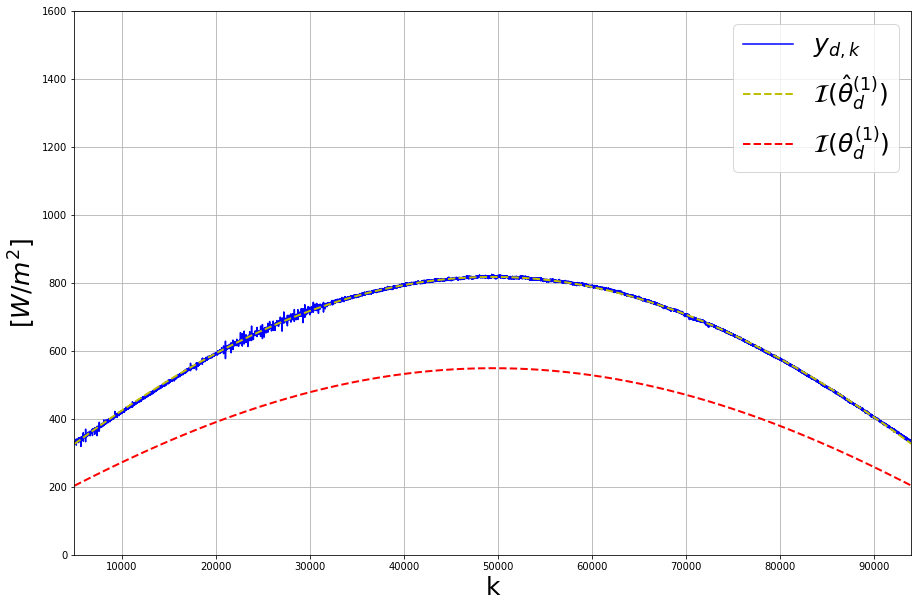

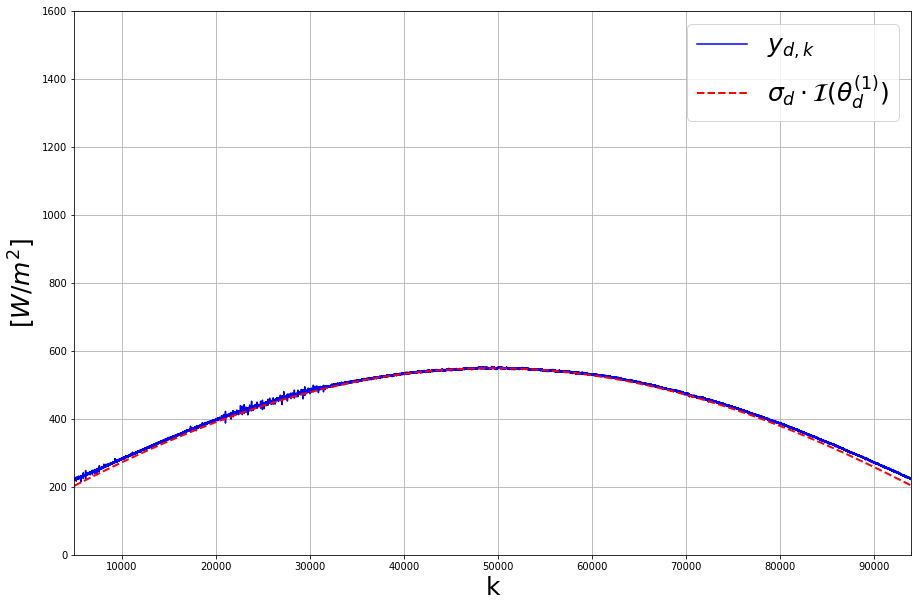

1032.9224470149272 1056.0230275237702
(98873, 1) (98873, 1) (98873, 1)
2017-12-13 08:11:39.004463
Th. Coeff.:  1230.9197290570357 0.14264562482427817 0.059166428370603645  RMSE:  211.30294901848302
Em. Coeff.:  1756.7683503563228 0.061085786075653056 1.0654046693572412e-13  RMSE:  3.4174762483260364
Am. Coeff.:  1.498171838141357


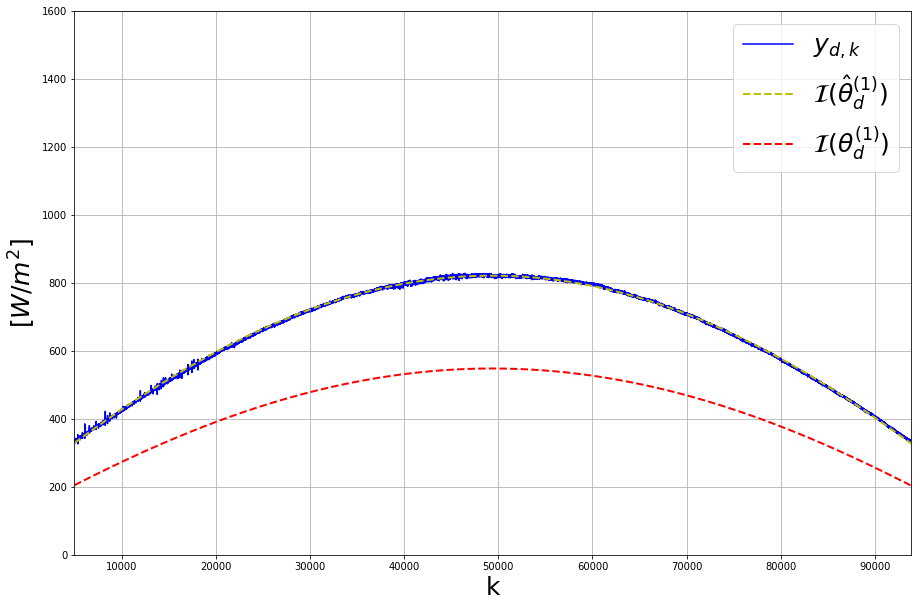

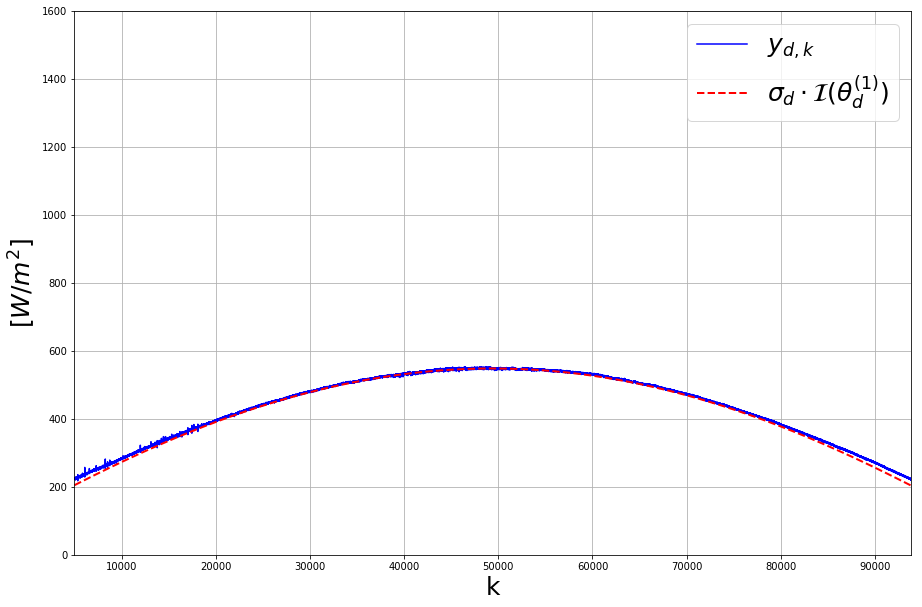

1378.3350995748651 1407.9943314915804
(98698, 1) (98698, 1) (98698, 1)
2017-12-15 08:12:54.007426
Th. Coeff.:  1231.7176119943929 0.14212883794670242 0.05857581479623135  RMSE:  205.15090454135301
Em. Coeff.:  1773.3682092021545 0.06850449530006418 2.1463791506374185e-07  RMSE:  3.3510966250409164
Am. Coeff.:  1.4903596033275528


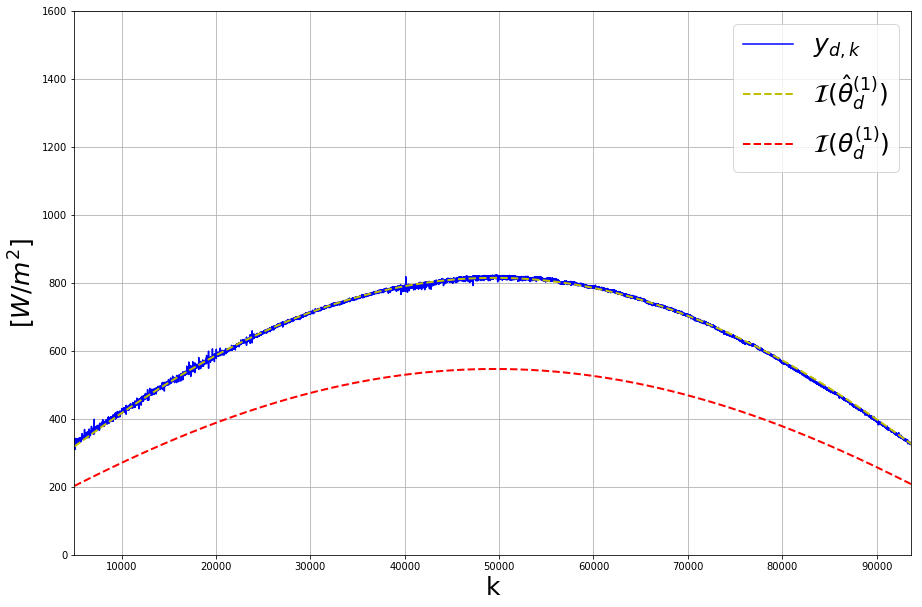

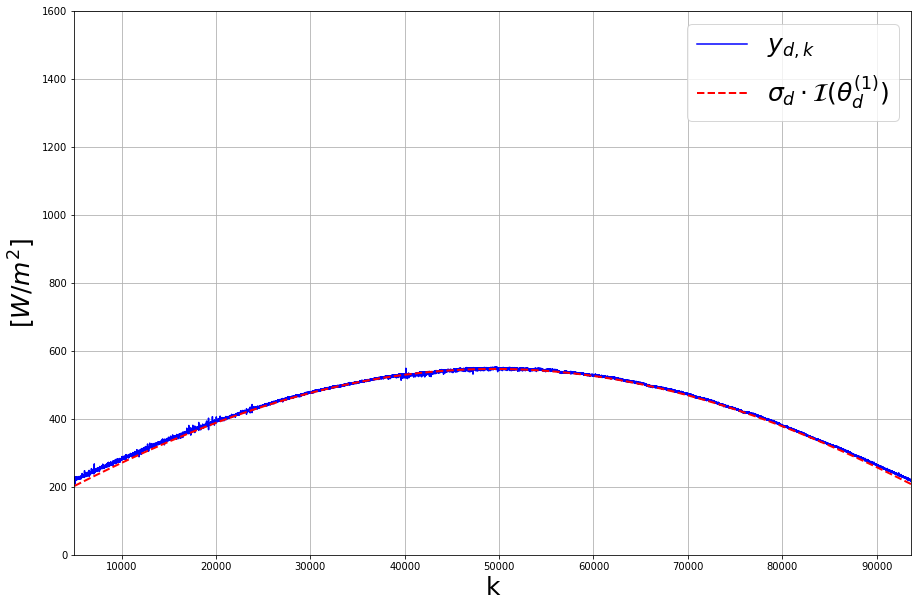

1716.04990066851 1750.653321366303
(98554, 1) (98554, 1) (98554, 1)
2017-12-19 08:15:09.007693
Th. Coeff.:  1233.0575341379315 0.1412091528796599 0.057524746148182745  RMSE:  189.28486993506866
Em. Coeff.:  1777.830502296276 0.07674349051998881 0.0  RMSE:  24.881246101116954
Am. Coeff.:  1.469383619999075


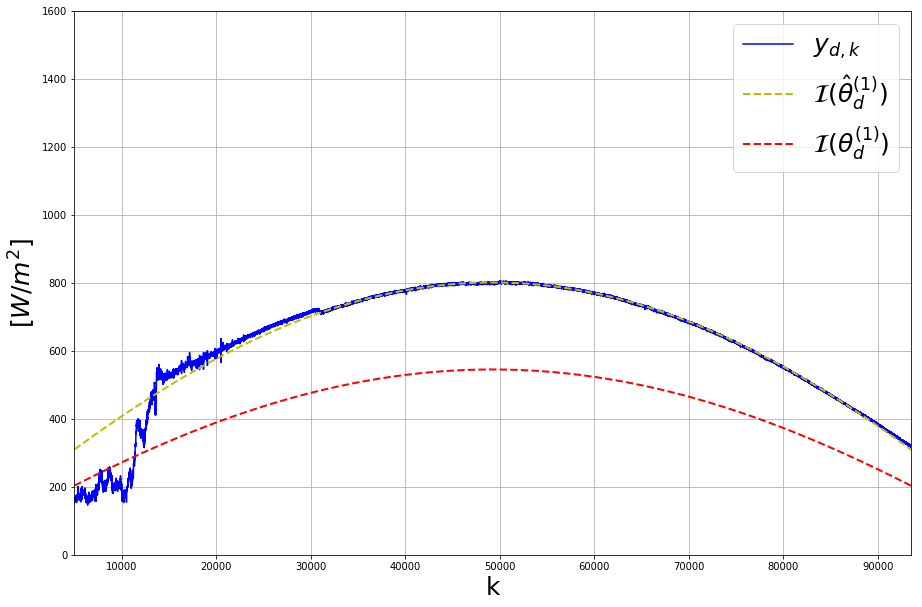

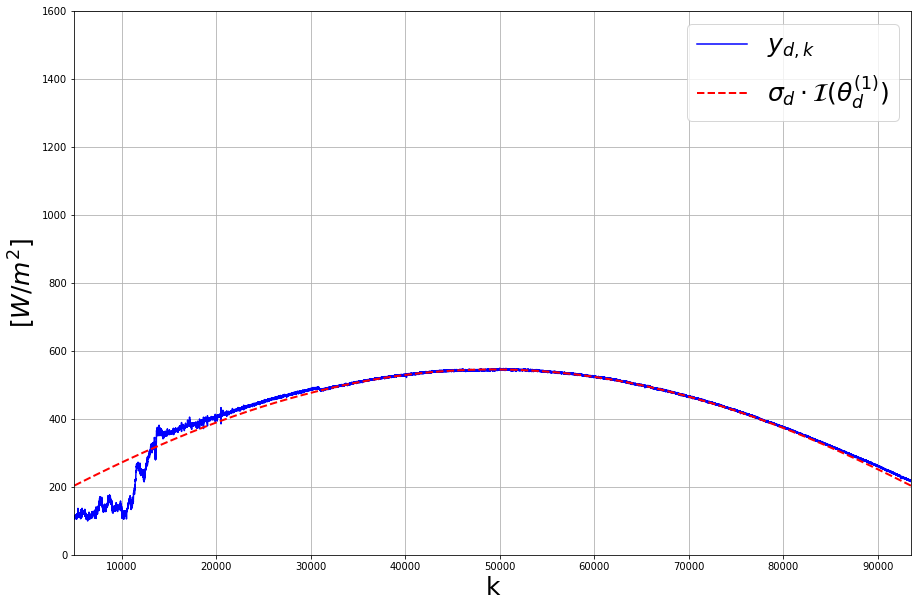

2022.6161557133262 2060.3891849170595
(98532, 1) (98532, 1) (98532, 1)
2017-12-20 08:15:39.008331
Th. Coeff.:  1233.3386256129243 0.14100335998133526 0.057289554264383175  RMSE:  205.70901908445998
Em. Coeff.:  1735.6984992994765 0.06236001859878834 1.0357490162479526e-06  RMSE:  11.940482280136617
Am. Coeff.:  1.4743286976386394


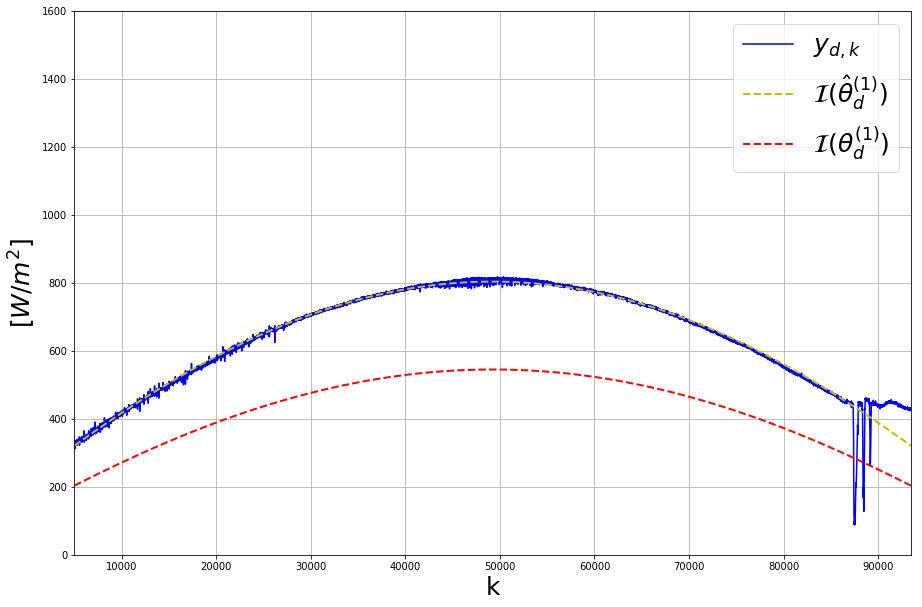

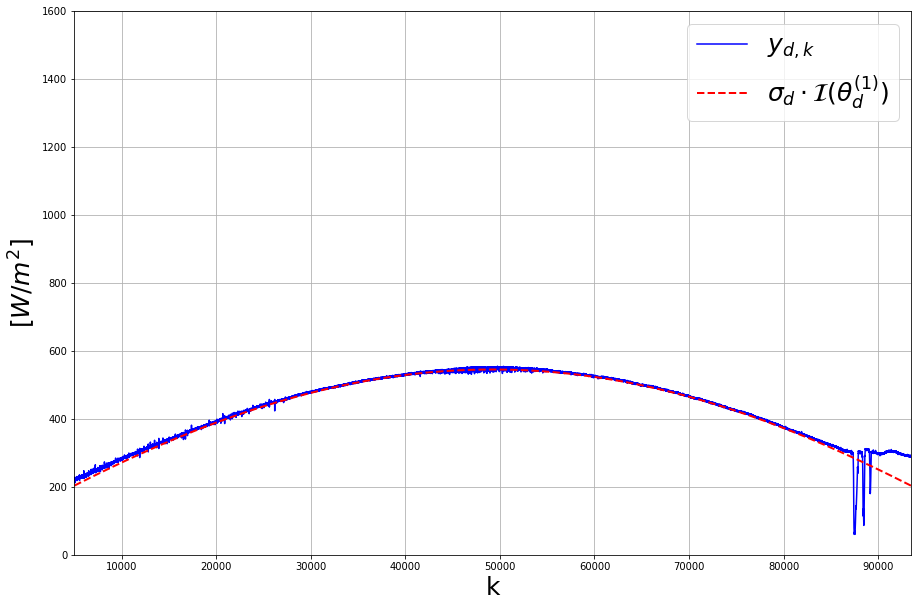

2356.6484616530174 2400.7339934742886
(99129, 1) (99129, 1) (99129, 1)
2018-01-01 08:19:46.005015
Th. Coeff.:  1234.9993054802142 0.13931100776022906 0.055355437440261814  RMSE:  213.3457329193842
Em. Coeff.:  1736.6606818139019 0.05494435062359246 5.1239698790312505e-06  RMSE:  4.130056148874653
Am. Coeff.:  1.4932546408953706


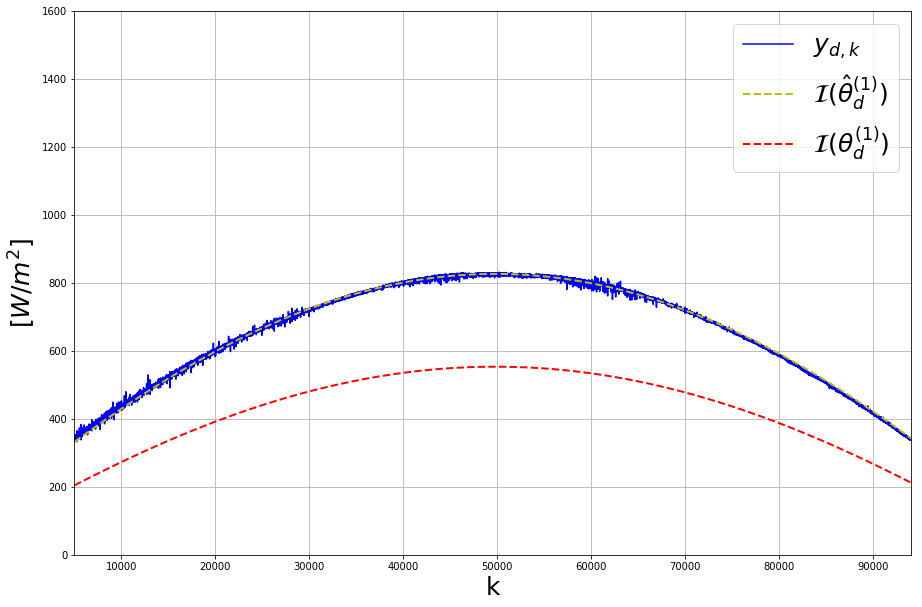

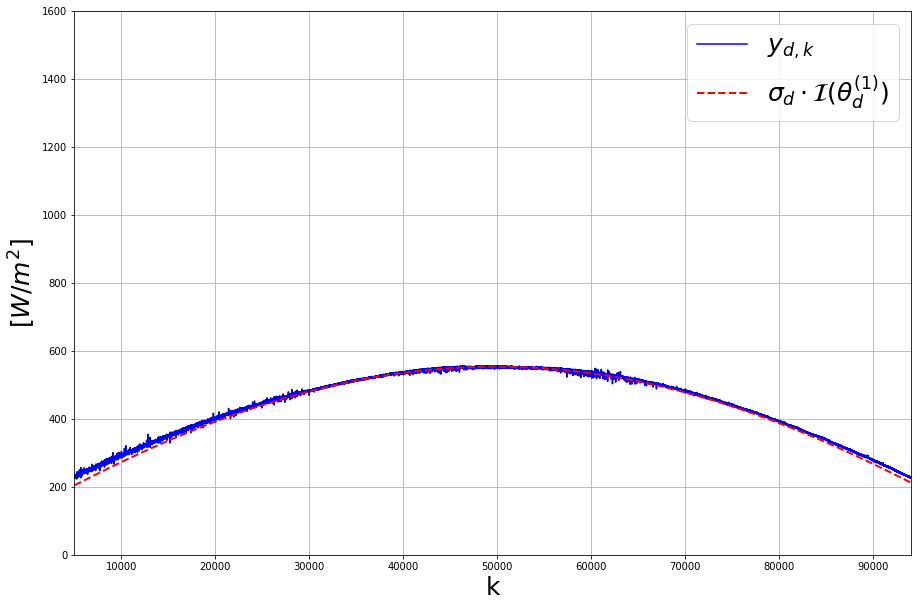

2704.819541194862 2756.654202479926
(100776, 1) (100776, 1) (100776, 1)
2018-01-11 08:20:10.004544
Th. Coeff.:  1233.9461112472873 0.13902624960661106 0.05502999955041266  RMSE:  221.8726551054752
Em. Coeff.:  1762.2551121590968 0.05837984044305264 0.0  RMSE:  4.874799830350962
Am. Coeff.:  1.504138751919822


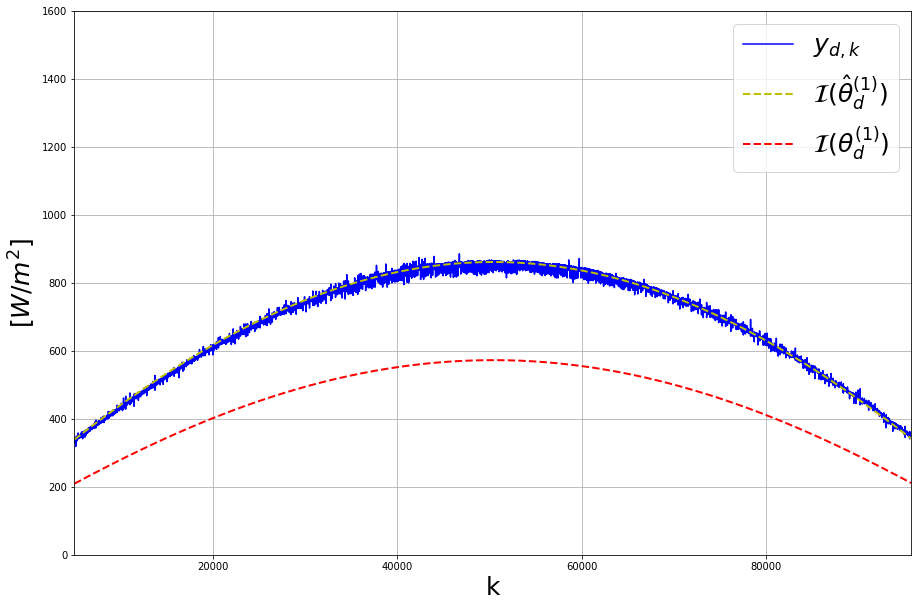

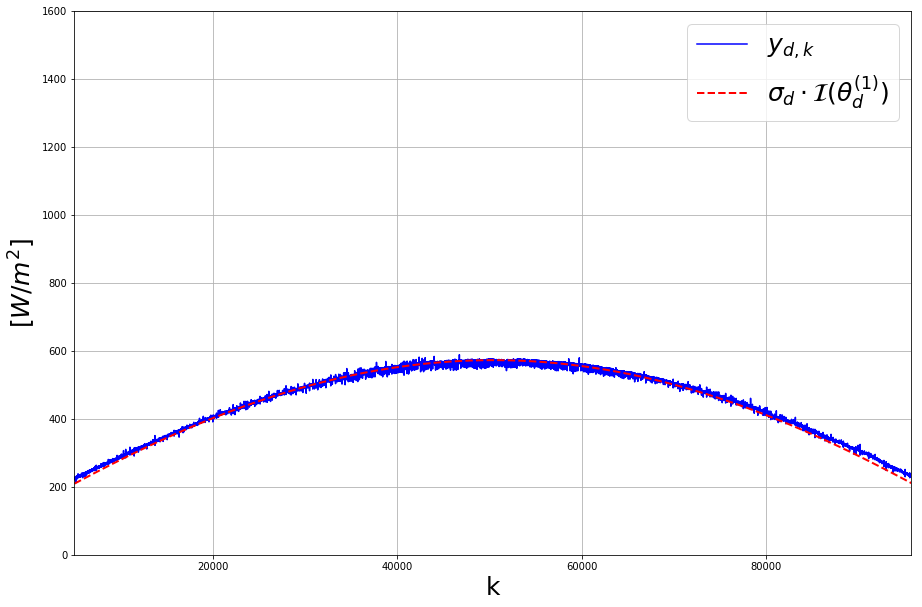

3067.657466258319 3126.63896313438
(101020, 1) (101020, 1) (101020, 1)
2018-01-12 08:20:03.005042
Th. Coeff.:  1233.7194913984986 0.13905476025955524 0.05506258315377743  RMSE:  208.86207276622673
Em. Coeff.:  1738.3612182140535 0.059462072595663024 2.0790085074478724e-07  RMSE:  16.056409618194497
Am. Coeff.:  1.4807530865601948


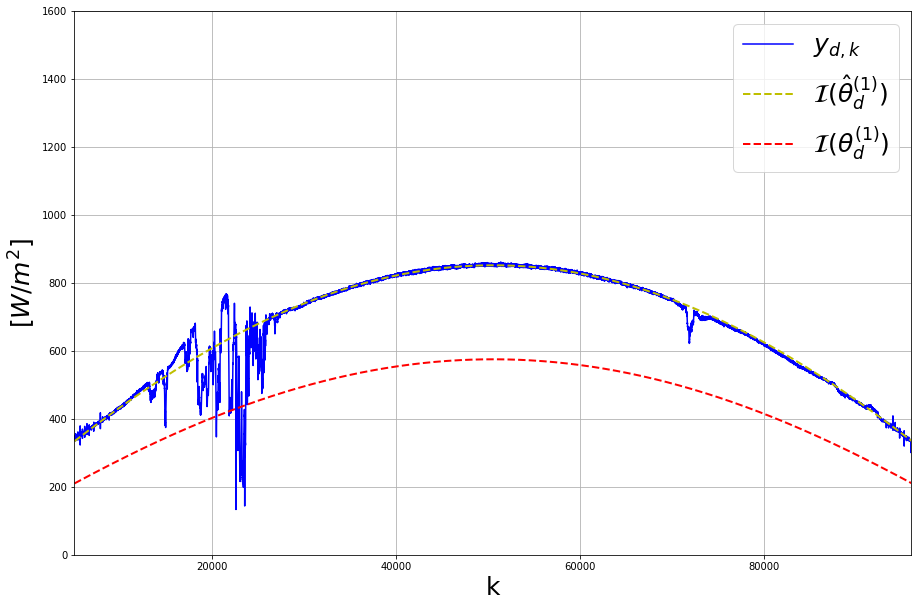

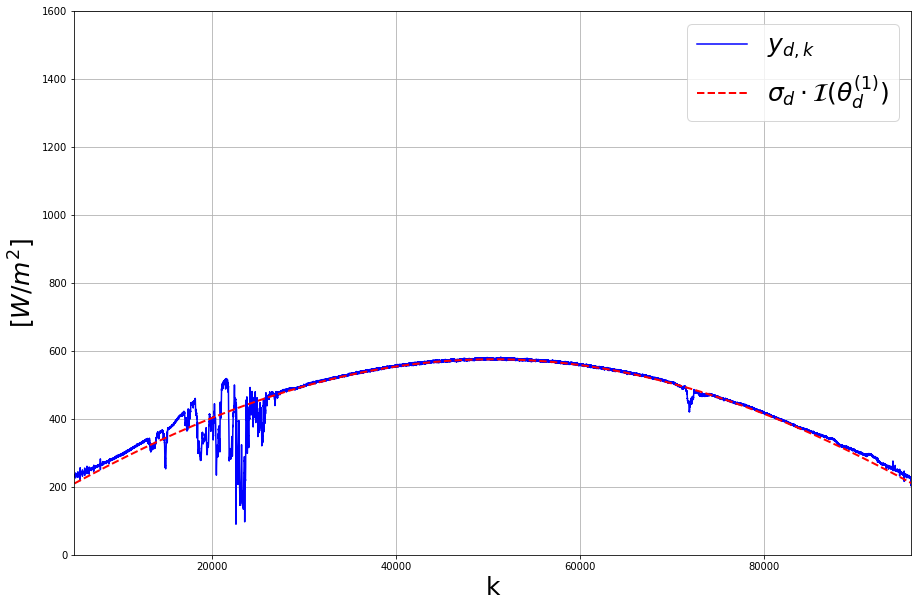

3411.753559839275 3477.7284688667423
(101237, 1) (101237, 1) (101237, 1)
2018-01-13 08:19:54.005823
Th. Coeff.:  1233.4710268734118 0.13909362594121455 0.05510700107567378  RMSE:  217.4981131943566
Em. Coeff.:  1445.6308953634327 0.2411262076200075 0.3711239923502443  RMSE:  8.886663412986188
Am. Coeff.:  1.4824174684644607


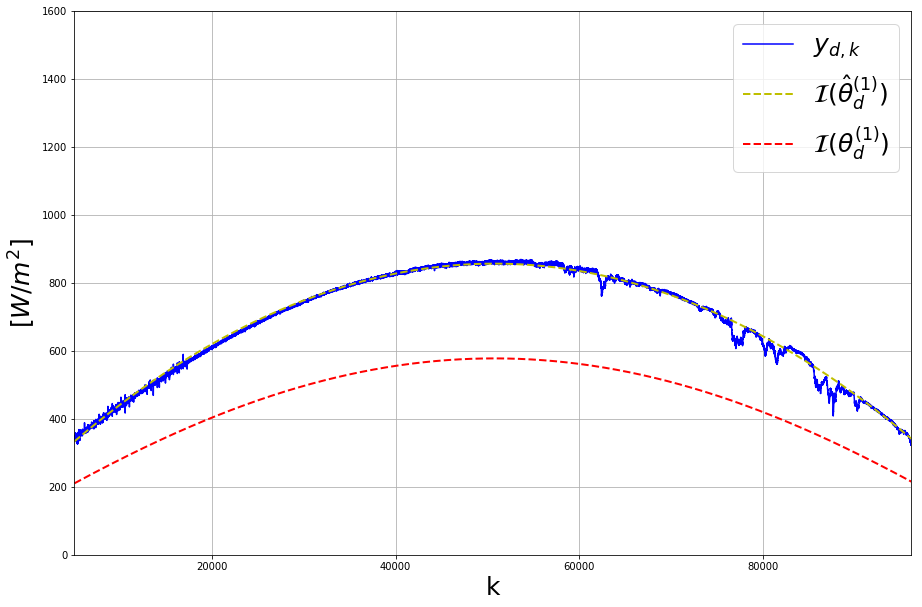

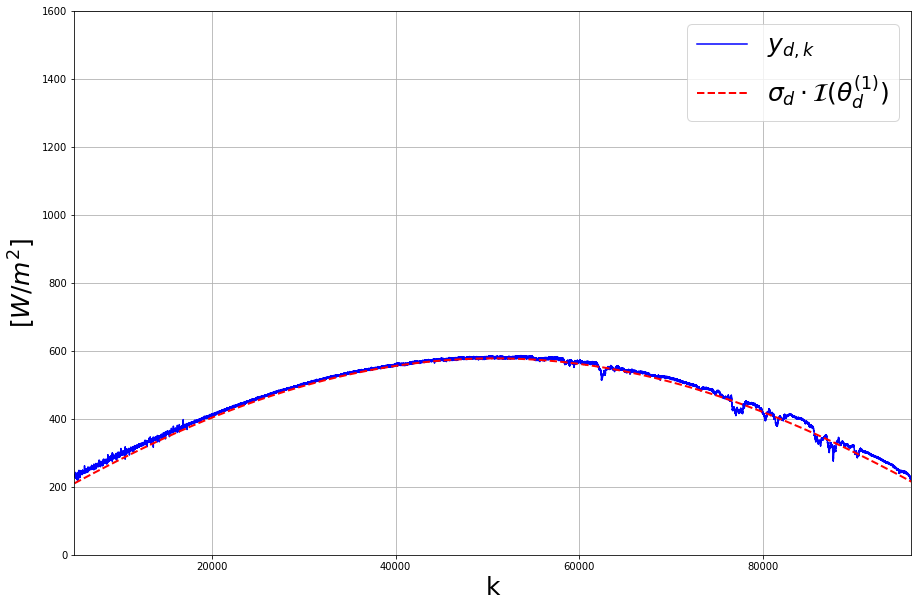

3767.4990606513816 3841.782649794748
(103577, 1) (103577, 1) (103577, 1)
2018-01-22 08:17:16.010969
Th. Coeff.:  1230.2661009721573 0.13990648406896528 0.05603598179310318  RMSE:  246.2160174073432
Em. Coeff.:  1779.5200269460781 0.05276547015528411 0.0  RMSE:  6.901939101030868
Am. Coeff.:  1.53407132883003


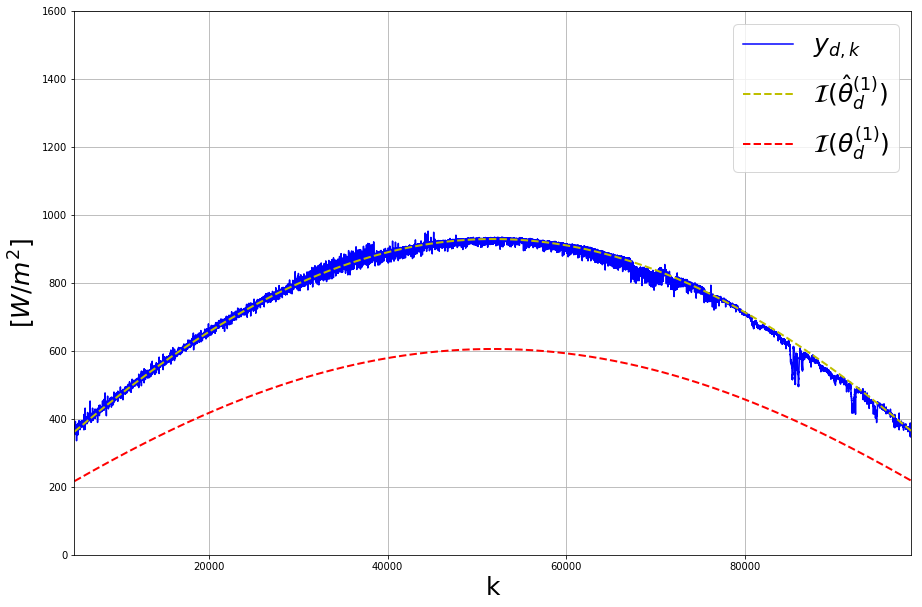

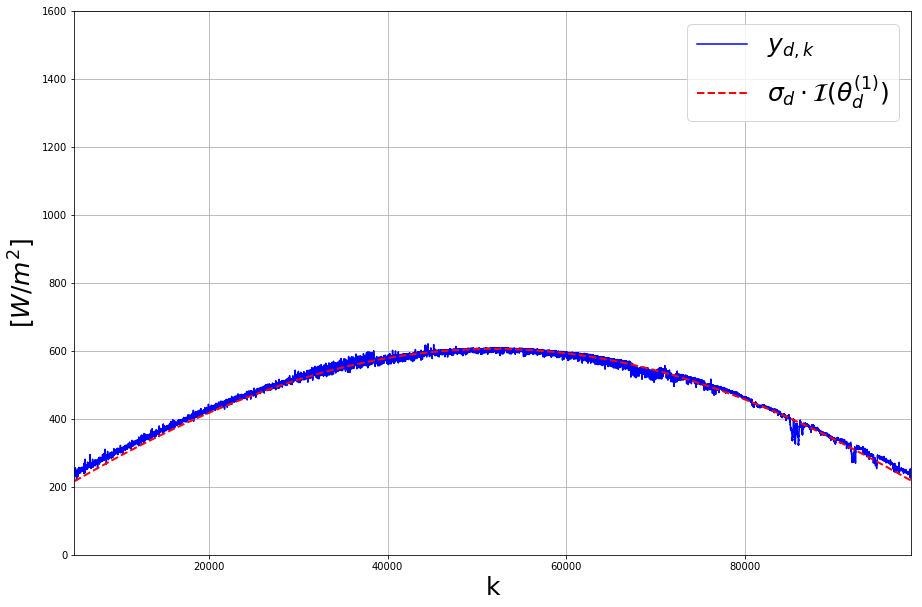

4167.796595753172 4250.526057900973
(104239, 1) (104239, 1) (104239, 1)
2018-01-24 08:16:22.005041
Th. Coeff.:  1229.321804164482 0.14019910218208007 0.0563704024938058  RMSE:  249.48825134634163
Em. Coeff.:  1789.5160972758033 0.05778440669967408 0.0  RMSE:  3.5126448337160867
Am. Coeff.:  1.5294815211121708


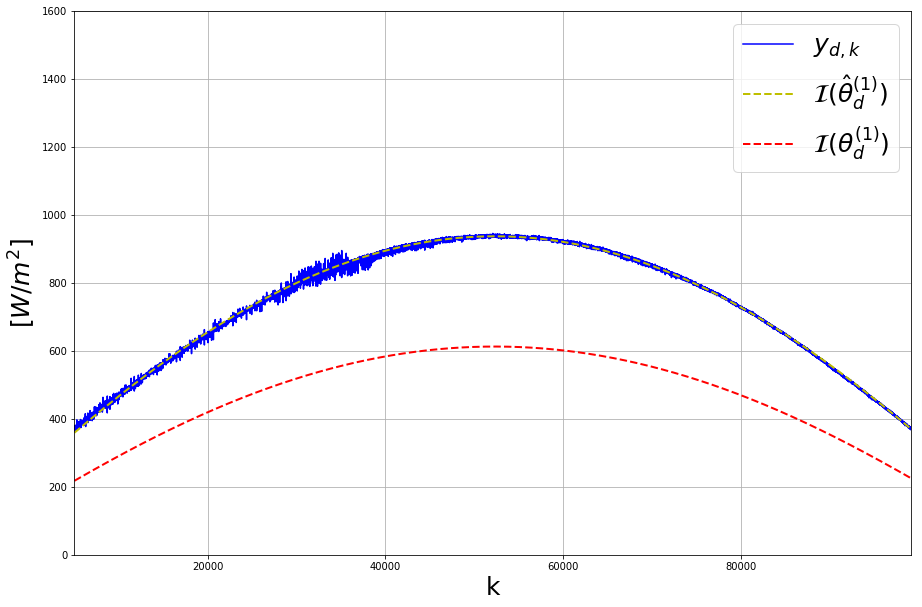

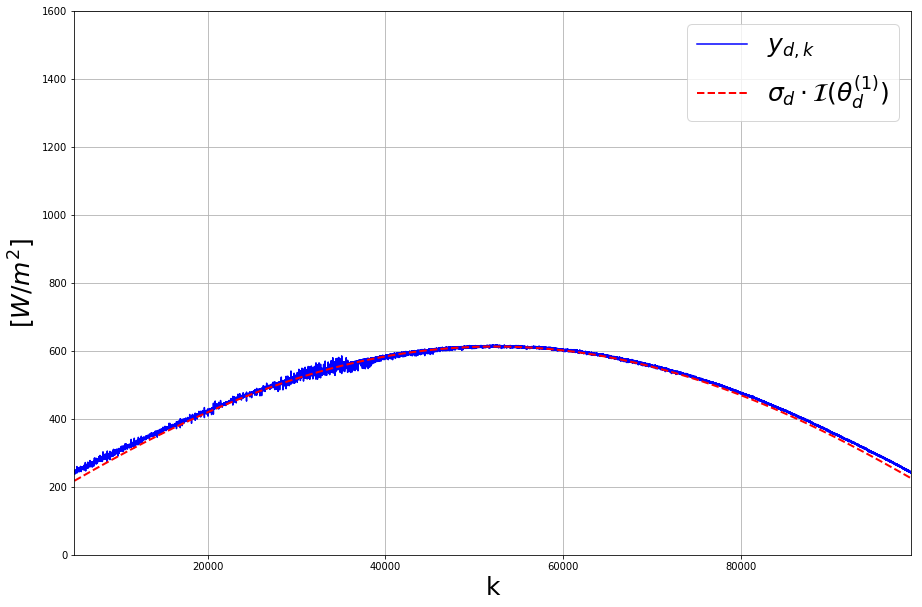

4572.859033554166 4662.8961312628035
(105212, 1) (105212, 1) (105212, 1)
2018-01-27 08:14:49.005232
Th. Coeff.:  1227.7516851743512 0.1407130219296696 0.056957739348193856  RMSE:  260.5889765842723
Em. Coeff.:  1778.0561224332532 0.050123826535247204 0.0  RMSE:  3.3728349325684297
Am. Coeff.:  1.5401222250412019


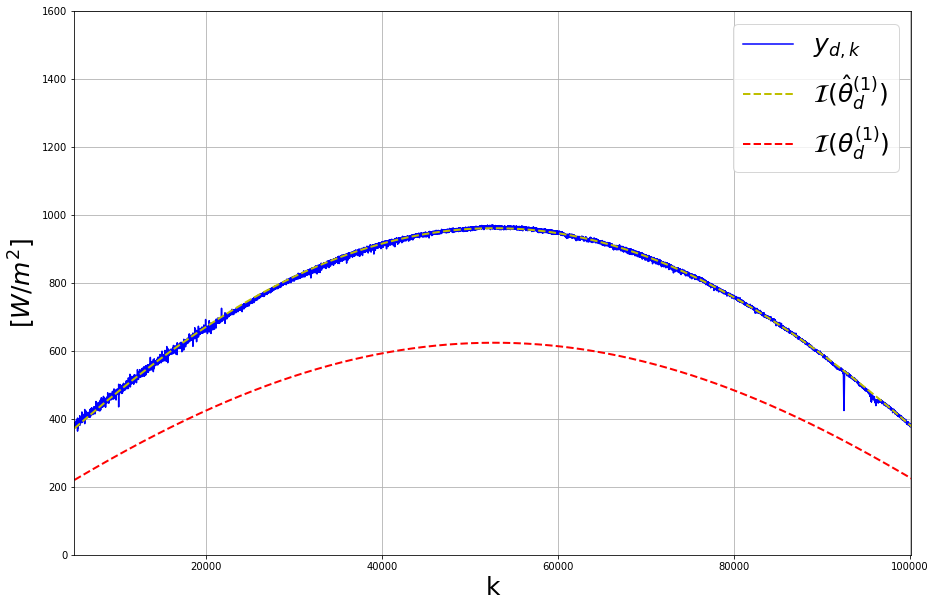

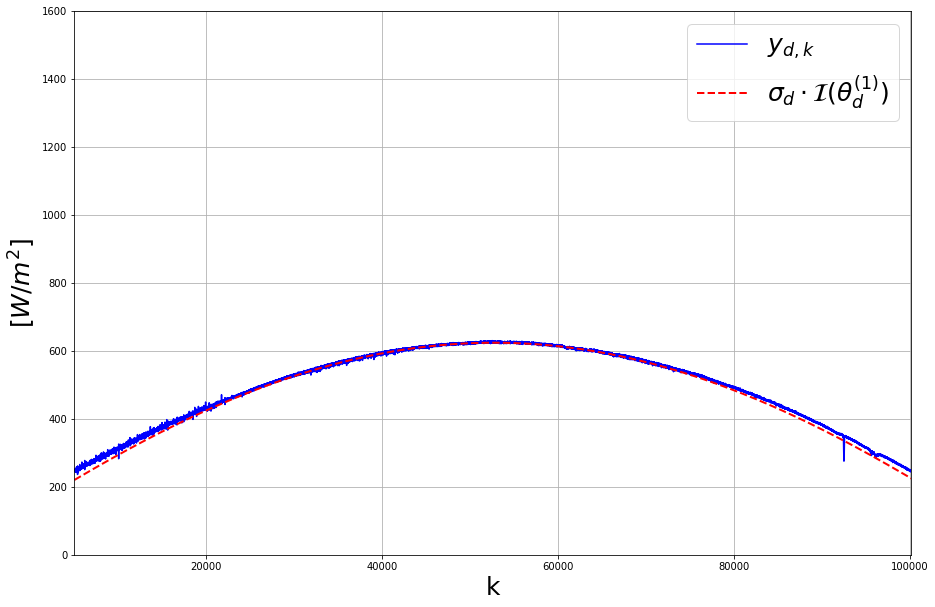

4993.601835177066 5092.713197585477
(107368, 1) (107368, 1) (107368, 1)
2018-02-02 08:10:58.006303
Th. Coeff.:  1224.074162731237 0.1420055204135133 0.05843488047258665  RMSE:  238.64224640718987
Em. Coeff.:  1737.2938647169249 0.05951494457845195 0.0  RMSE:  3.011759640400202
Am. Coeff.:  1.4827202841680995


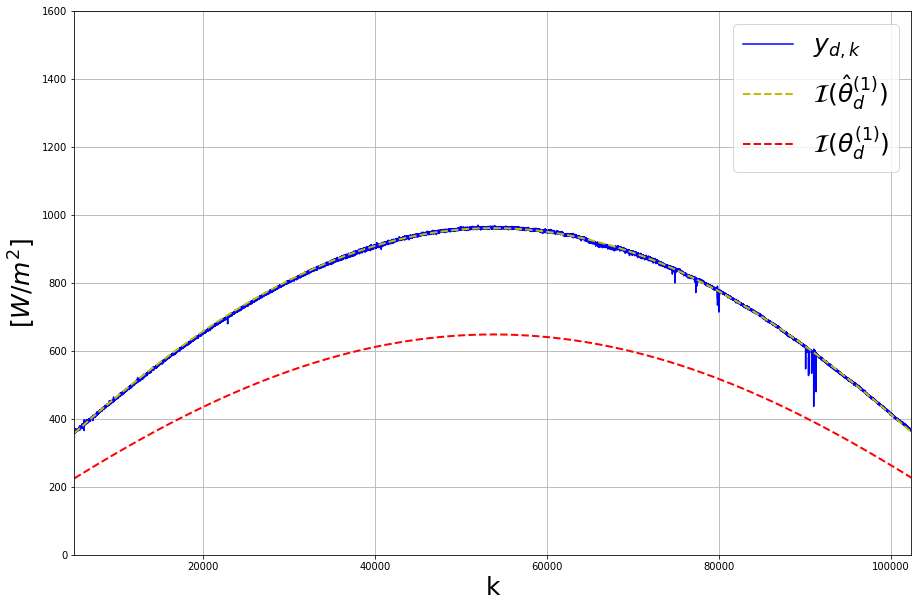

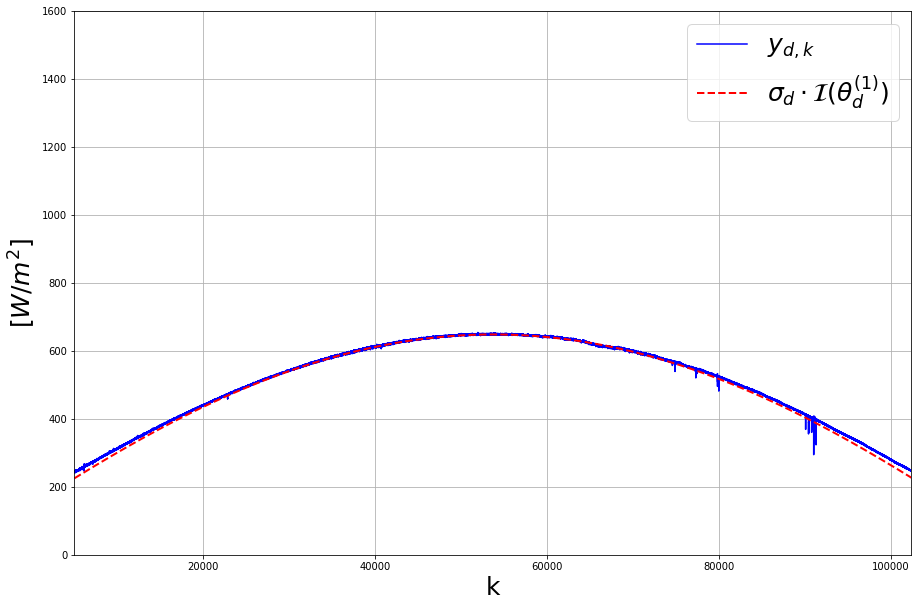

5386.196644122698 5492.748814516986
(109296, 1) (109296, 1) (109296, 1)
2018-02-07 08:07:03.001555
Th. Coeff.:  1220.4859959740709 0.14334379031995148 0.05996433179423029  RMSE:  257.2744706234765
Em. Coeff.:  1745.6481402420839 0.05578006300441179 9.82809046170096e-06  RMSE:  5.55243205725956
Am. Coeff.:  1.5007835276527743


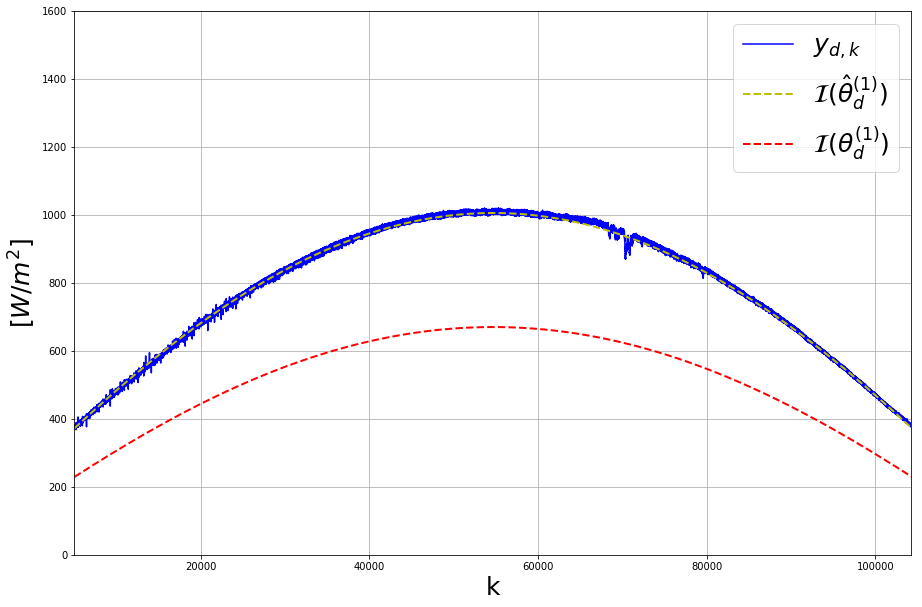

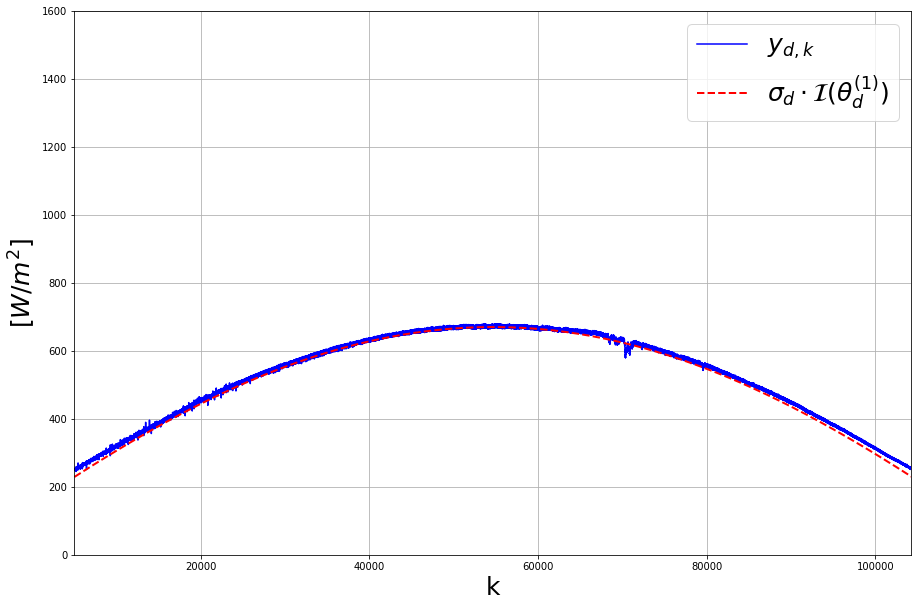

5805.6489378882725 5920.570099216951
(110833, 1) (110833, 1) (110833, 1)
2018-02-11 08:03:28.001646
Th. Coeff.:  1217.2916459592907 0.14457835580279324 0.061375263774620874  RMSE:  275.2960843540802
Em. Coeff.:  1761.3872813783275 0.053178459948189566 0.0  RMSE:  4.658273887851153
Am. Coeff.:  1.5222425469659544


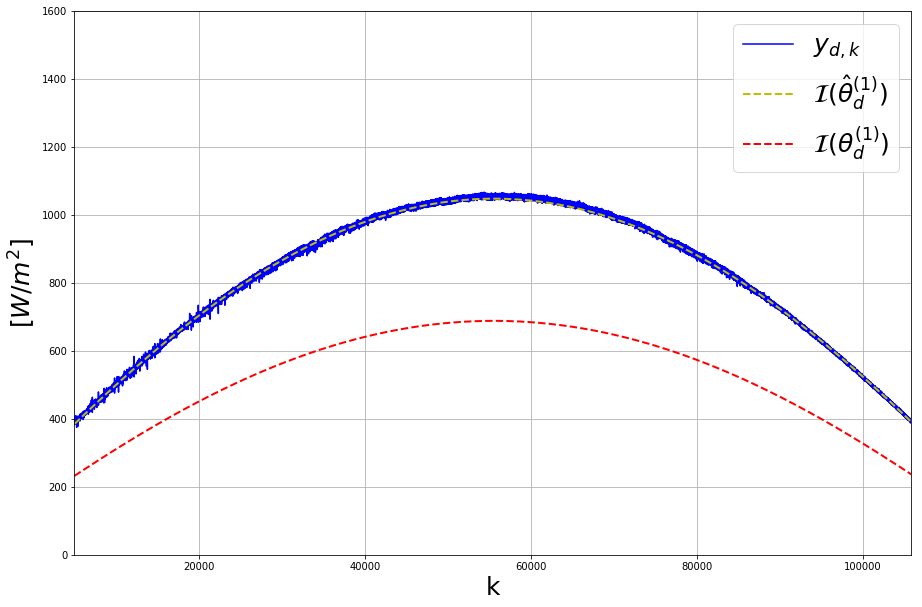

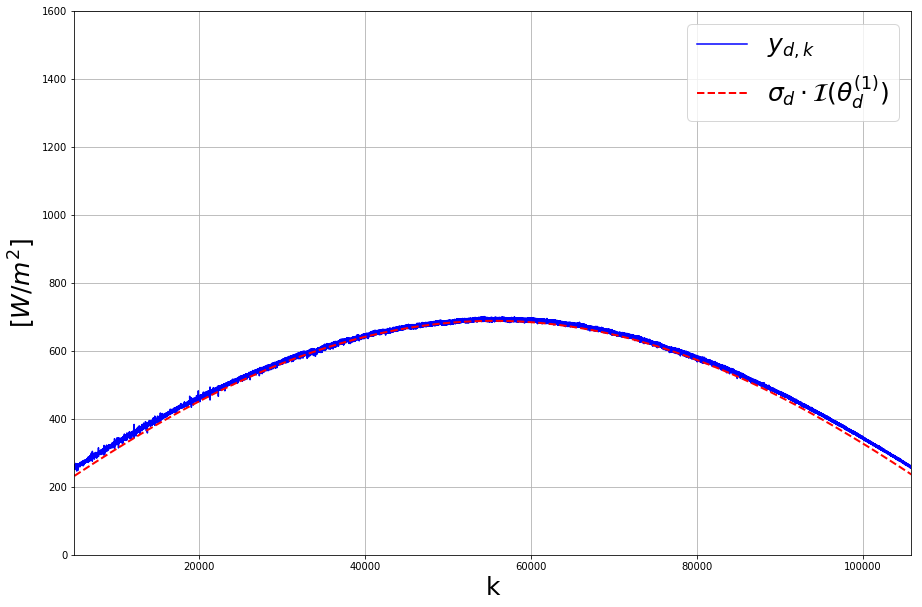

6252.536835634695 6376.42852763477
(117420, 1) (117420, 1) (117420, 1)
2018-02-26 07:47:05.001206
Th. Coeff.:  1203.0329200928243 0.15039447334084688 0.06802225524668218  RMSE:  328.3286349297335
Em. Coeff.:  1837.4968453106176 0.062462937102417425 0.0  RMSE:  4.498026765912238
Am. Coeff.:  1.5774431027119773


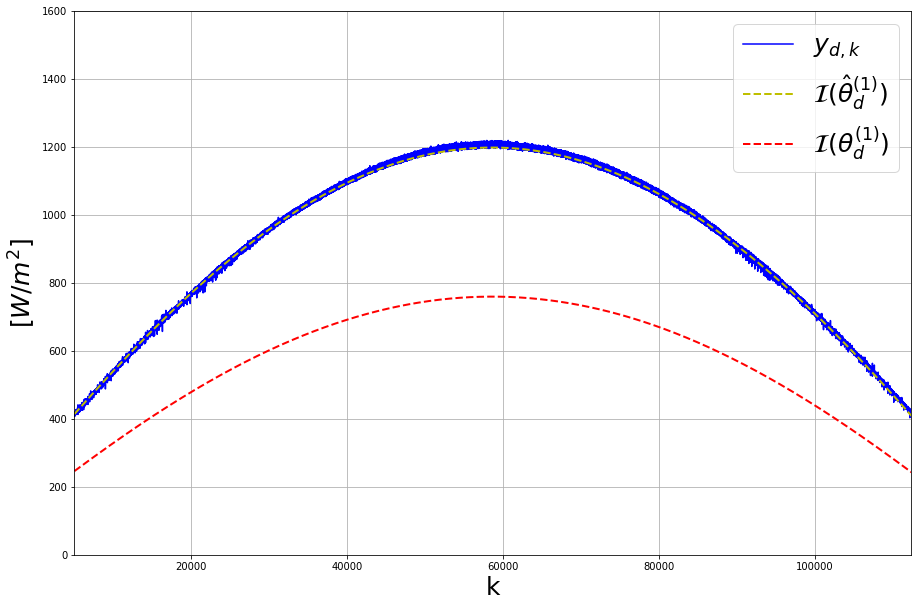

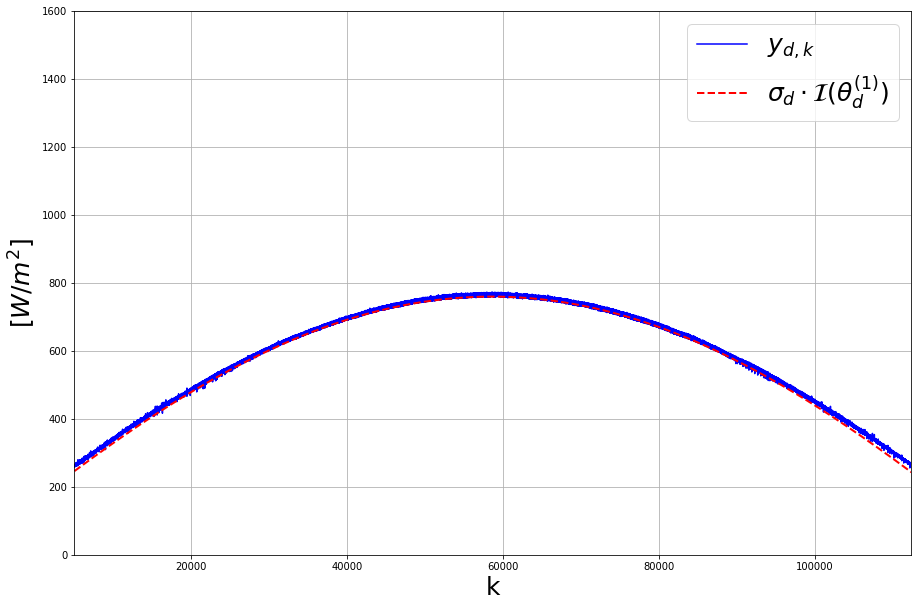

6781.550578436079 6912.402704670522
(118811, 1) (118811, 1) (118811, 1)
2018-03-01 07:43:20.001891
Th. Coeff.:  1199.804753612145 0.1517598694688438 0.0695827079643929  RMSE:  339.24664682054043
Em. Coeff.:  1772.601357397266 0.03977318647772789 4.171591607642652e-06  RMSE:  5.1735395866785305
Am. Coeff.:  1.573097246867761


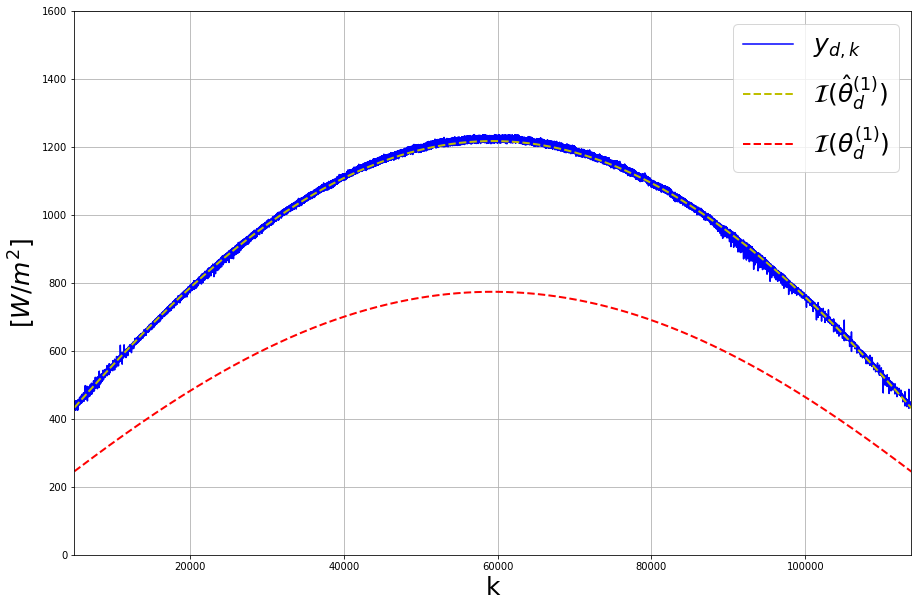

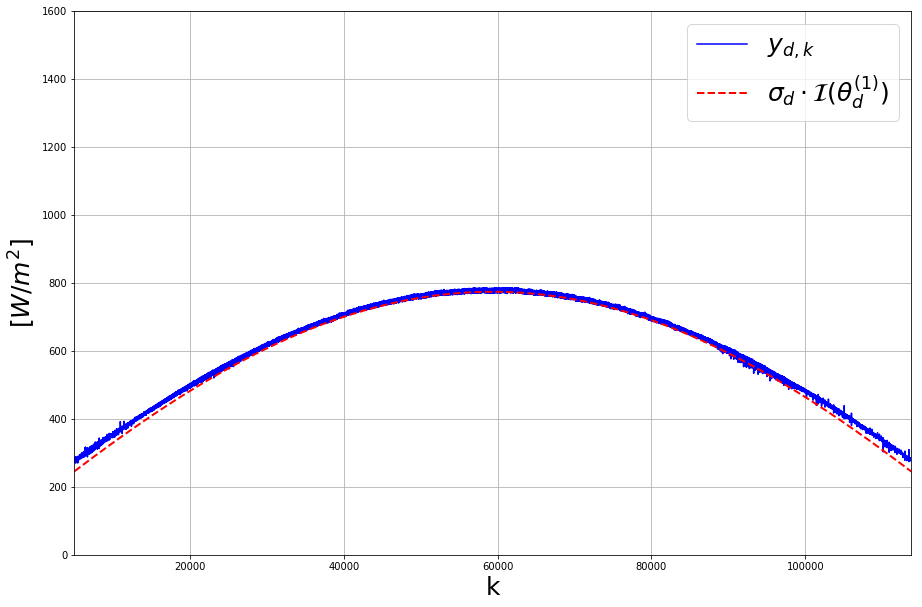

7323.394765361884 7466.97033473926
(119311, 1) (119311, 1) (119311, 1)
2018-03-02 07:42:03.001228
Th. Coeff.:  1198.7046793261889 0.1522283638045696 0.07011813006236531  RMSE:  344.11620491979505
Em. Coeff.:  1806.171876588357 0.049021998136812225 0.0  RMSE:  4.696778150044565
Am. Coeff.:  1.5834607313527964


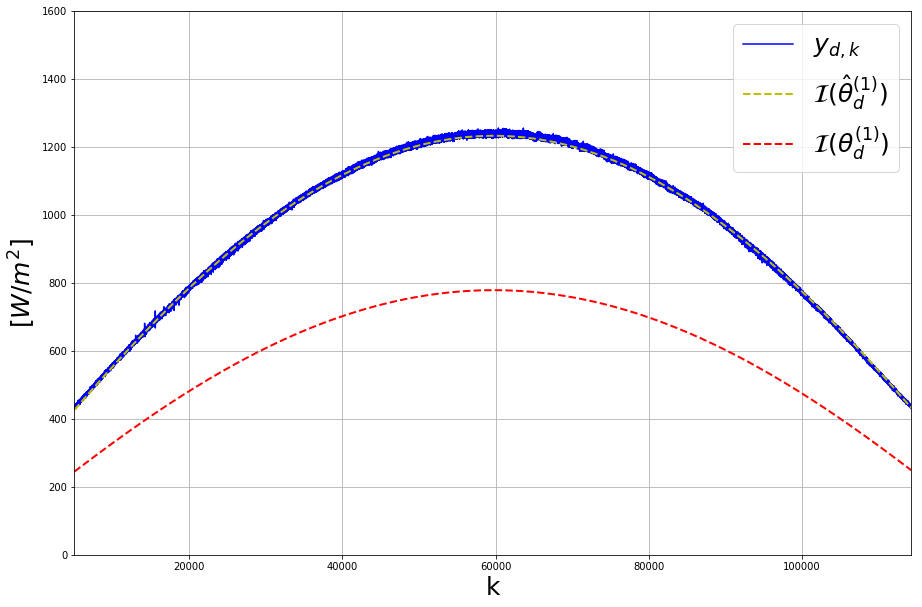

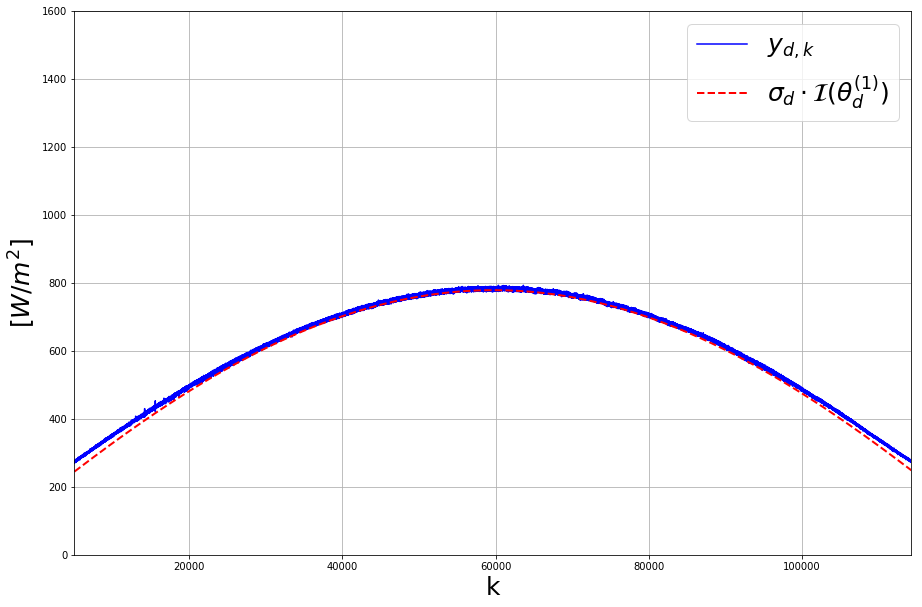

7874.0901942507435 8028.033360891896
(119826, 1) (119826, 1) (119826, 1)
2018-03-03 07:40:45.001810
Th. Coeff.:  1197.5931360084332 0.15270330954597058 0.07066092519539496  RMSE:  340.82158172343173
Em. Coeff.:  1802.5983442006225 0.051016385341847575 0.0  RMSE:  5.758239939467479
Am. Coeff.:  1.576942068666577


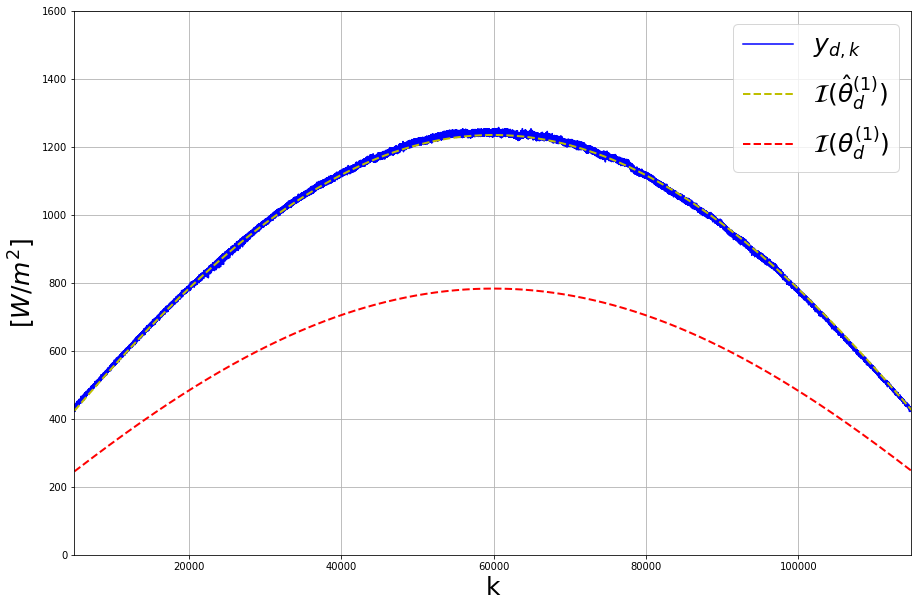

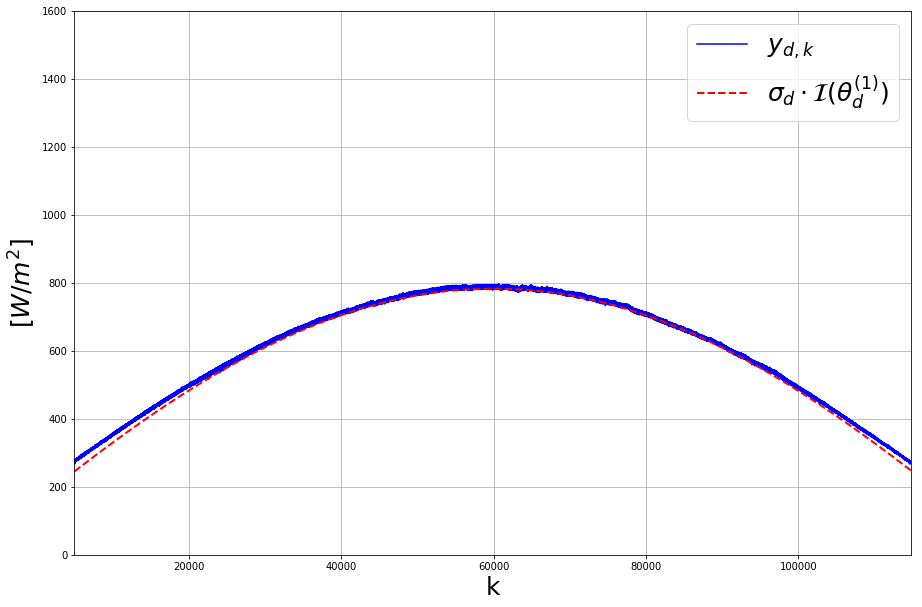

8421.018682916007 8584.955652674596
(120263, 1) (120263, 1) (120263, 1)
2018-03-04 07:39:27.001542
Th. Coeff.:  1196.4704530331517 0.15318456595637325 0.07121093252156946  RMSE:  334.9586855218762
Em. Coeff.:  1773.1038898014056 0.1301173159050674 0.09741071202307962  RMSE:  18.478011757662113
Am. Coeff.:  1.5783358903028881


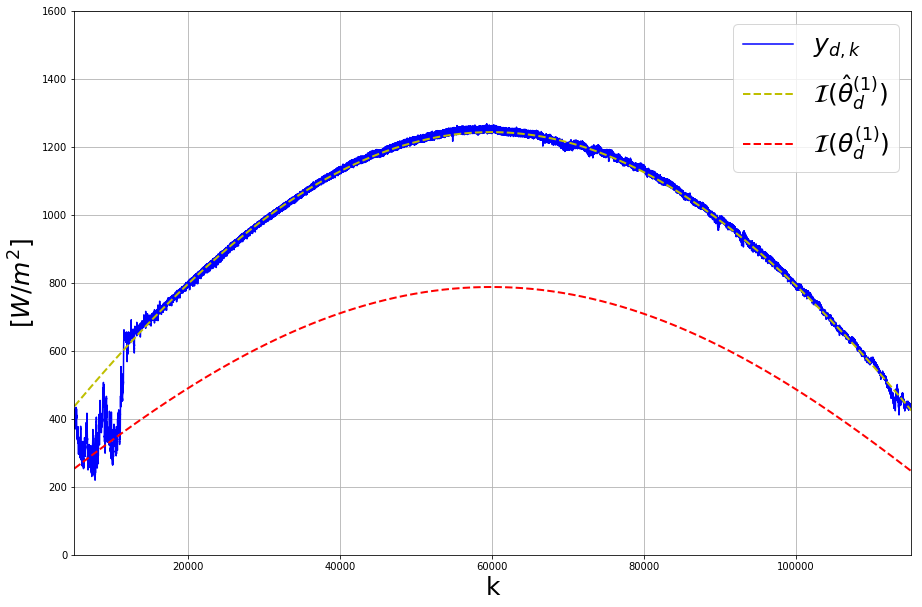

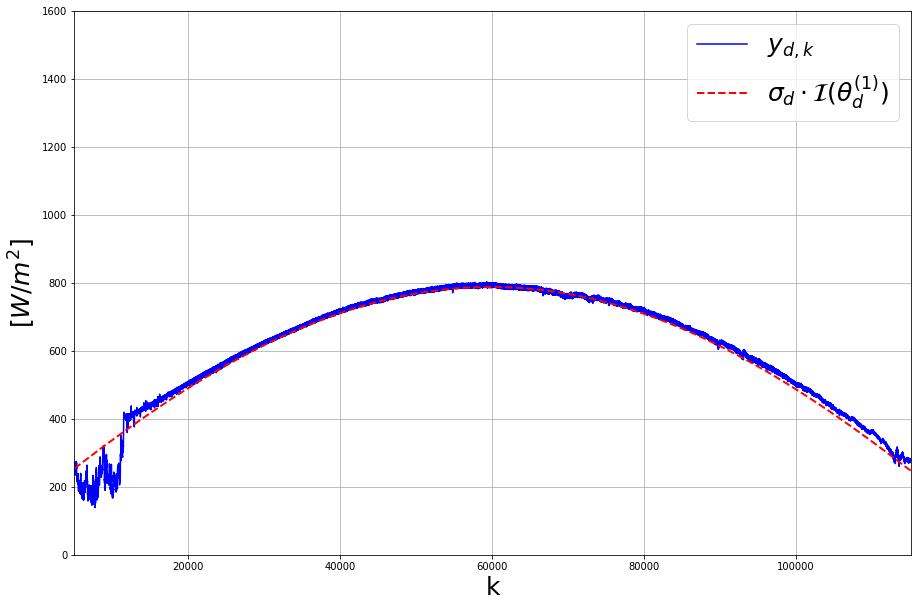

8962.52130115501 9136.709064925317
(135363, 1) (135363, 1) (135363, 1)
2018-04-04 07:55:28.002614
Th. Coeff.:  1158.063616982965 0.17039144058933978 0.09087593210210261  RMSE:  336.39242578330874
Em. Coeff.:  1391.3089244698829 0.48237100310389397 0.8921438340942959  RMSE:  36.581387872560704
Am. Coeff.:  1.5396704032414303


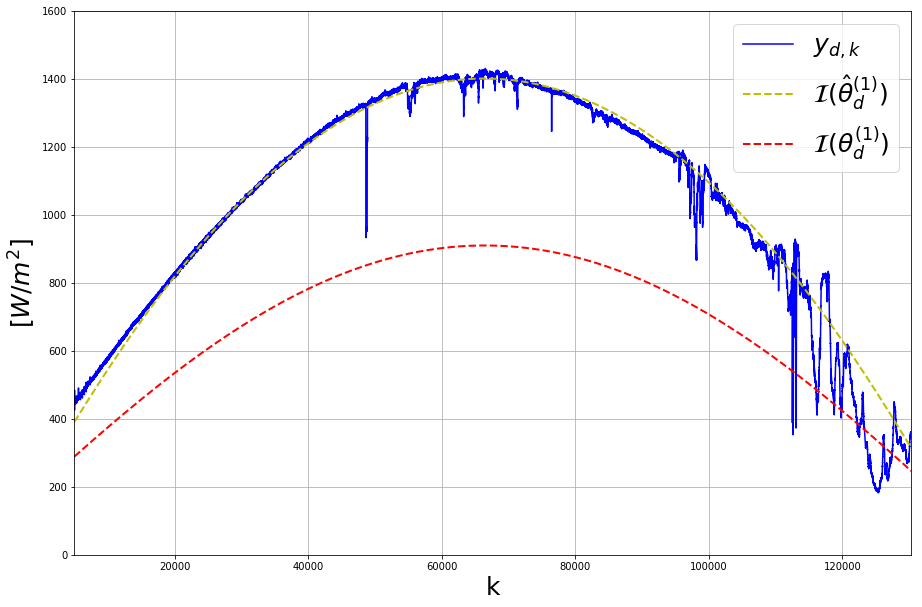

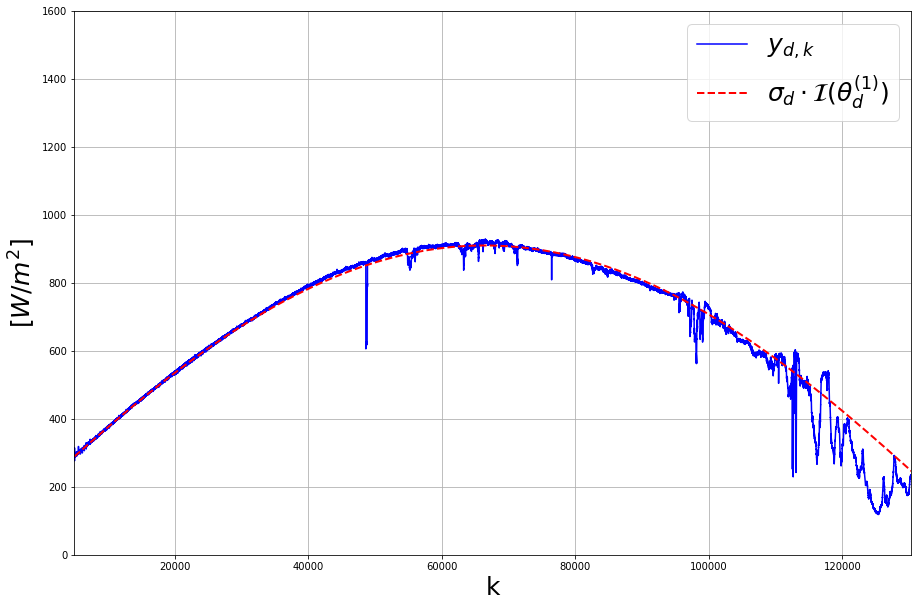

9517.007372216482 9679.97146969892
(137730, 1) (137730, 1) (137730, 1)
2018-04-09 07:48:24.001301
Th. Coeff.:  1151.625574465873 0.17339753253454576 0.09431146575376662  RMSE:  355.9039884131663
Em. Coeff.:  1838.5536777464088 0.10828406796673265 2.8230393520223425e-06  RMSE:  10.109830709375725
Am. Coeff.:  1.5528029809084853


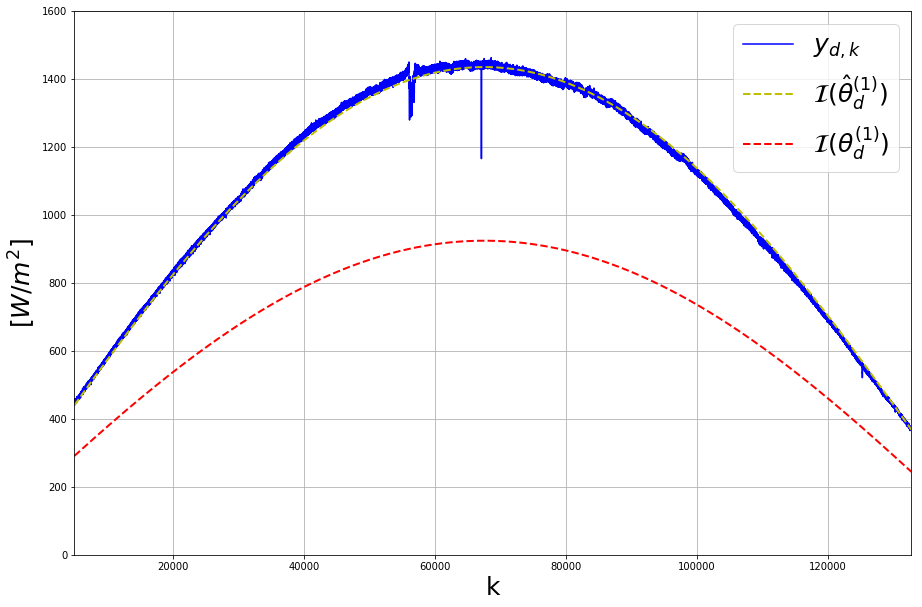

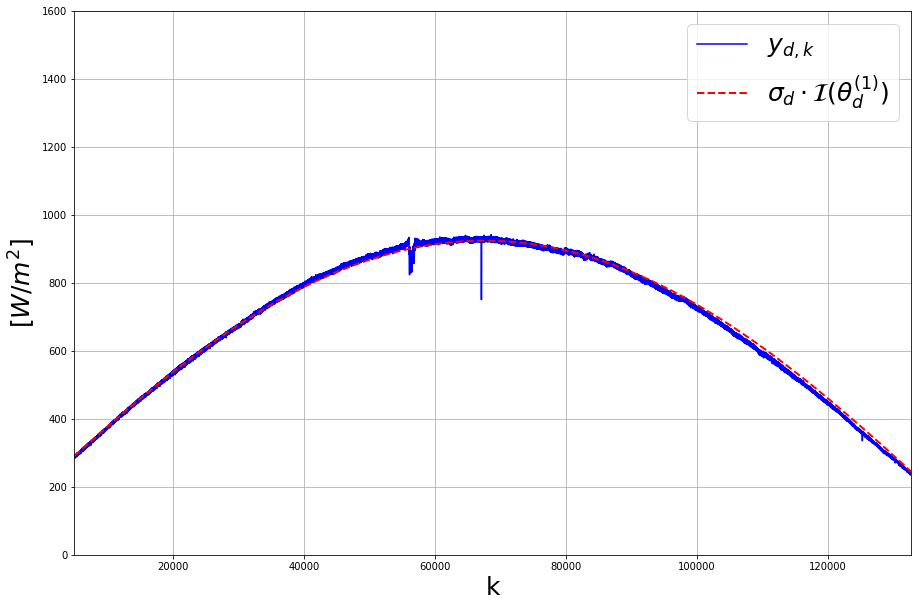

10107.327475680791 10266.339294022238
(140002, 1) (140002, 1) (140002, 1)
2018-04-14 07:41:32.003311
Th. Coeff.:  1145.2495332654817 0.1764080849380812 0.0977520970720928  RMSE:  393.94547107760866
Em. Coeff.:  1847.920605863806 0.09357408586144461 3.474604484132796e-05  RMSE:  18.824206185713876
Am. Coeff.:  1.595824055308382


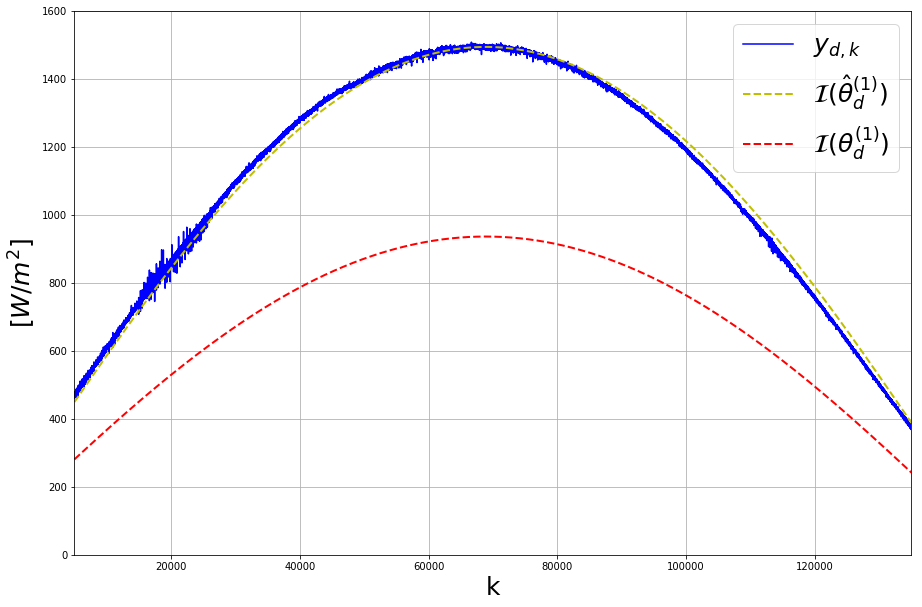

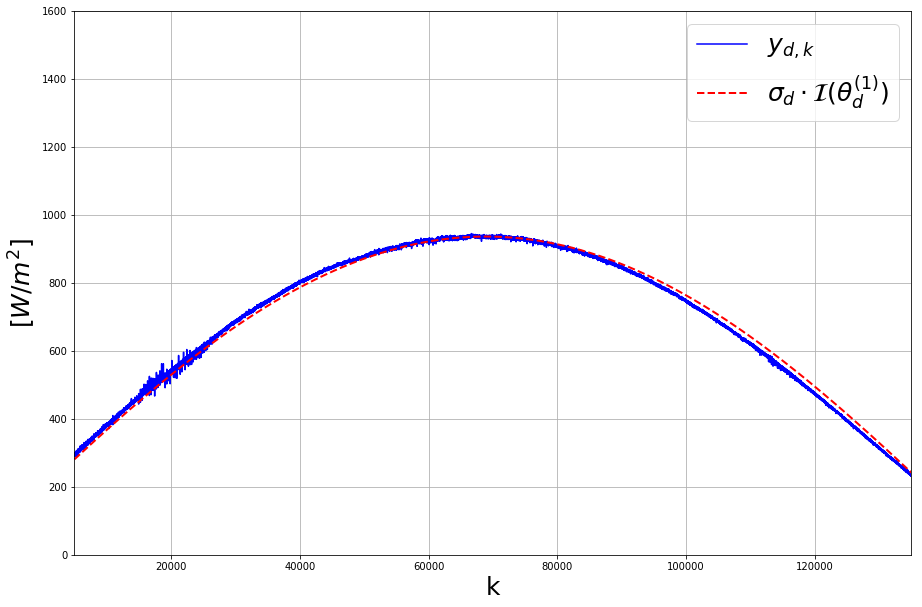

10748.966525446753 10908.034891657919
(141889, 1) (141889, 1) (141889, 1)
2018-04-18 07:36:15.008014
Th. Coeff.:  1140.2250880453994 0.17880475702396426 0.10049115088453059  RMSE:  398.1263551727426
Em. Coeff.:  1898.6516840568556 0.11547438187560344 1.0748428027582517e-05  RMSE:  20.358089610796636
Am. Coeff.:  1.6075913608793693


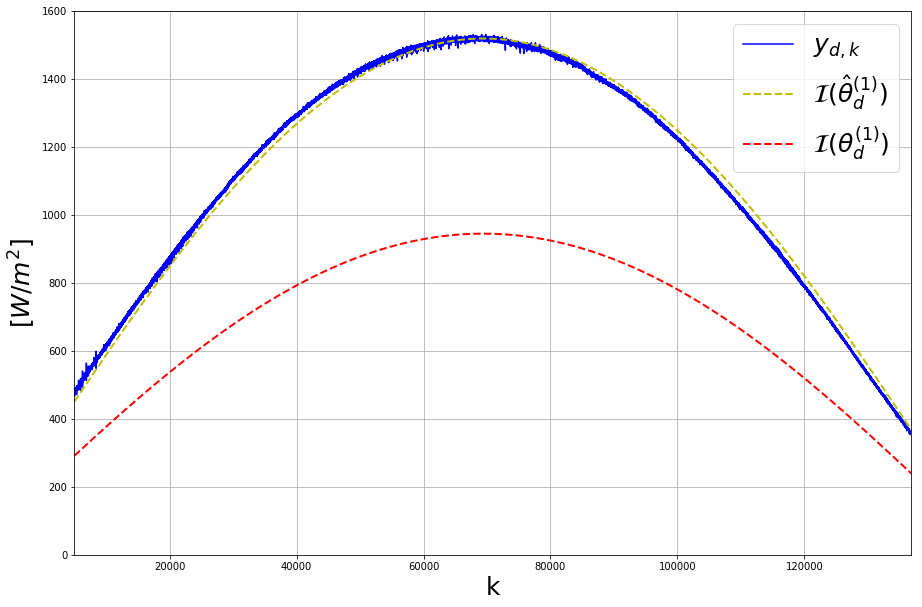

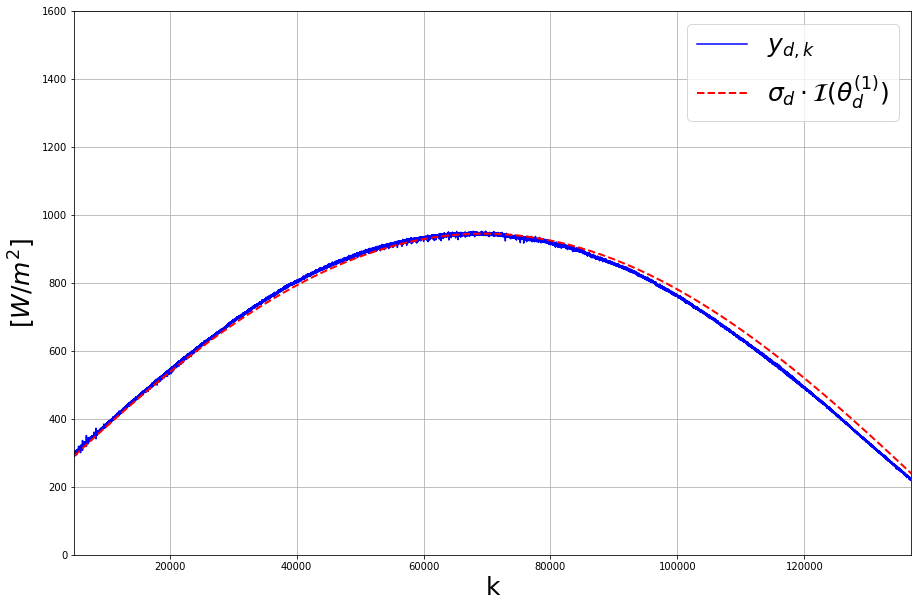

11400.412326077607 11553.947813061513
(144170, 1) (144170, 1) (144170, 1)
2018-04-23 07:29:56.003906
Th. Coeff.:  1134.079076549695 0.18176725295514579 0.10387686052016662  RMSE:  362.7892025273004
Em. Coeff.:  1571.4885588774375 0.3733890304195643 0.49789698754609646  RMSE:  133.47282379156792
Am. Coeff.:  1.5580595100961954


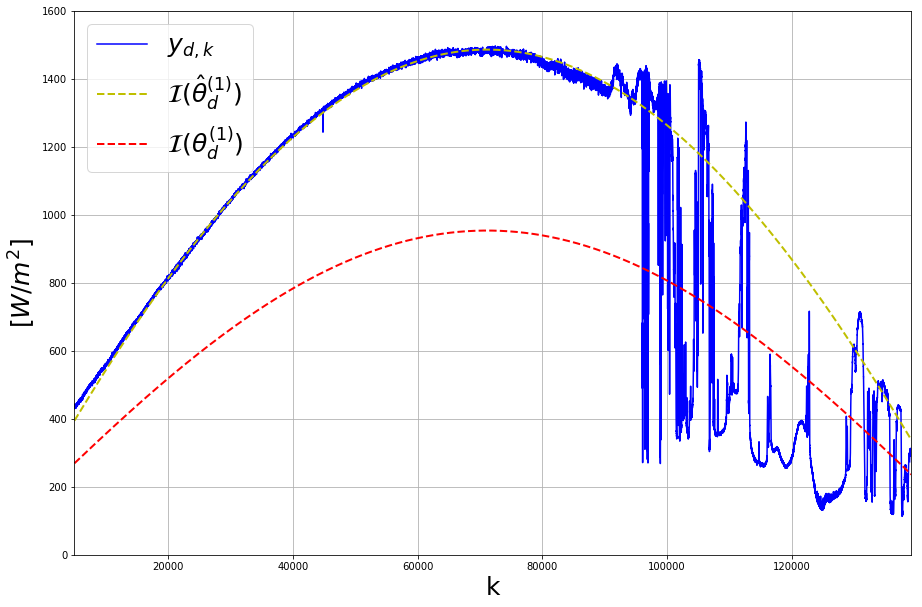

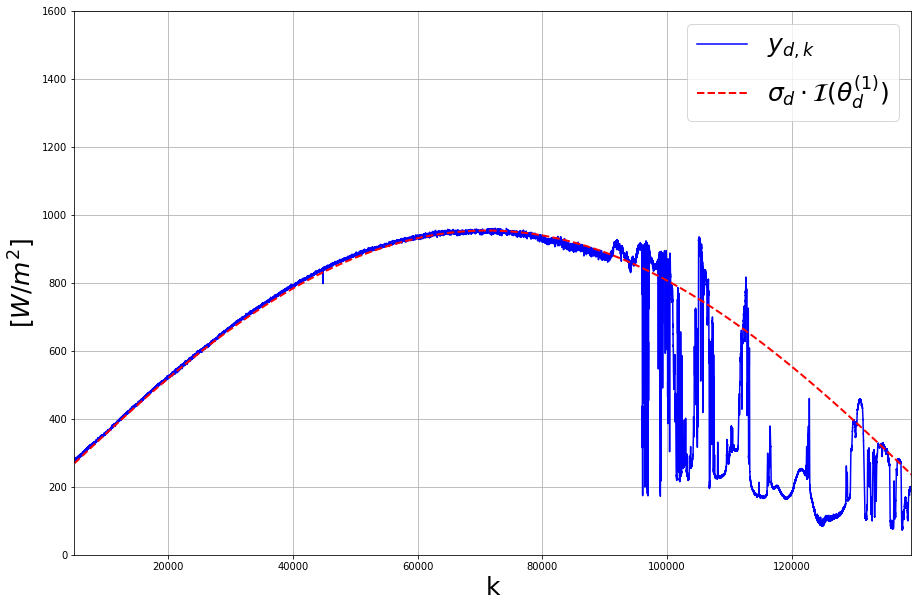

11929.151133414323 12079.760311257258
(153181, 1) (153181, 1) (153181, 1)
2018-05-16 07:06:46.004493
Th. Coeff.:  1108.9419942892239 0.19432800957088303 0.11823201093815204  RMSE:  375.61359695078806
Em. Coeff.:  1773.595725082408 0.10385679497723475 0.0  RMSE:  17.79110227762177
Am. Coeff.:  1.5647255238359963


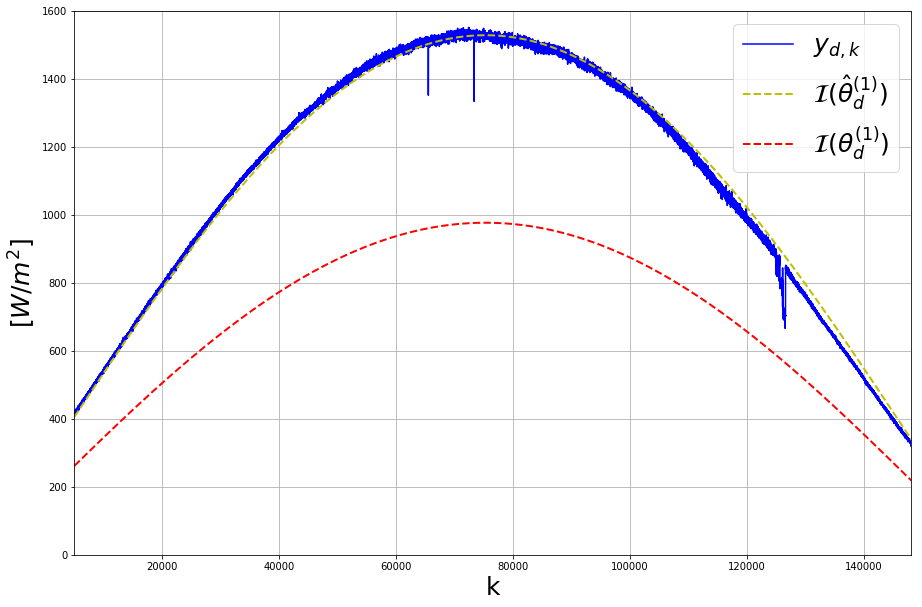

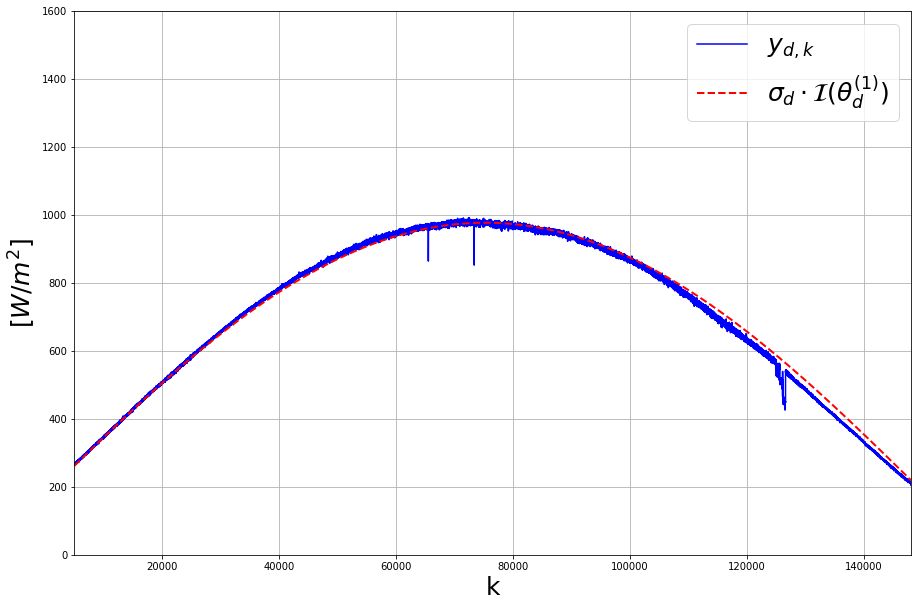

12549.919146309878 12698.622740602817
(154146, 1) (154146, 1) (154146, 1)
2018-05-19 07:04:38.002593
Th. Coeff.:  1106.1742314743028 0.19577163619543037 0.1198818699376347  RMSE:  384.32300251085627
Em. Coeff.:  1659.707343366464 0.25810783411867133 0.24483181222695505  RMSE:  18.77719459549498
Am. Coeff.:  1.5685879075965408


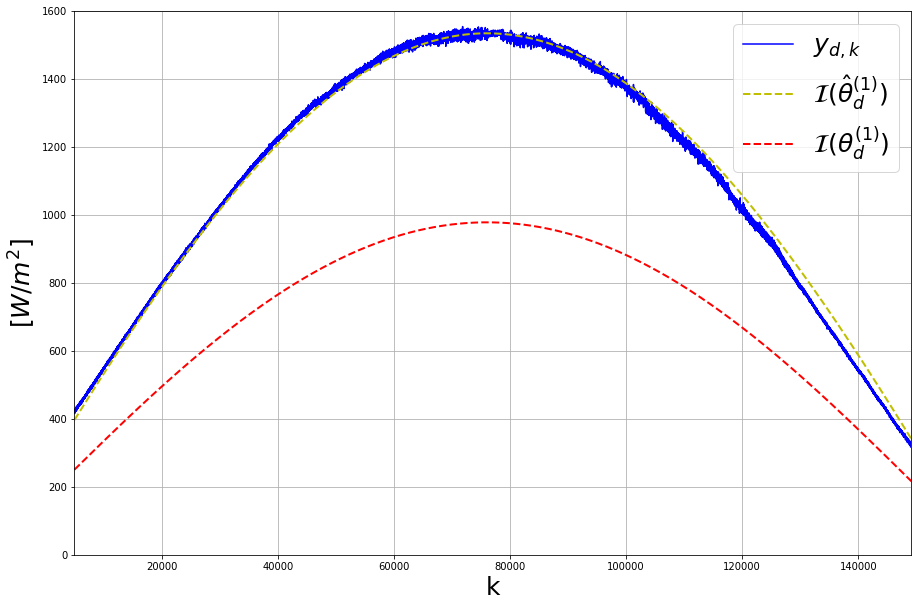

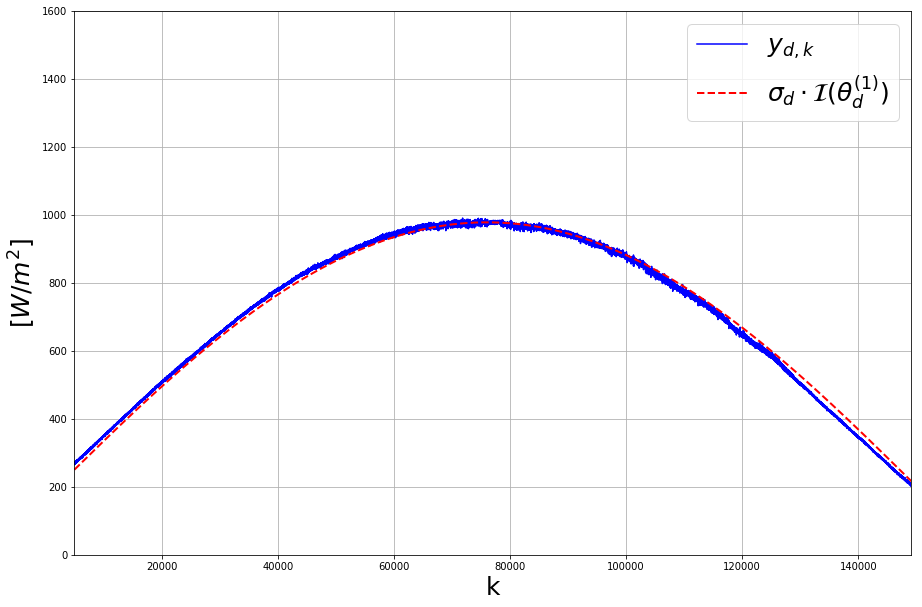

13179.614390934577 13330.947462636641
(155305, 1) (155305, 1) (155305, 1)
2018-05-23 07:02:08.002168
Th. Coeff.:  1102.7083540407093 0.1976055266591531 0.12197774475331782  RMSE:  350.1654446701783
Em. Coeff.:  1800.7793581123303 0.14960352559371418 0.0  RMSE:  49.65857649342808
Am. Coeff.:  1.5240059488893725


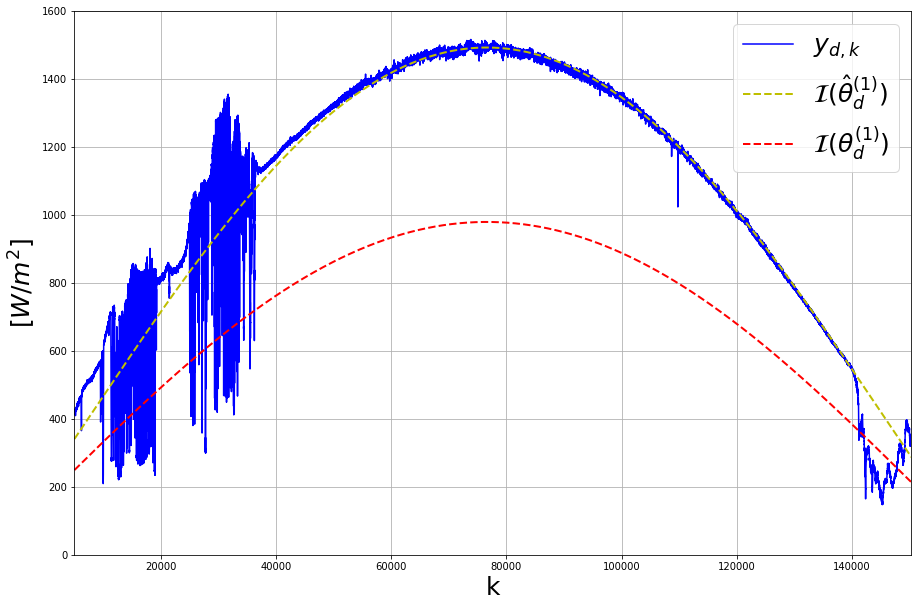

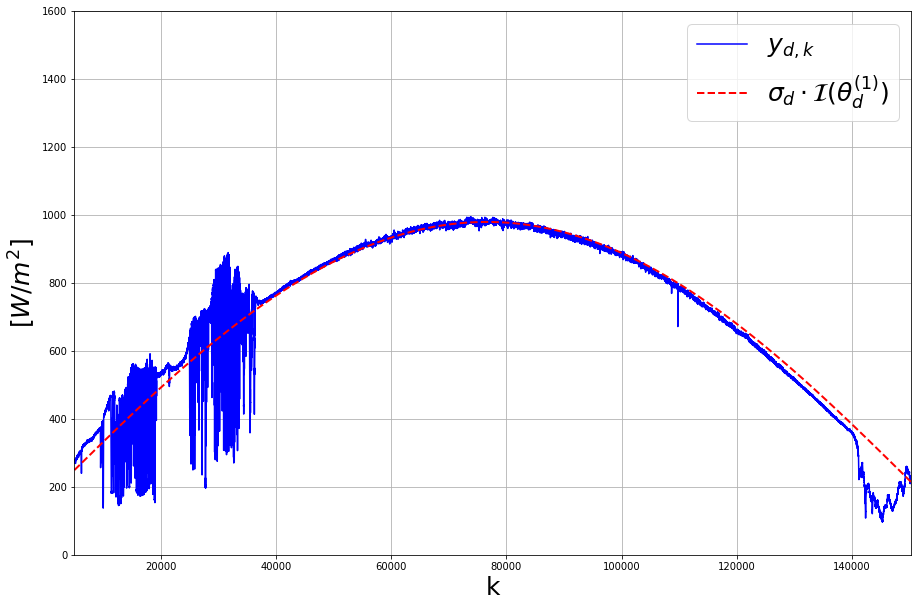

13752.567992093529 13888.951837723156
(155573, 1) (155573, 1) (155573, 1)
2018-05-24 07:01:35.009609
Th. Coeff.:  1101.883696897472 0.19804684685282833 0.12248211068894668  RMSE:  352.2706848747532
Em. Coeff.:  1787.3422236518709 0.26854838858984137 0.1475518480663289  RMSE:  13.87805827311873
Am. Coeff.:  1.542860245984075


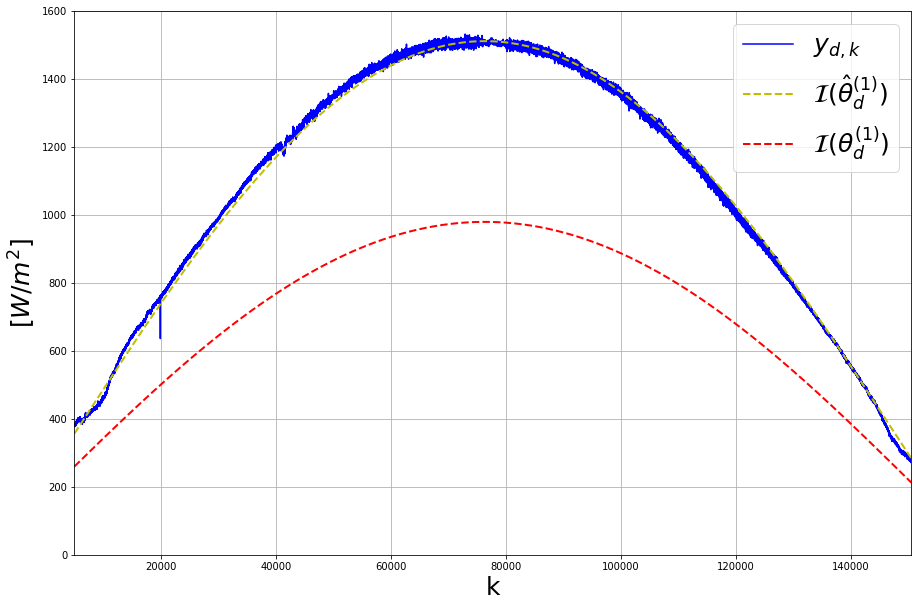

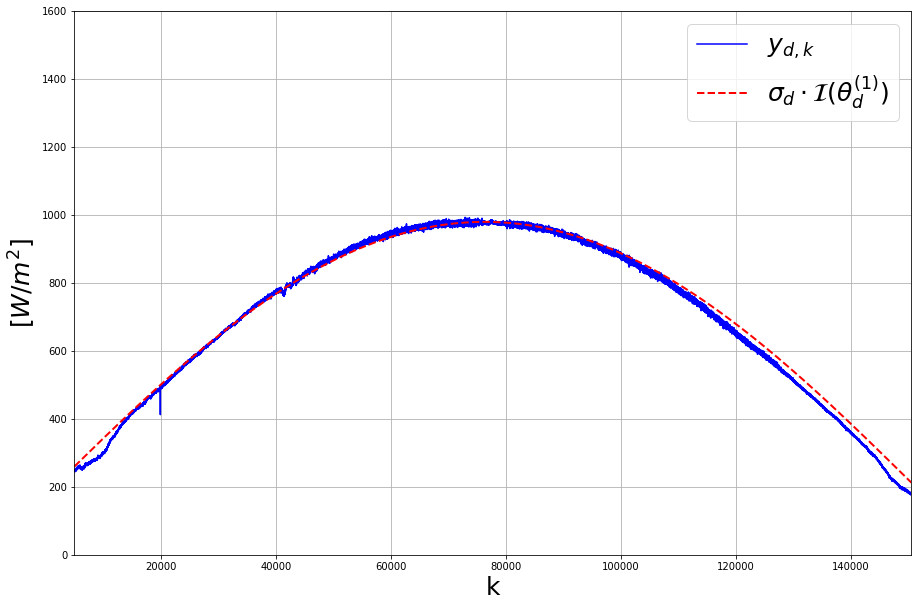

14343.959958474868 14464.860400463593
(158604, 1) (158604, 1) (158604, 1)
2018-06-07 06:56:36.004480
Th. Coeff.:  1092.2483148256488 0.20342164419720674 0.12862473622537912  RMSE:  339.97273051073665
Em. Coeff.:  1313.7094189835605 0.5437883742236785 1.0  RMSE:  60.09110514149338
Am. Coeff.:  1.5180313742275315


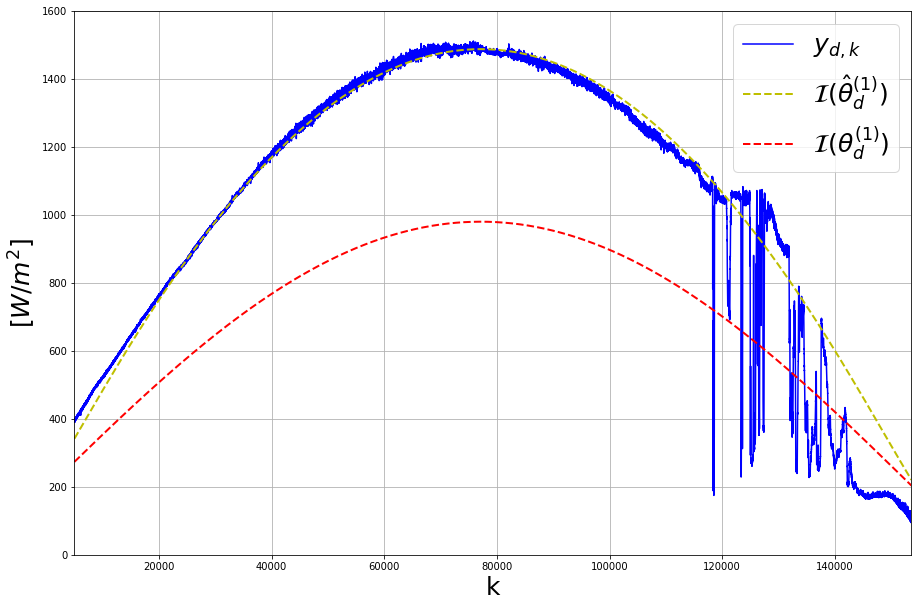

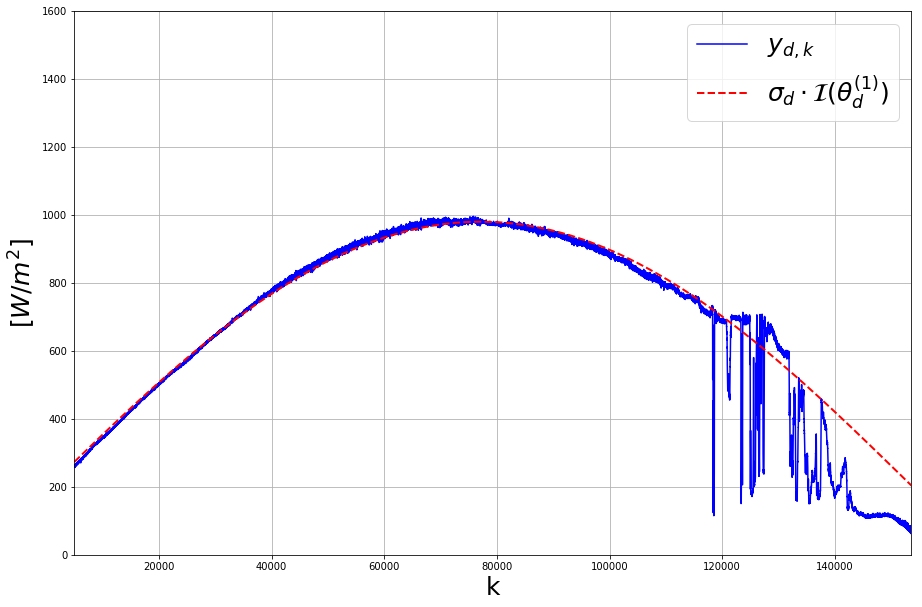

14883.419437175022 14986.967357925358
(158753, 1) (158753, 1) (158753, 1)
2018-06-08 06:56:27.004827
Th. Coeff.:  1091.7046527429338 0.20374359820346347 0.12899268366110112  RMSE:  334.20152081781424
Em. Coeff.:  1299.3038350126387 0.5427373125853574 1.0  RMSE:  34.11646504828321
Am. Coeff.:  1.5037220145138477


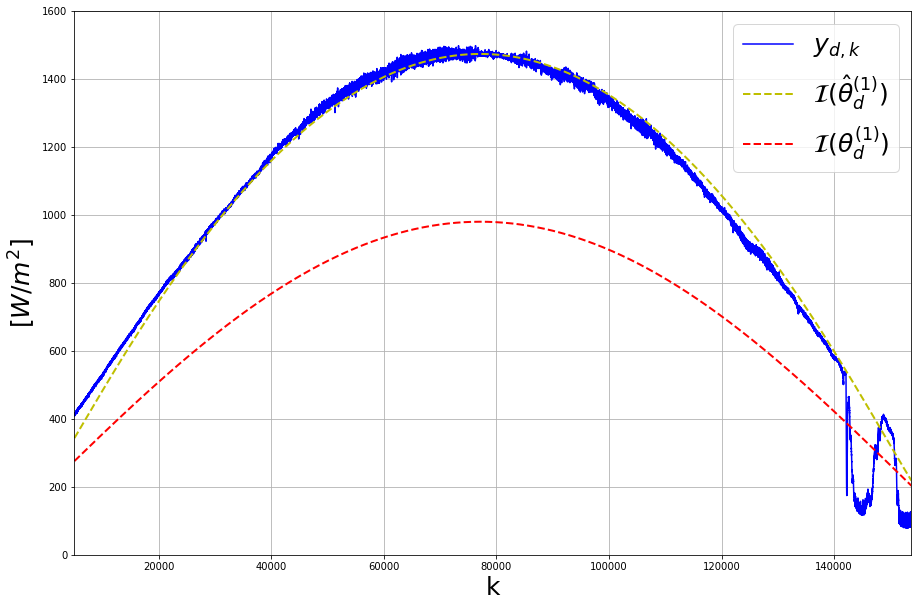

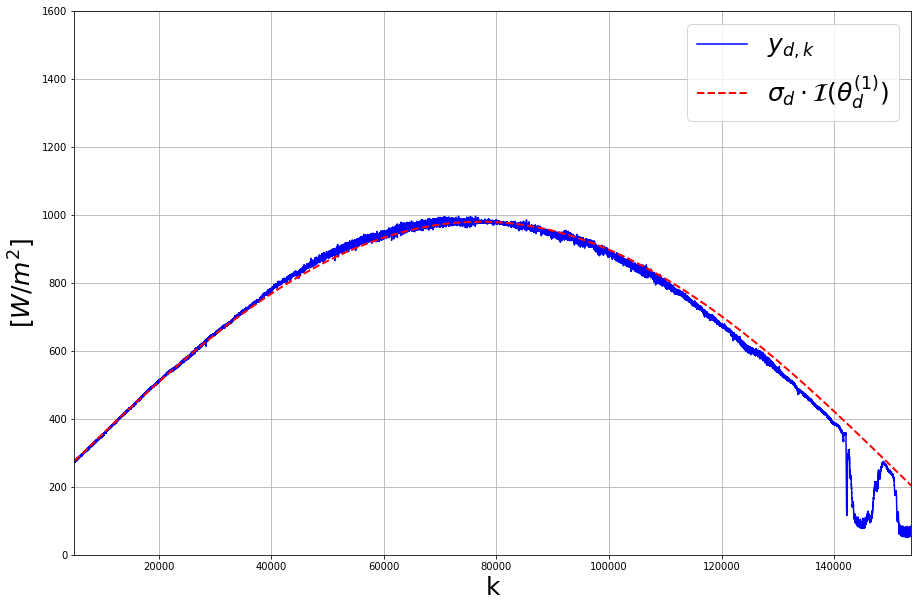

15433.507734977682 15518.635259171371
(159036, 1) (159036, 1) (159036, 1)
2018-06-11 06:56:09.004769
Th. Coeff.:  1090.1957051721515 0.2046562096800485 0.13003566820576973  RMSE:  365.56332884048476
Em. Coeff.:  1728.5007989671094 0.11167590024875375 0.0  RMSE:  27.709280290836887
Am. Coeff.:  1.5390062490349767


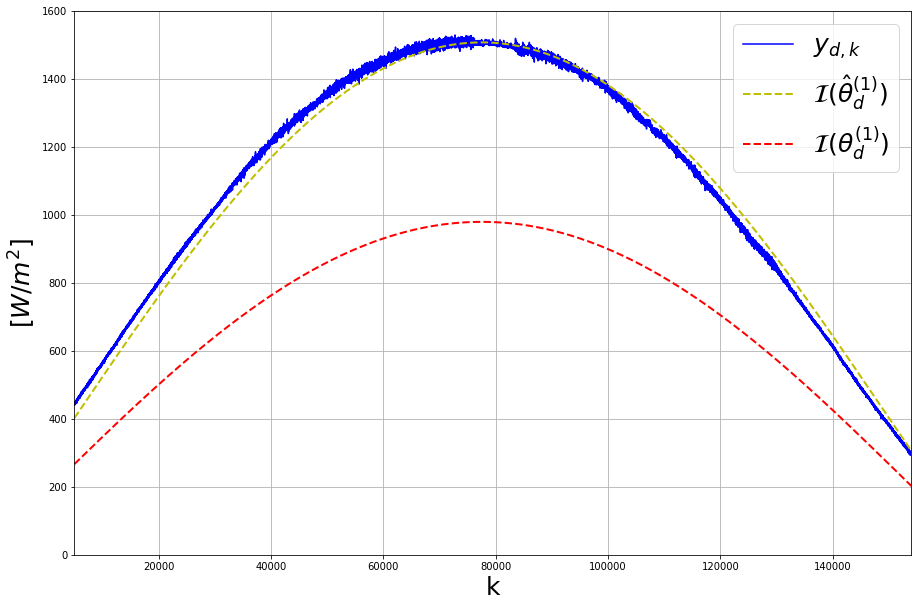

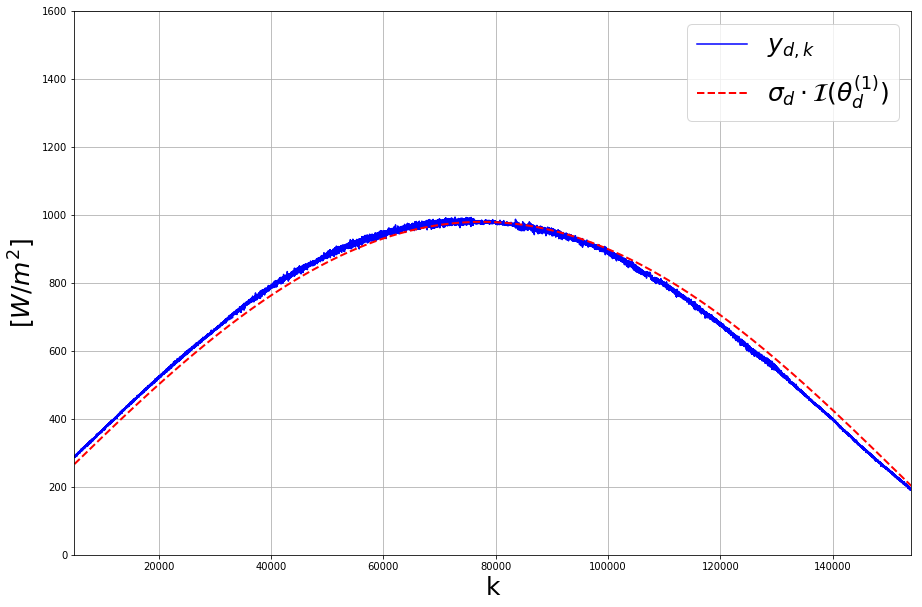

16036.940864434553 16118.548030182523
(159135, 1) (159135, 1) (159135, 1)
2018-06-12 06:56:07.004803
Th. Coeff.:  1089.7338990278427 0.20494236284801773 0.13036270039773454  RMSE:  366.02133255656696
Em. Coeff.:  1689.240425565746 0.09418754028398252 0.0  RMSE:  22.70956116858397
Am. Coeff.:  1.5318309791852847


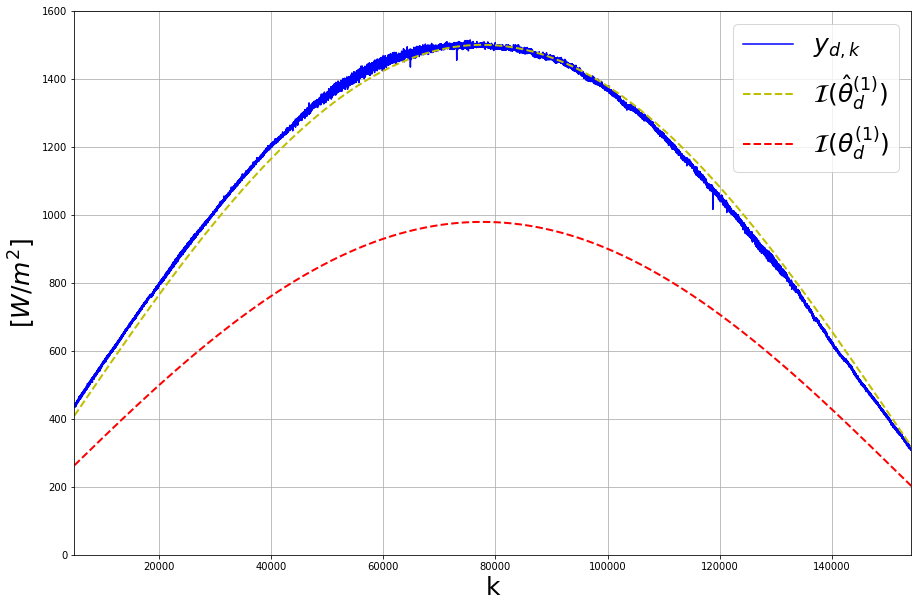

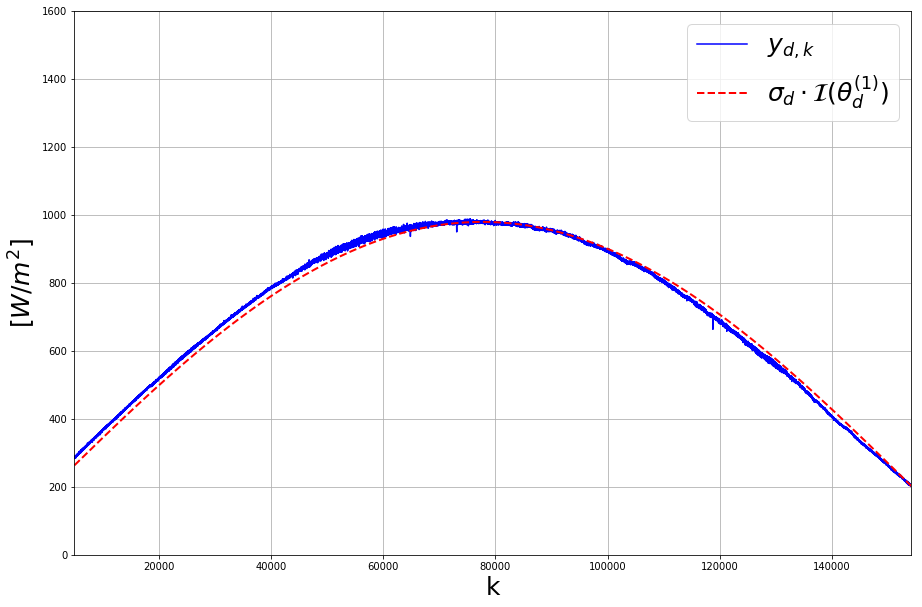

16638.467153161357 16721.65560914003
(159653, 1) (159653, 1) (159653, 1)
2018-06-22 06:57:05.001664
Th. Coeff.:  1086.2805086015014 0.20728697807033036 0.13304226065180613  RMSE:  332.01227054168163
Em. Coeff.:  1587.2697679685496 0.34999686640709315 0.35143521251048915  RMSE:  20.045110411760938
Am. Coeff.:  1.511032738424866


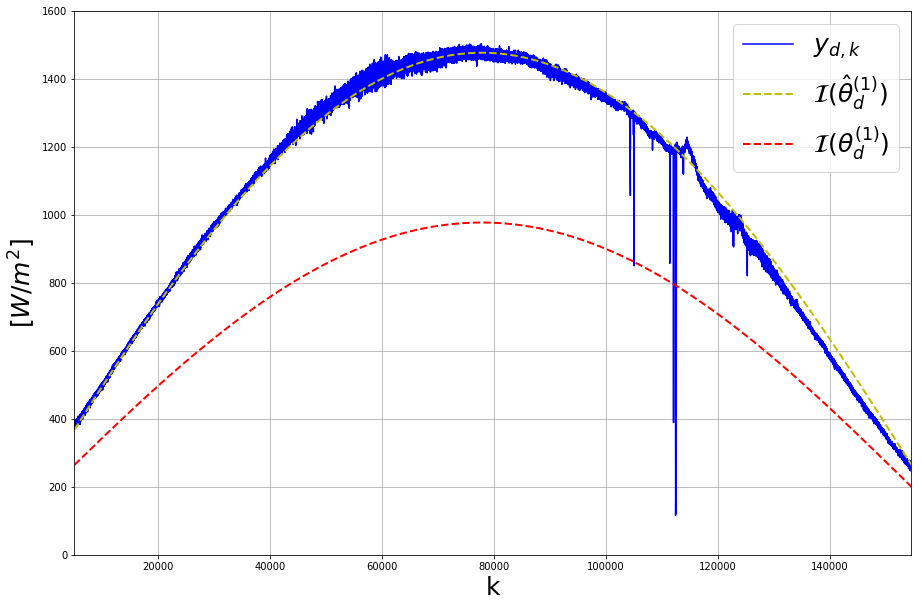

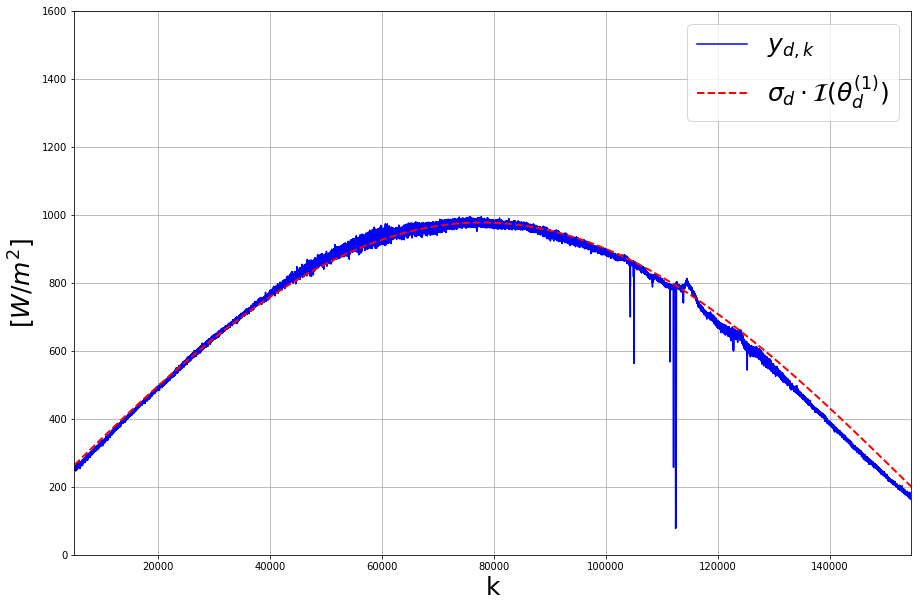

17198.511042083006 17272.334887590616
(159582, 1) (159582, 1) (159582, 1)
2018-06-24 06:57:35.001513
Th. Coeff.:  1085.8491807325745 0.2076395424355305 0.13344519135489202  RMSE:  353.8338556498368
Em. Coeff.:  1510.7349949006784 0.34832815001860634 0.4133276334389081  RMSE:  86.33371449370654
Am. Coeff.:  1.5082210604323467


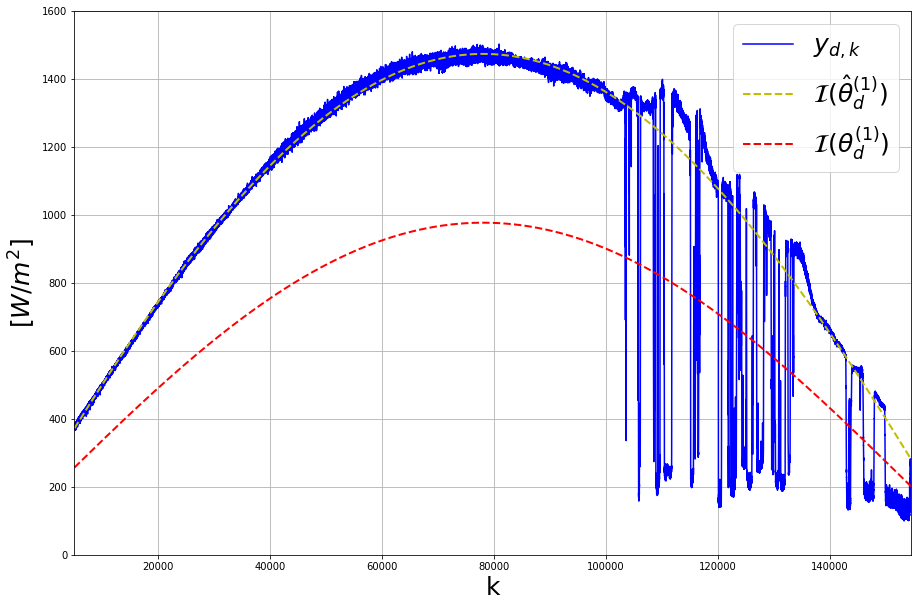

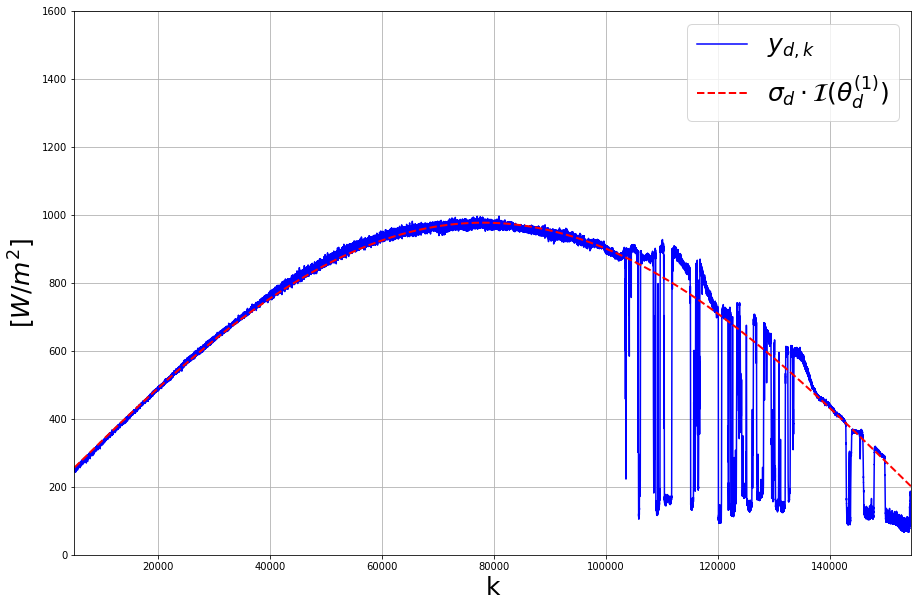

17739.171053757756 17810.930191348605
(159547, 1) (159547, 1) (159547, 1)
2018-06-25 06:57:52.010126
Th. Coeff.:  1085.666445200491 0.2078008978179199 0.1336295975061942  RMSE:  318.92180702852556
Em. Coeff.:  1553.6166957311377 0.3499647052244144 0.3682056475122931  RMSE:  26.91724108377674
Am. Coeff.:  1.4985261029106127


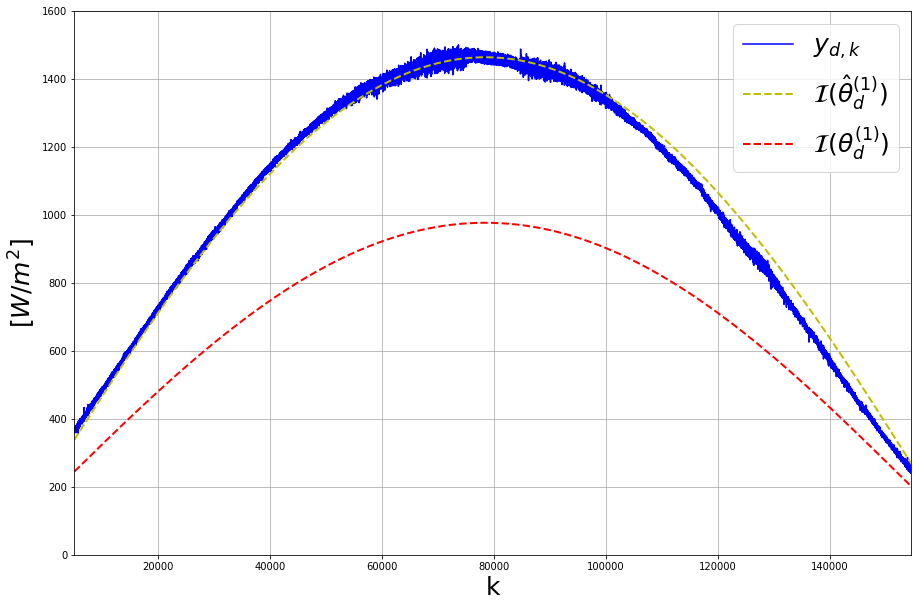

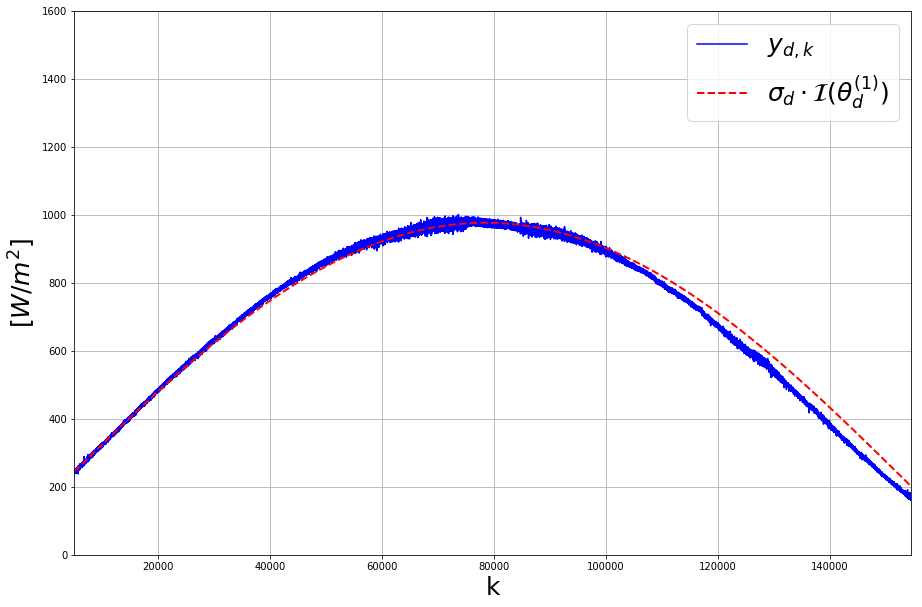

18281.801756266537 18345.624373707815
(159240, 1) (159240, 1) (159240, 1)
2018-07-01 07:00:00.005018
Th. Coeff.:  1085.0340289484482 0.20855723048378952 0.13449397769575946  RMSE:  317.18009252369063
Em. Coeff.:  1460.2656299275784 0.3522464554656645 0.44829477207578333  RMSE:  31.712575040158384
Am. Coeff.:  1.4896552427032095


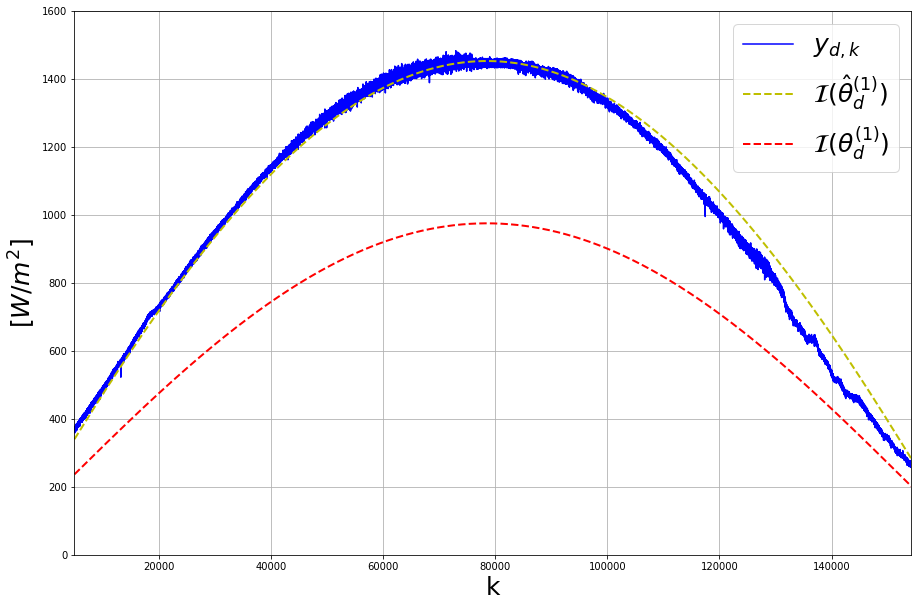

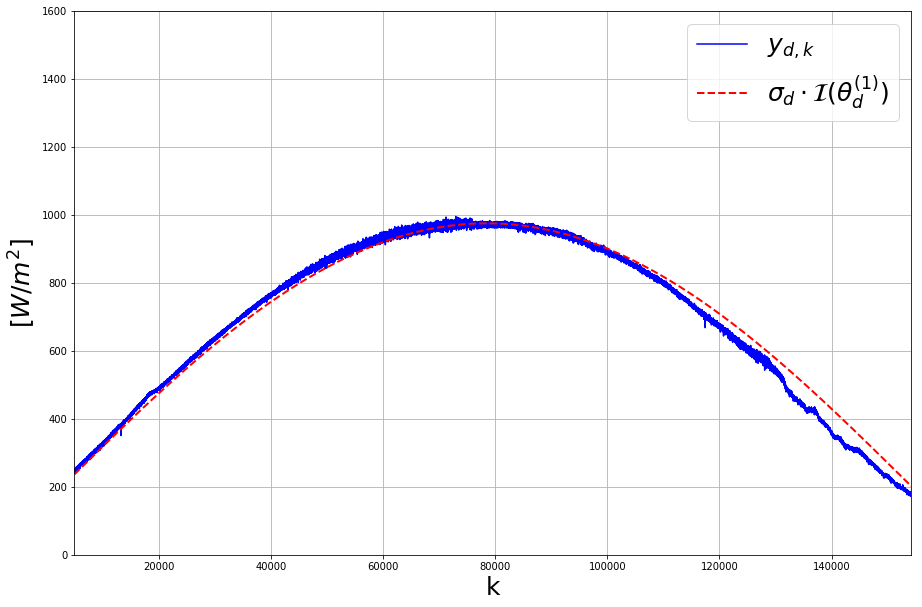

18818.894745854745 18882.2351987017
(156101, 1) (156101, 1) (156101, 1)
2018-07-18 07:09:31.004012
Th. Coeff.:  1087.5695046758858 0.20868899223977092 0.1346445625597382  RMSE:  293.3022411141377
Em. Coeff.:  1196.3999160108003 0.5031409579199013 1.0  RMSE:  69.37898320105603
Am. Coeff.:  1.448181266597379


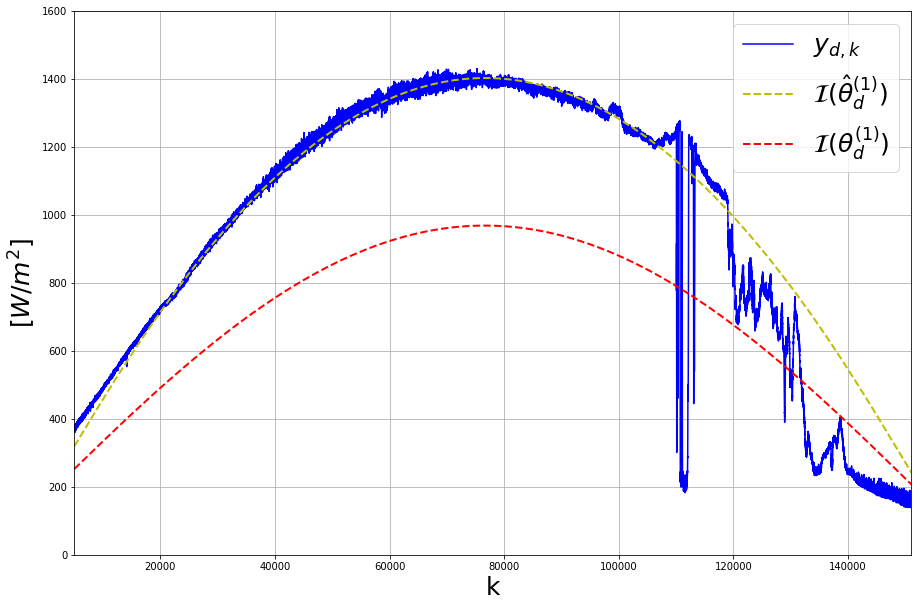

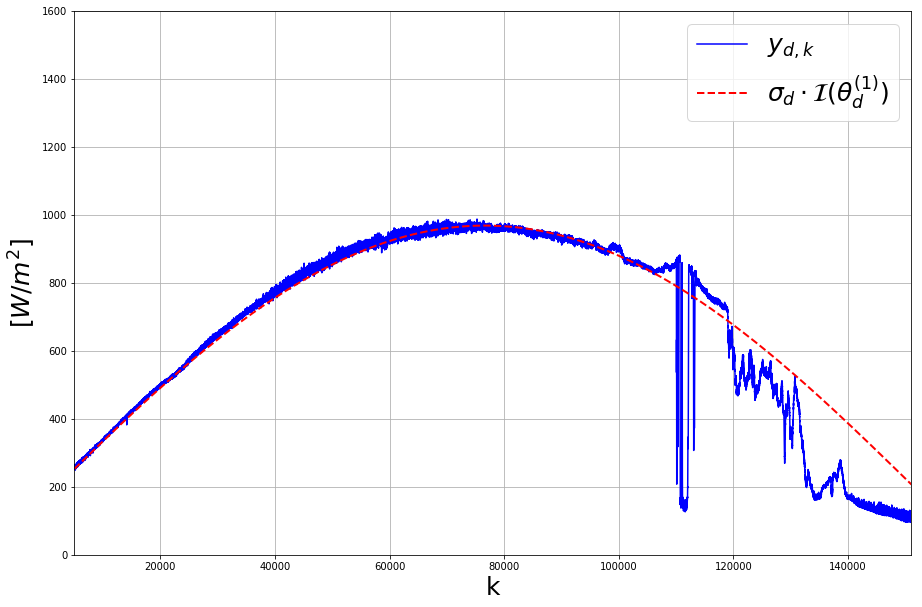

19287.388996026413 19342.521306442308
(155387, 1) (155387, 1) (155387, 1)
2018-07-21 07:11:35.008500
Th. Coeff.:  1088.6707612778634 0.20840242931929936 0.1343170620791993  RMSE:  290.79736612838315
Em. Coeff.:  1773.0116374936335 0.18519772890255895 0.0  RMSE:  30.934321333474543
Am. Coeff.:  1.4648176973679945


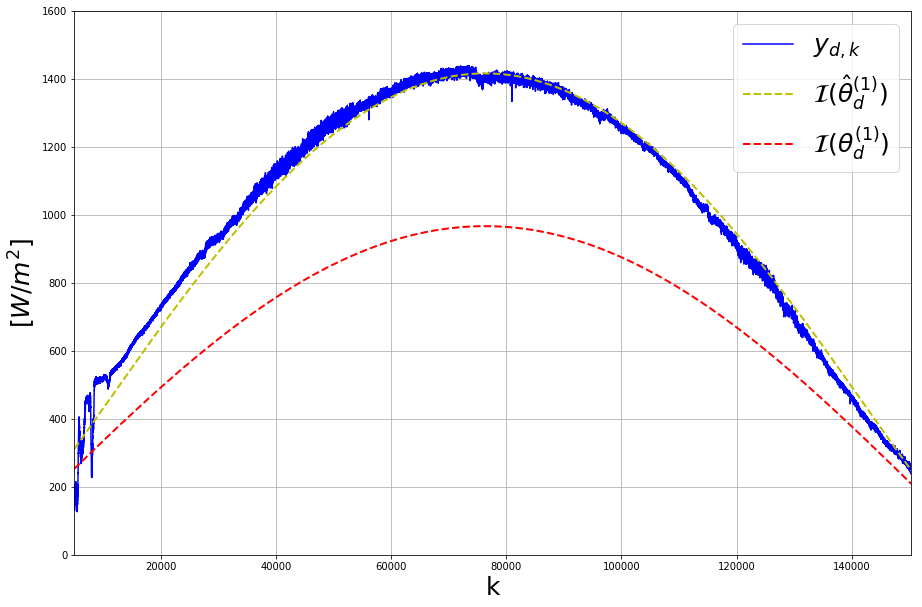

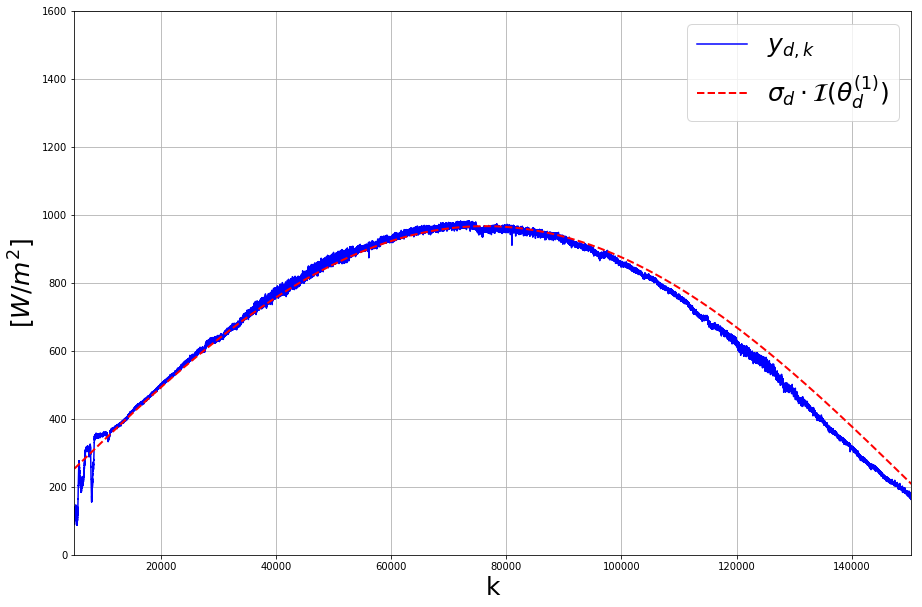

19788.74533912543 19818.908961496887
(148605, 1) (148605, 1) (148605, 1)
2018-08-09 07:25:57.110749
Th. Coeff.:  1099.8979183868992 0.20450972115482624 0.12986825274837288  RMSE:  227.85178227535573
Em. Coeff.:  1759.118048897196 0.2267068456730991 0.0  RMSE:  42.25937606562614
Am. Coeff.:  1.3731647514478431


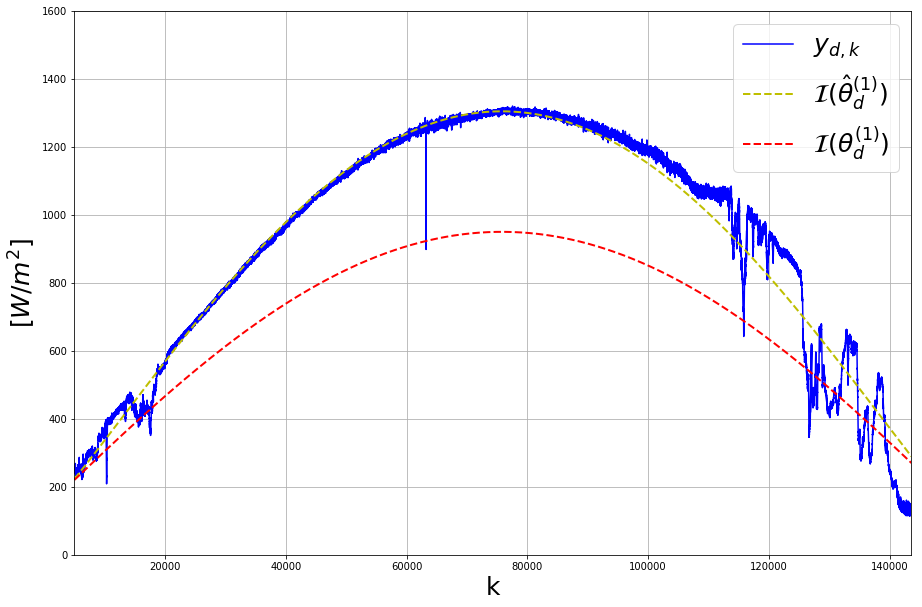

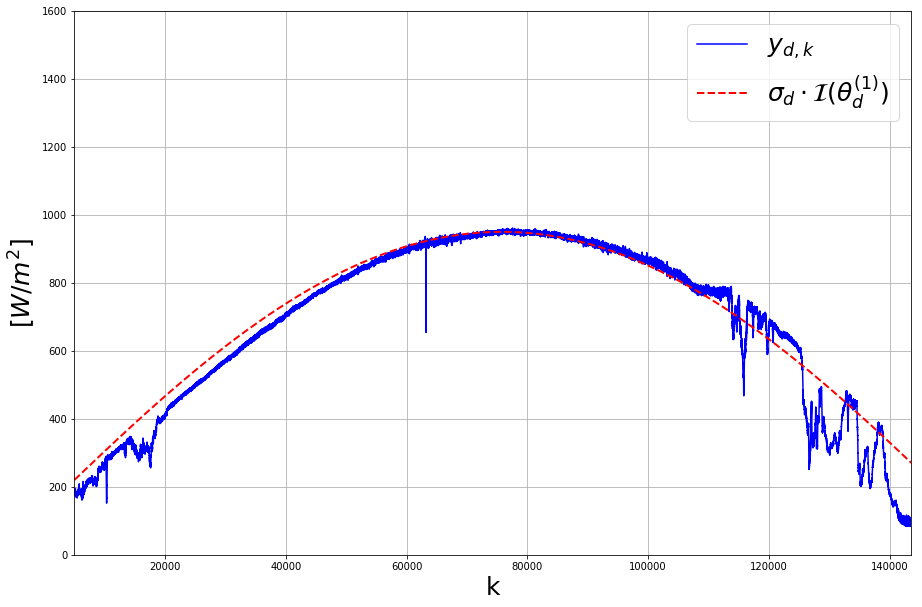

20184.0292652415 20177.779382649493
(133259, 1) (133259, 1) (133259, 1)
2018-09-12 07:52:11.024546
Th. Coeff.:  1134.6857825304414 0.18995673427279605 0.11323626774033835  RMSE:  236.79456096363543
Em. Coeff.:  1678.9826925808436 0.1297671479572217 0.0  RMSE:  19.192834827369072
Am. Coeff.:  1.4017120691735836


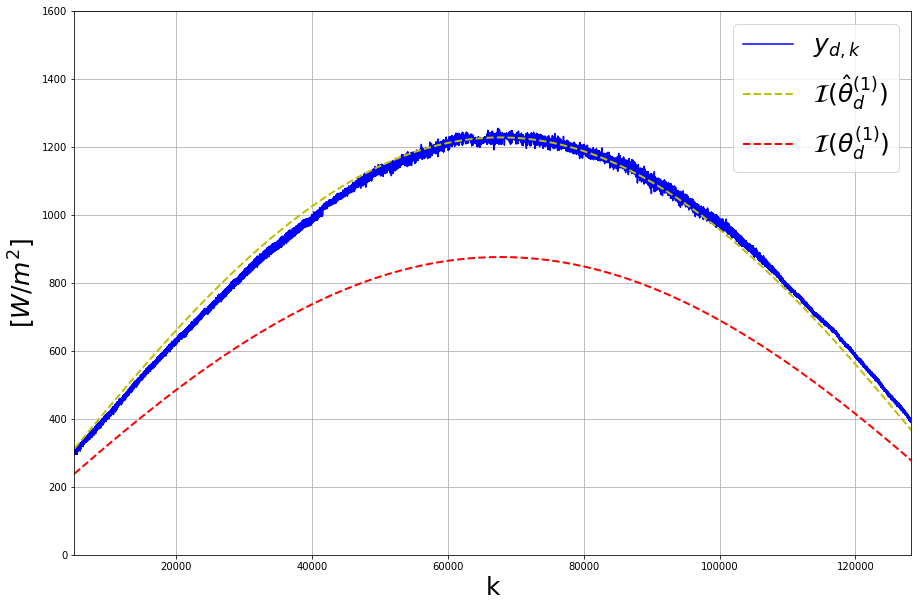

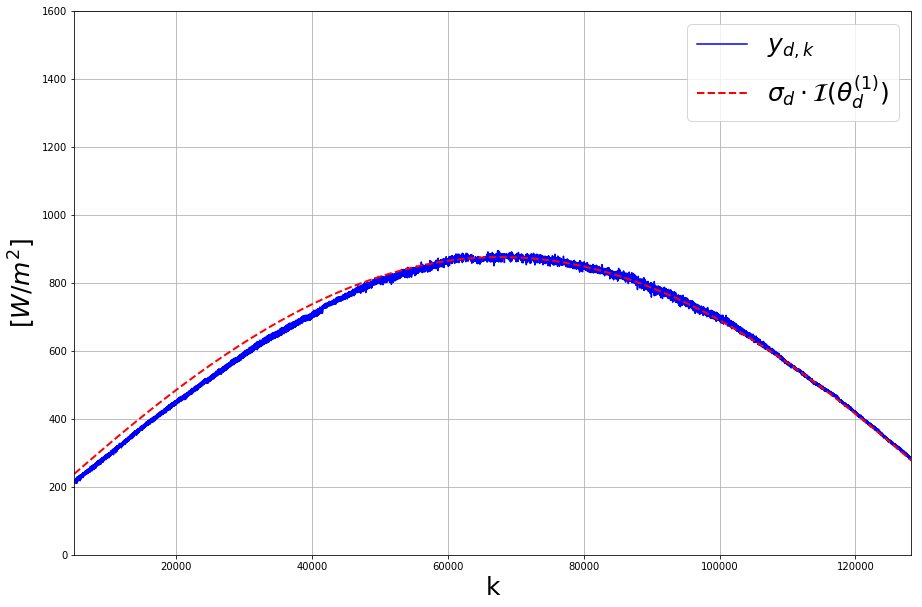

20600.12670747208 20584.69731926615
(132754, 1) (132754, 1) (132754, 1)
2018-09-13 07:52:56.098210
Th. Coeff.:  1135.9047753730727 0.1894181574522673 0.1126207513740198  RMSE:  239.96959750321622
Em. Coeff.:  1682.2410724100105 0.13404232216389872 0.0  RMSE:  29.384352756629518
Am. Coeff.:  1.395599349609615


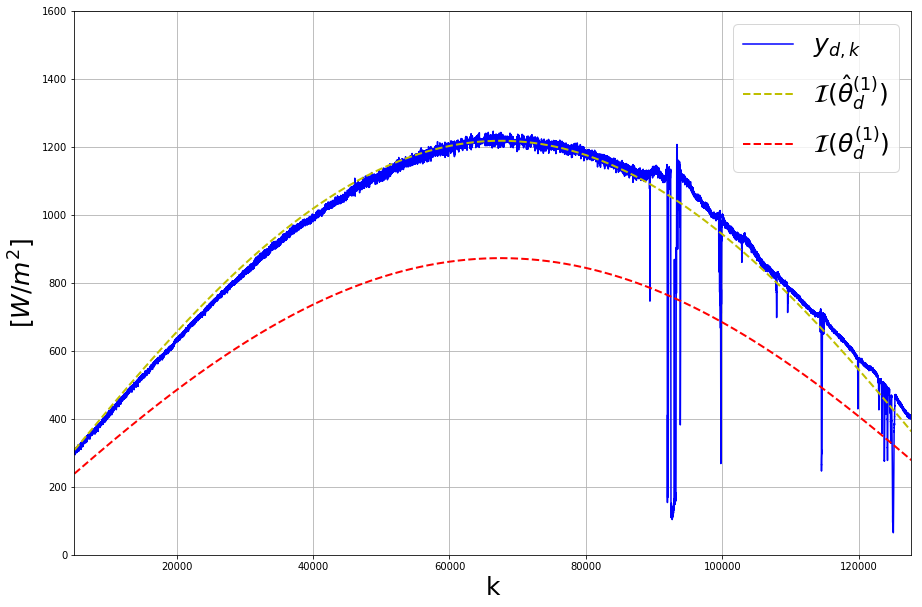

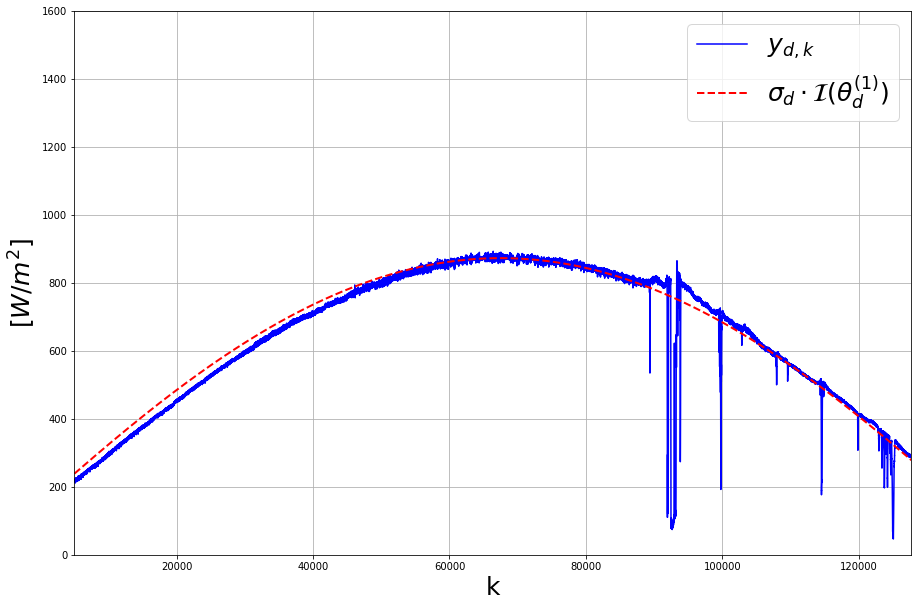

21013.046094581892 20987.433569538607
(131779, 1) (131779, 1) (131779, 1)
2018-09-15 07:54:27.092315
Th. Coeff.:  1138.3638175339543 0.18832745855854674 0.11137423835262486  RMSE:  218.15707990658095
Em. Coeff.:  1667.3195823436401 0.13769841310904352 1.6038182879379332e-05  RMSE:  16.141978138234606
Am. Coeff.:  1.3736510766272414


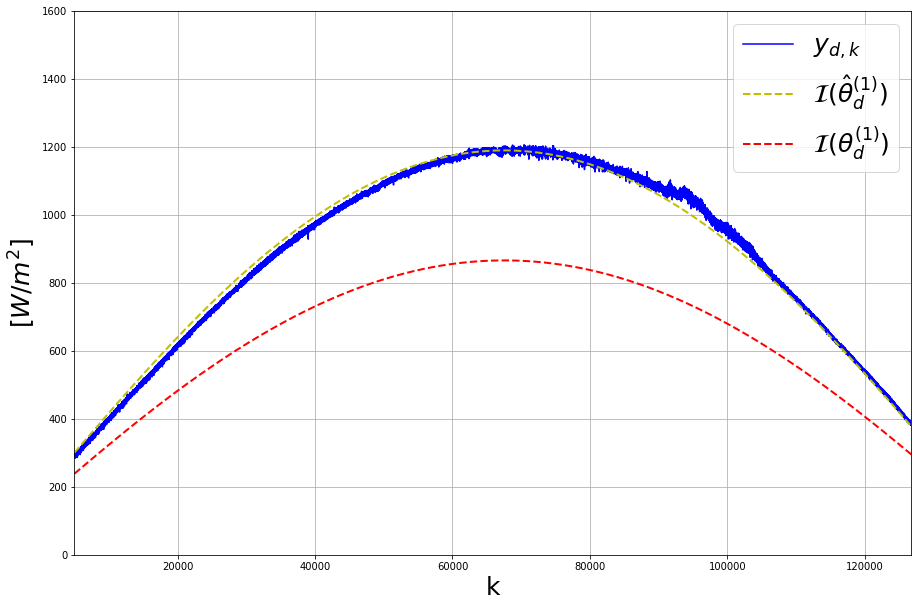

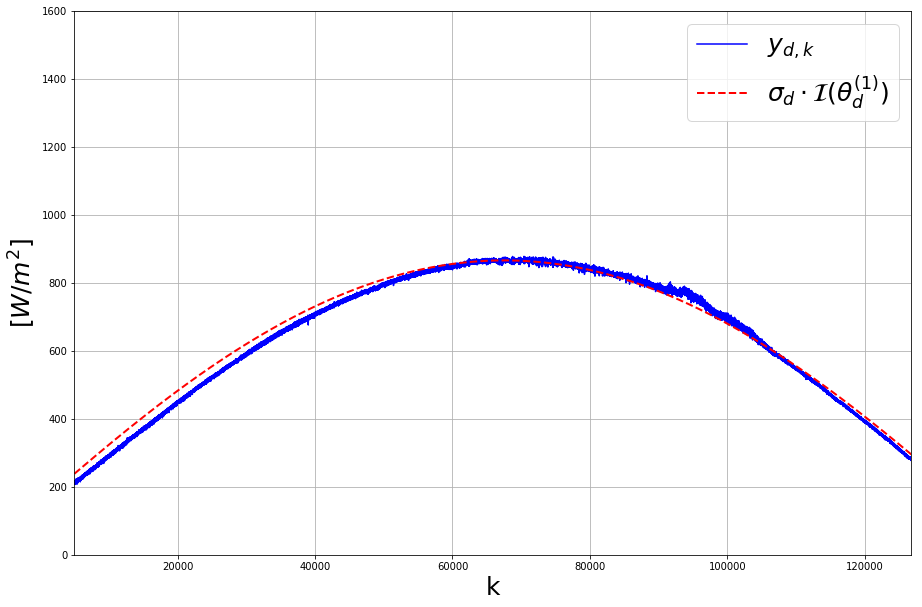

21400.70109642447 21363.71683140541
(130328, 1) (130328, 1) (130328, 1)
2018-09-18 07:56:45.123858
Th. Coeff.:  1142.0995425495537 0.18665998057554187 0.10946854922919072  RMSE:  200.64629691091713
Em. Coeff.:  1720.4541578798608 0.16885947352963893 0.0  RMSE:  10.488472407848574
Am. Coeff.:  1.3596105752992267


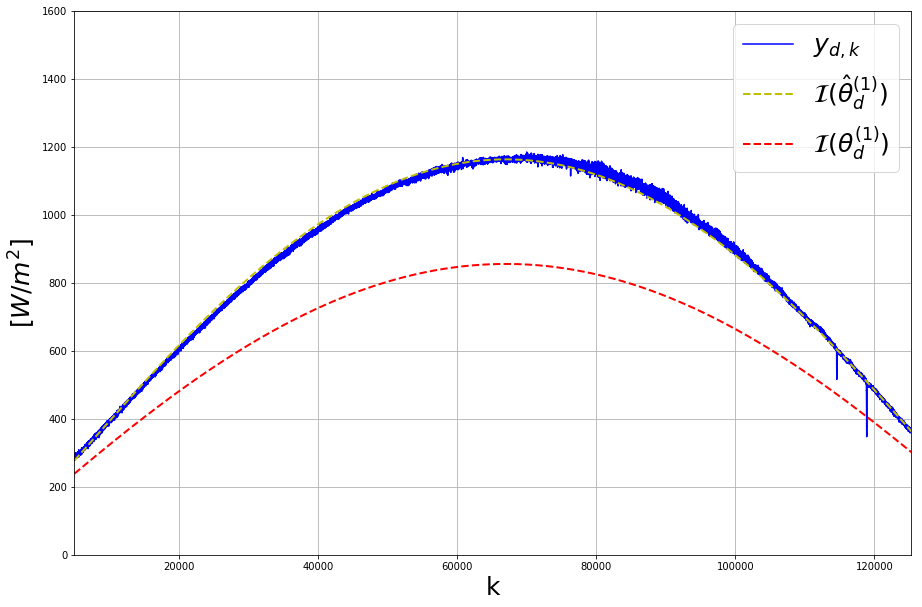

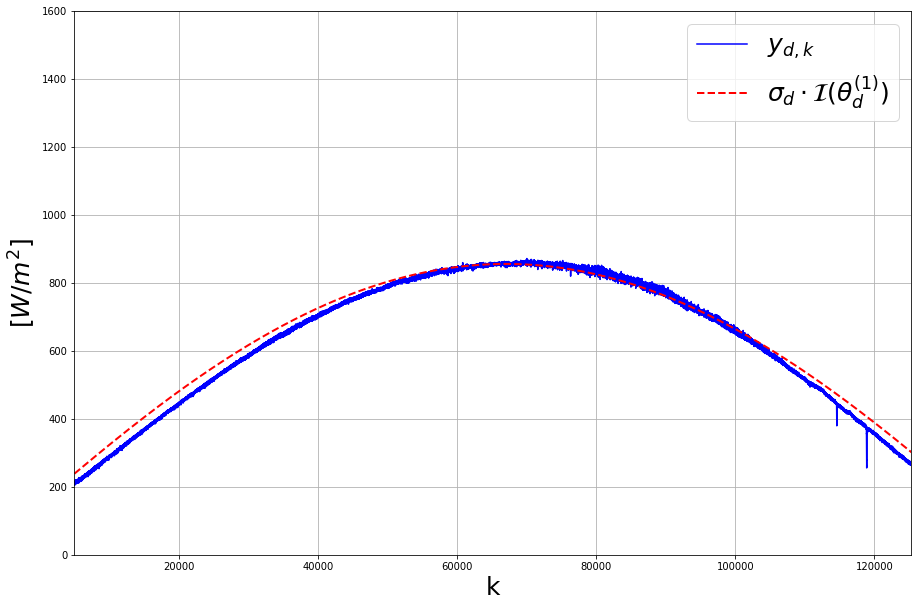

21764.795388145834 21707.986489629217
(128329, 1) (128329, 1) (128329, 1)
2018-09-22 07:59:49.184046
Th. Coeff.:  1147.153014186389 0.18438494867457217 0.10686851277093963  RMSE:  214.15411707627922
Em. Coeff.:  1658.554313359513 0.12939905341455205 0.0  RMSE:  19.227615383053468
Am. Coeff.:  1.3672629682130268


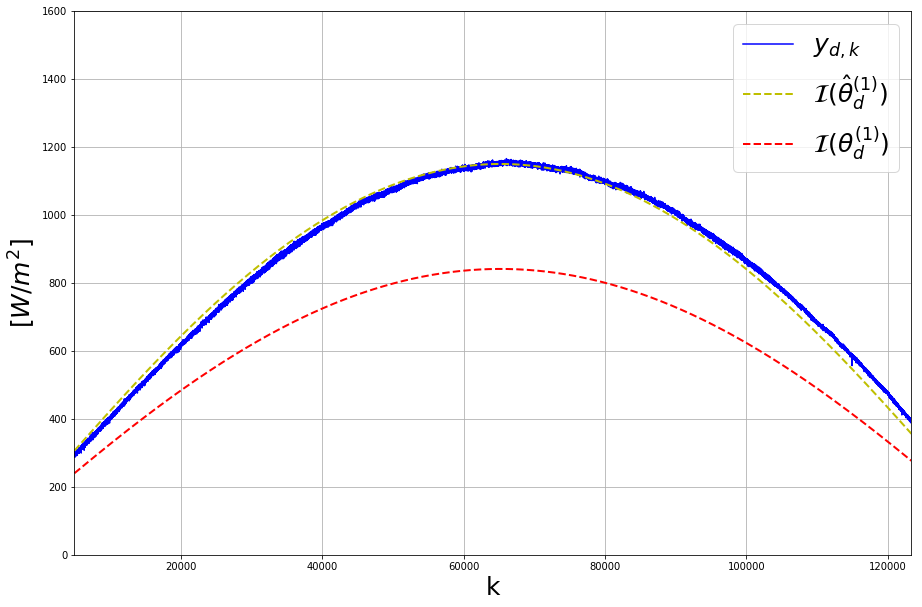

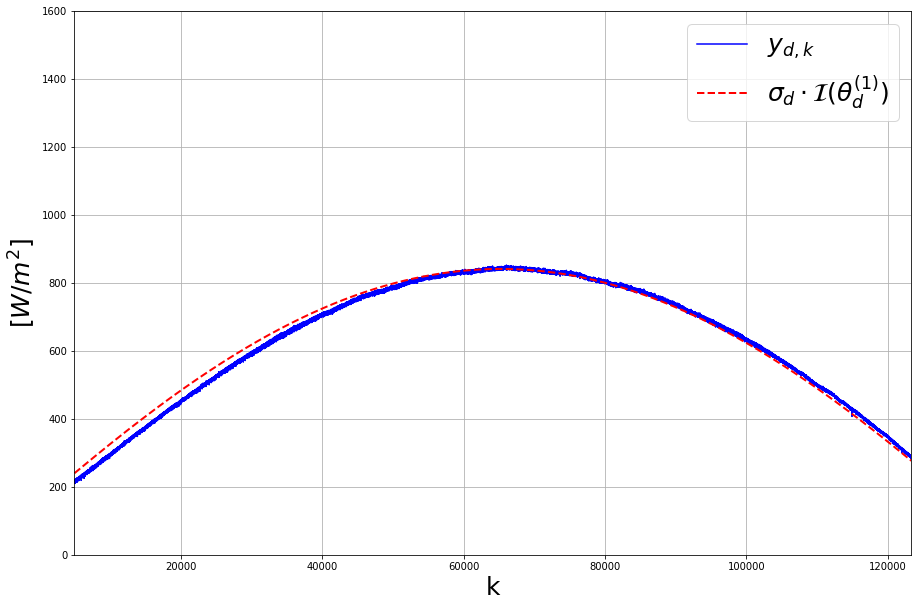

22141.26179953661 22075.188580869526
(127867, 1) (127867, 1) (127867, 1)
2018-09-23 08:00:36.230265
Th. Coeff.:  1148.4268384501788 0.18380807363197257 0.10620922700796867  RMSE:  228.62809710796915
Em. Coeff.:  1690.3009063576337 0.12772570346738568 6.029597636193452e-11  RMSE:  14.950512605856709
Am. Coeff.:  1.3944354637513268


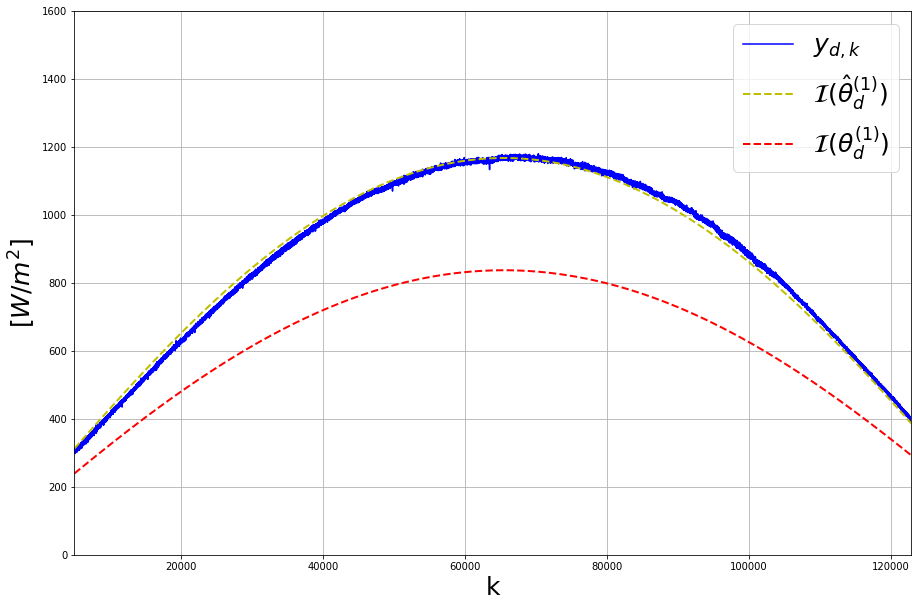

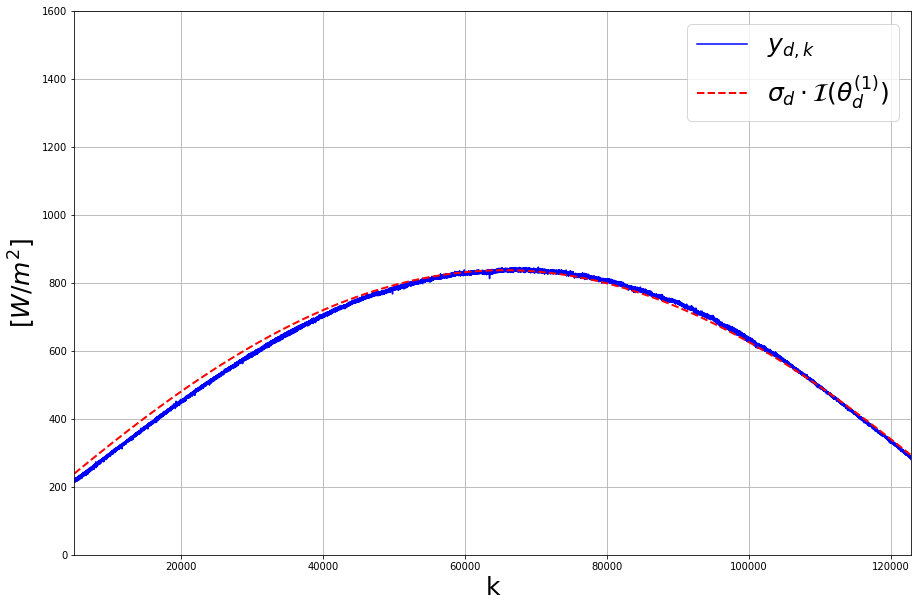

22541.017274986585 22466.457499050794
(109650, 1) (109650, 1) (109650, 1)
2018-11-02 08:35:19.020530
Th. Coeff.:  1198.1503207889077 0.16022434031702365 0.07925638893374135  RMSE:  203.32177644169403
Em. Coeff.:  1697.7618505472851 0.08565706267919651 0.0  RMSE:  5.889107756081032
Am. Coeff.:  1.4167371822375152


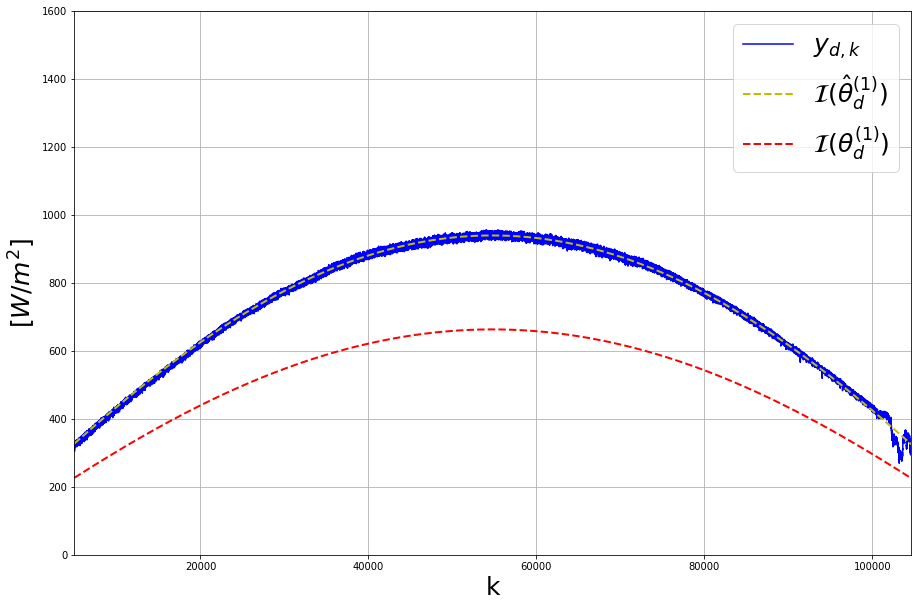

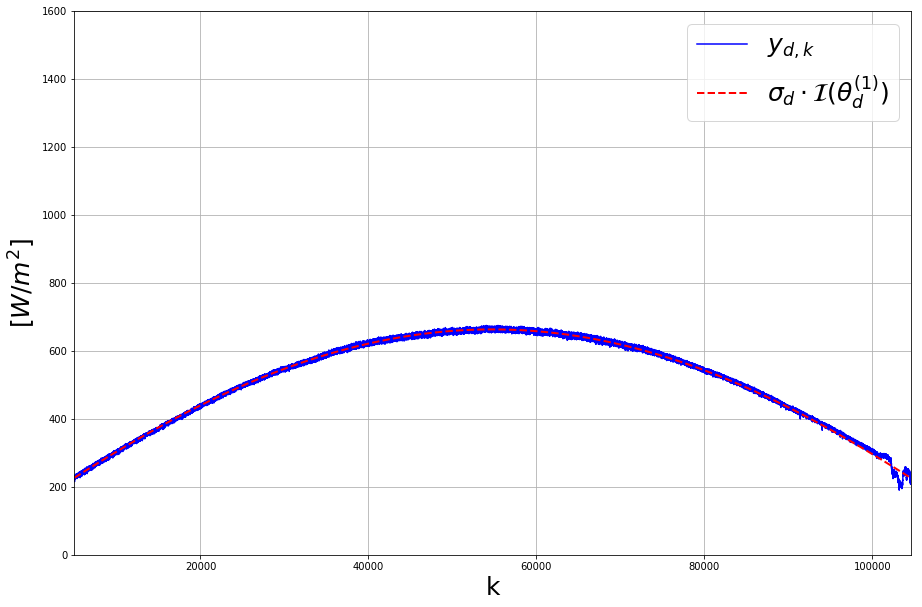

22886.158075893552 22813.582492527275
(108483, 1) (108483, 1) (108483, 1)
2018-11-05 07:38:13.027573
Th. Coeff.:  1201.4326484875714 0.15858184254773267 0.07737924862598021  RMSE:  200.67375729523866
Em. Coeff.:  1707.2745844083631 0.08460559555628436 3.4285522749566826e-07  RMSE:  7.846604855726335
Am. Coeff.:  1.4234269967108795


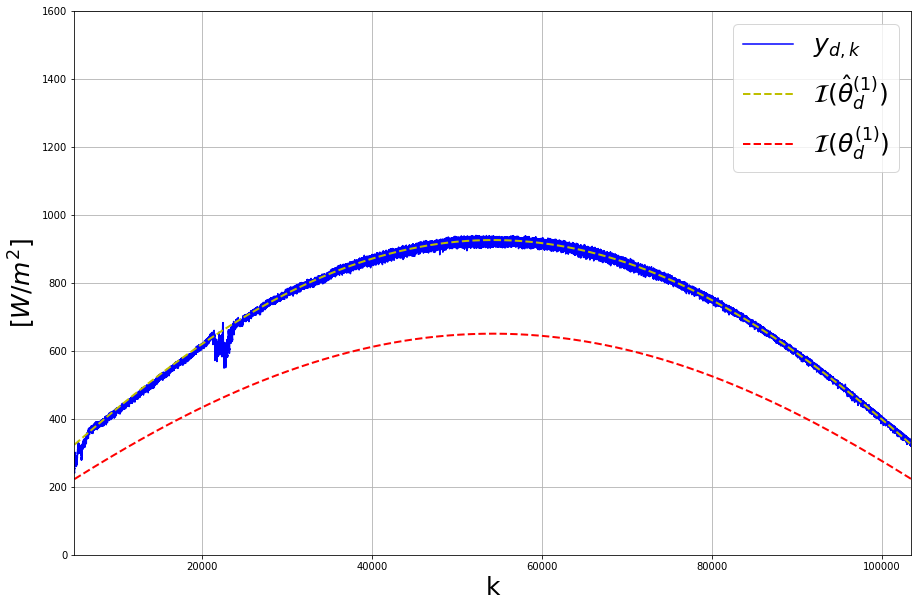

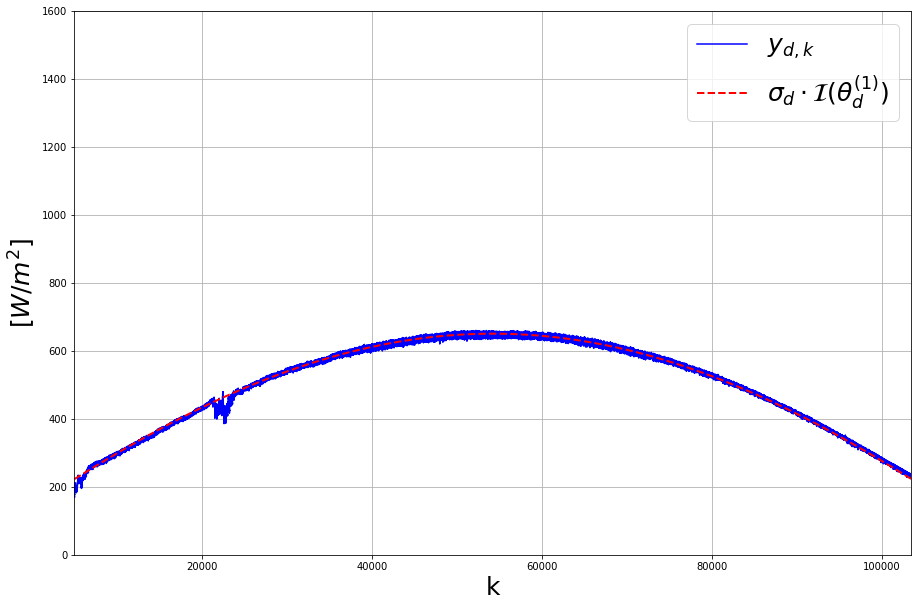

23227.512855254987 23157.122159255745
(108092, 1) (108092, 1) (108092, 1)
2018-11-06 07:39:12.022542
Th. Coeff.:  1202.5026317218337 0.15804326572720392 0.07676373225966165  RMSE:  202.11182857543108
Em. Coeff.:  1724.6443325288528 0.08929764200827592 0.0  RMSE:  4.66459743245361
Am. Coeff.:  1.4258549813157682


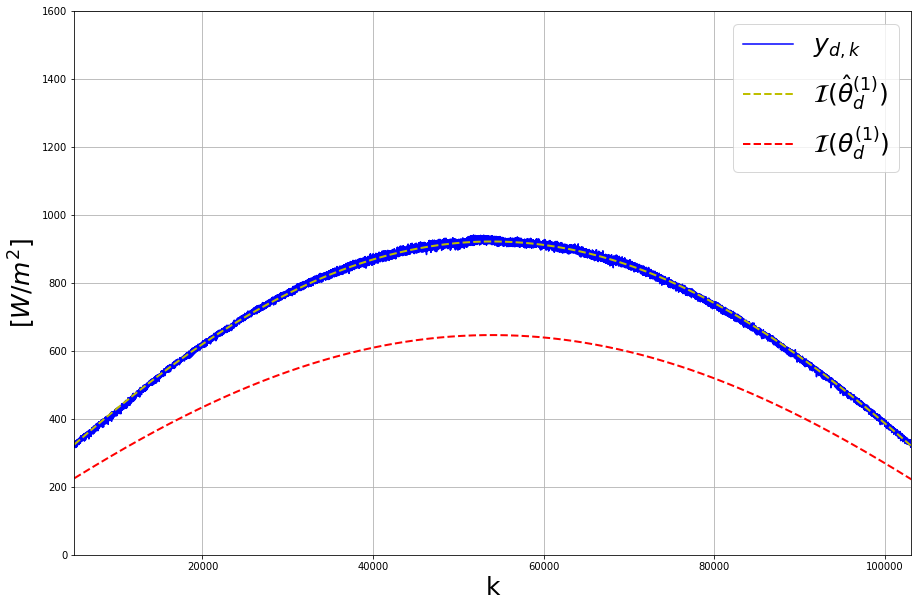

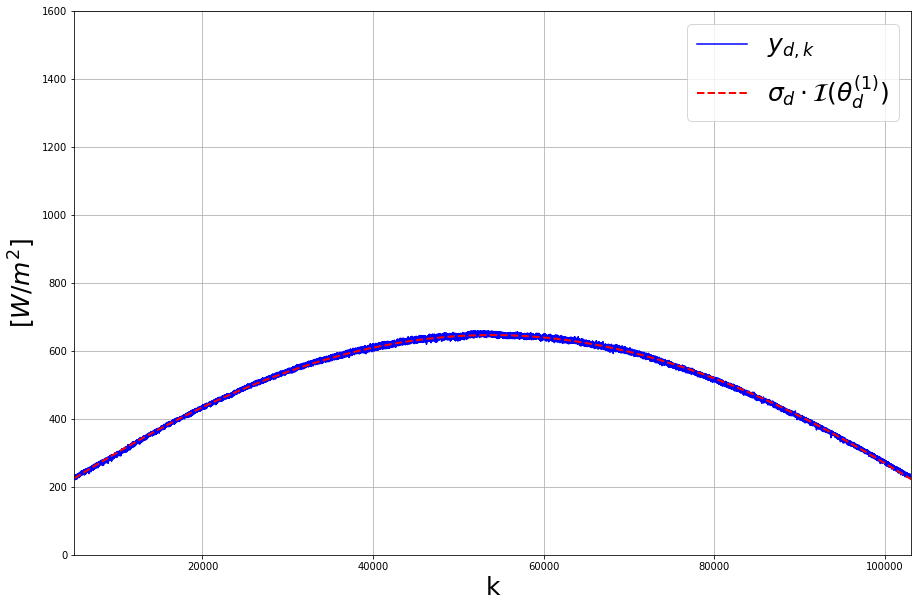

23570.340774870798 23500.95358189735
(107714, 1) (107714, 1) (107714, 1)
2018-11-07 07:40:10.028690
Th. Coeff.:  1203.560020509035 0.15750941723141476 0.07615361969304546  RMSE:  209.5881842973247
Em. Coeff.:  1791.7021419325474 0.10097734778989408 0.0  RMSE:  5.176758924890549
Am. Coeff.:  1.4521345739363432


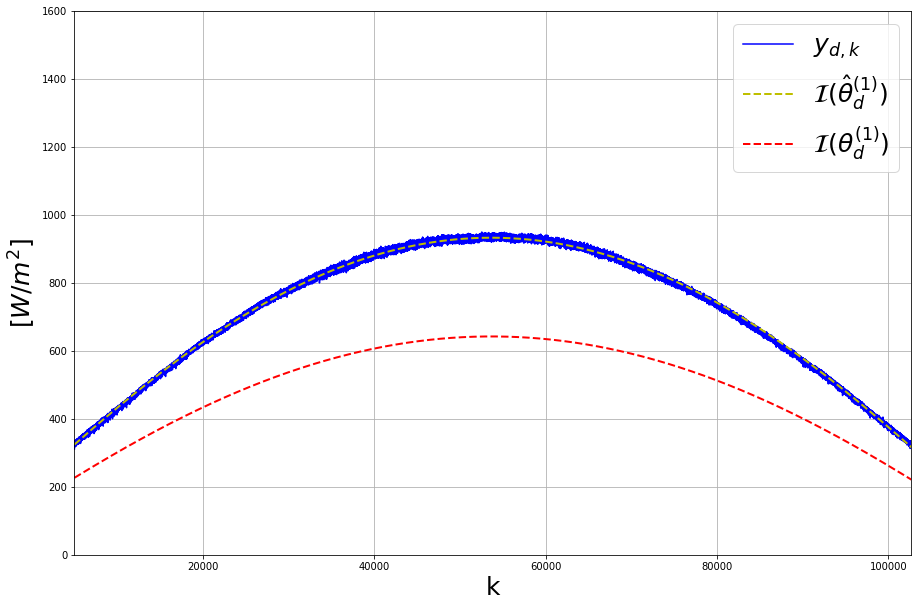

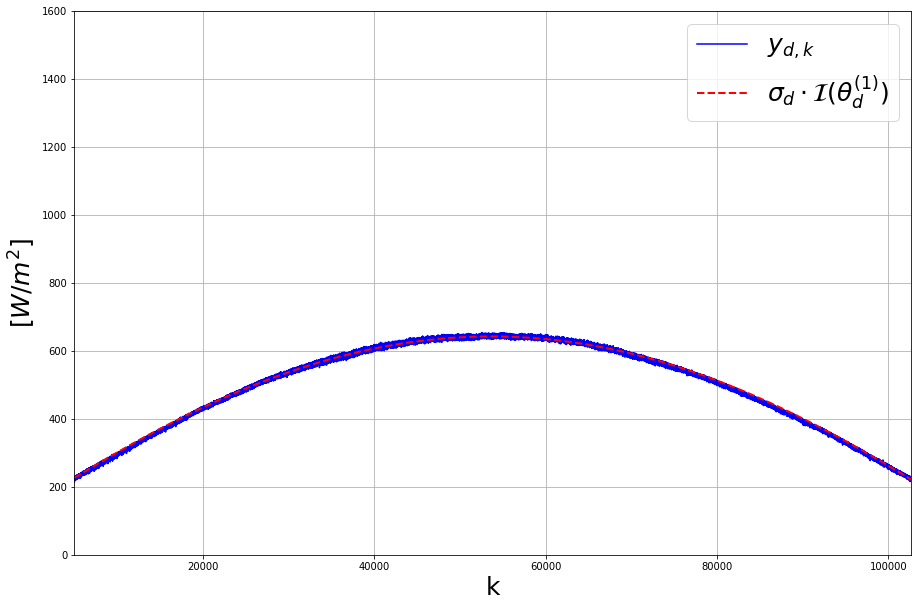

23925.890929401263 23854.716561323974
(107299, 1) (107299, 1) (107299, 1)
2018-11-08 07:41:08.025426
Th. Coeff.:  1204.6045015220573 0.15698045525119583 0.0755490917156524  RMSE:  197.34005178409532
Em. Coeff.:  1698.5102739010815 0.08330822283321555 0.0  RMSE:  6.026321791225902
Am. Coeff.:  1.4156796675295358


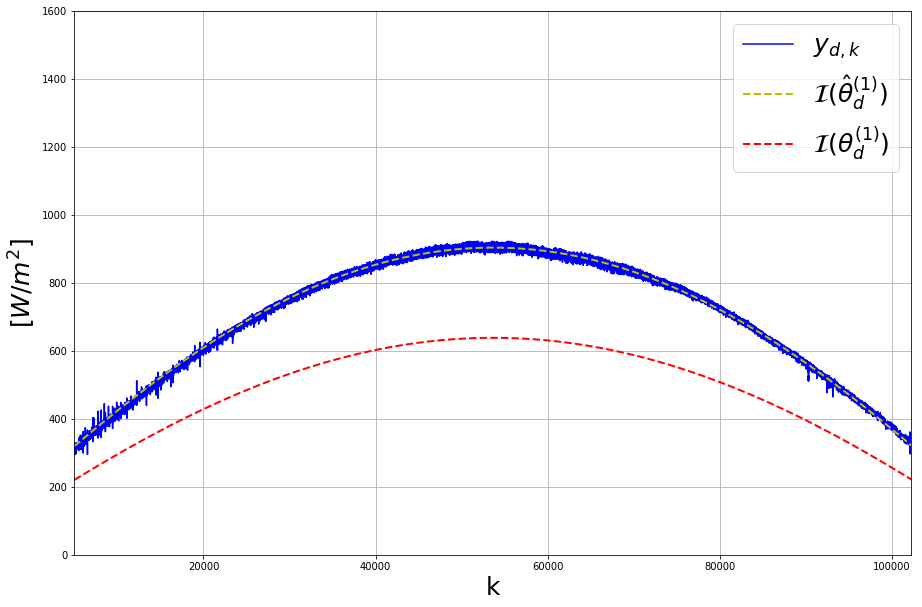

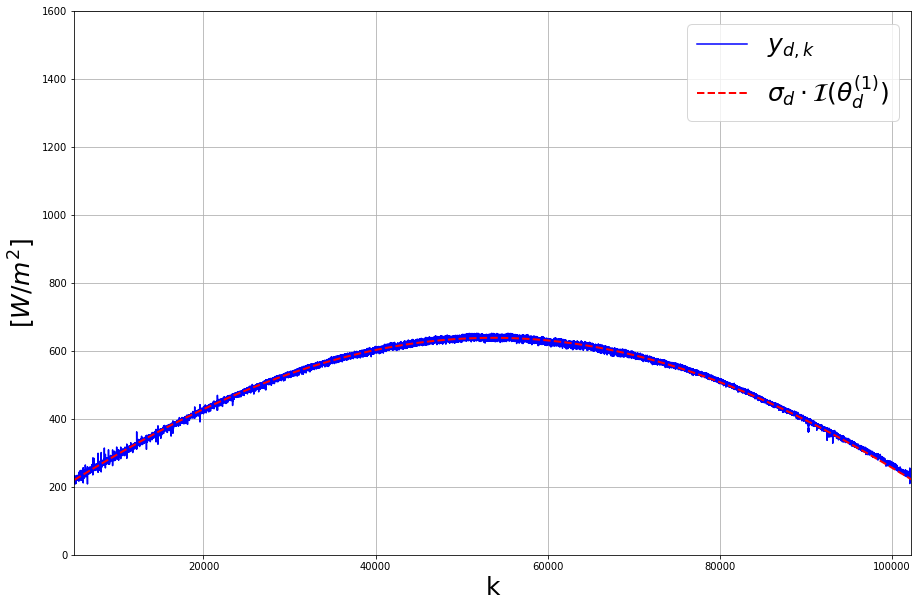

24259.81480306913 24191.08768185504
(102177, 1) (102177, 1) (102177, 1)
2018-11-24 07:56:27.028909
Th. Coeff.:  1219.3209242567582 0.14930457364624877 0.0667766555957129  RMSE:  178.2656785223873
Em. Coeff.:  1725.1681749240495 0.08699627009422237 0.0  RMSE:  4.251257557788415
Am. Coeff.:  1.4129138206266334


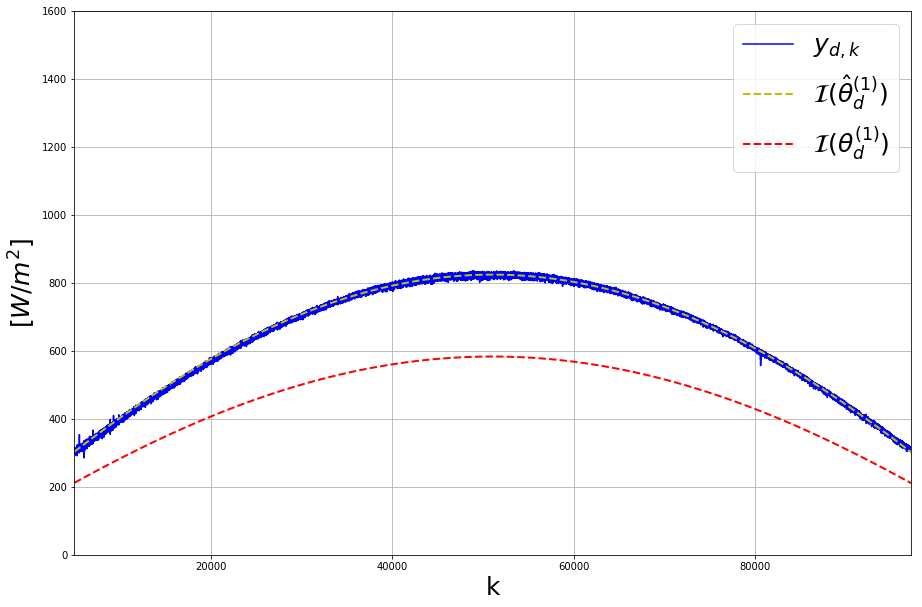

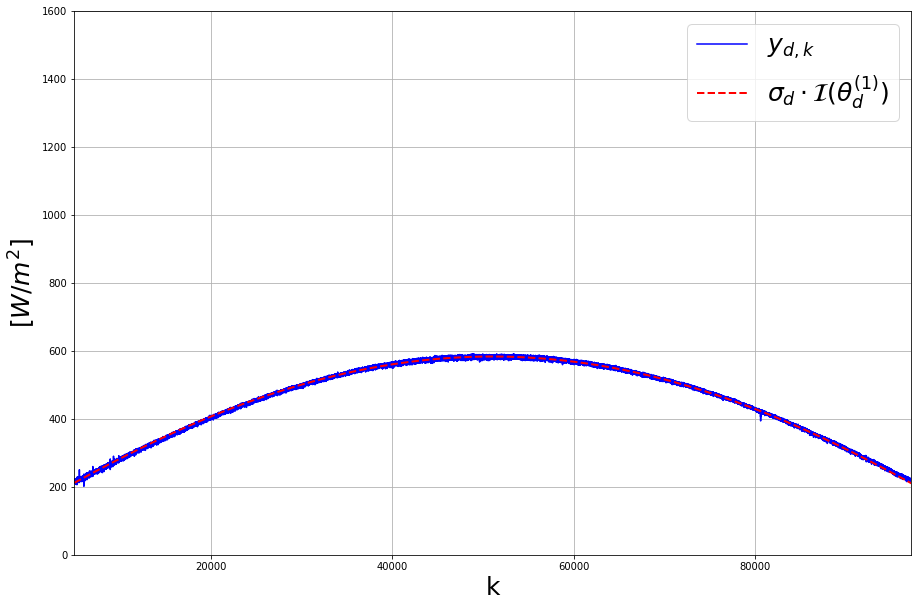

24563.051964456772 24495.626752496046
(101408, 1) (101408, 1) (101408, 1)
2018-11-27 07:59:09.055888
Th. Coeff.:  1221.6107414976811 0.14805722962029916 0.06535111956605619  RMSE:  194.41722806006092
Em. Coeff.:  1753.1707034184865 0.08040025504223337 0.0  RMSE:  4.70802798724454
Am. Coeff.:  1.4505761500693766


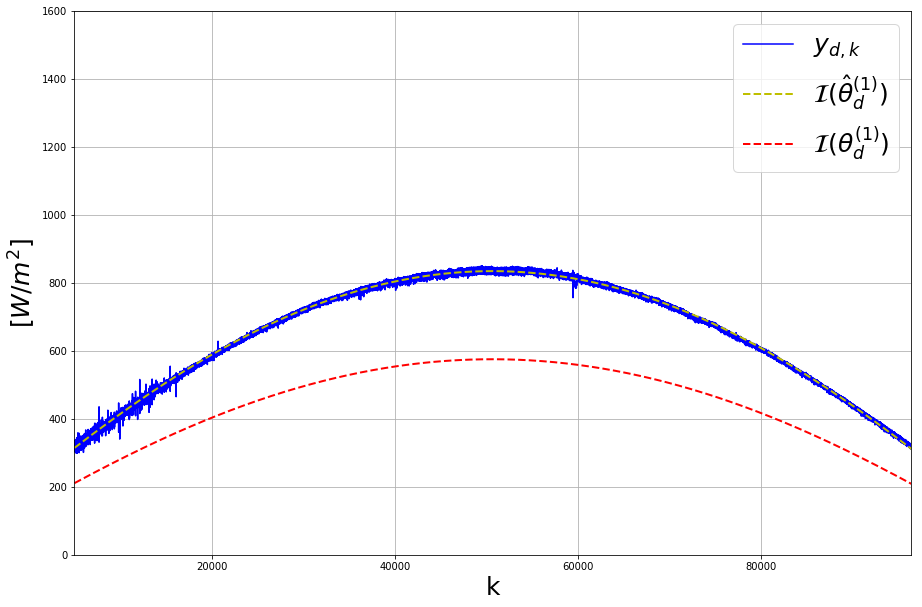

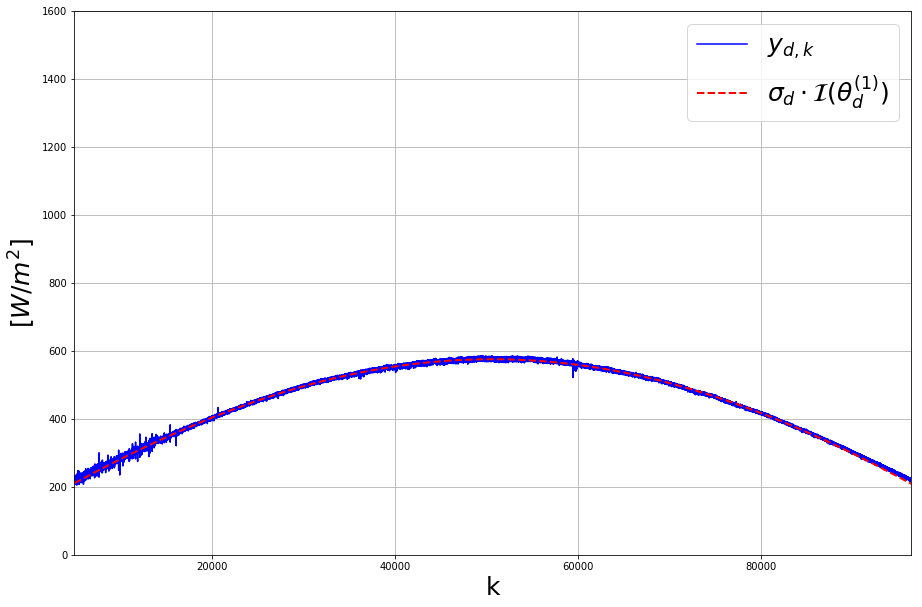

24888.61425932662 24823.89985434877
(99202, 1) (99202, 1) (99202, 1)
2018-12-09 08:08:51.028443
Th. Coeff.:  1229.0728465787477 0.1437900255182531 0.06047431487800356  RMSE:  178.88088831911023
Em. Coeff.:  1717.3745313068694 0.07487304077009099 1.5757243303606556e-06  RMSE:  31.486843298812794
Am. Coeff.:  1.4283966616390897


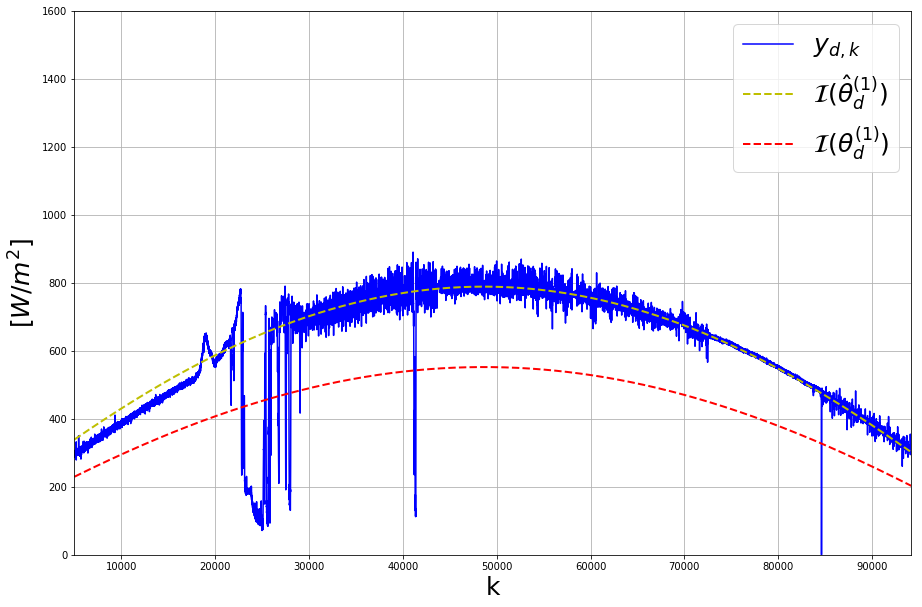

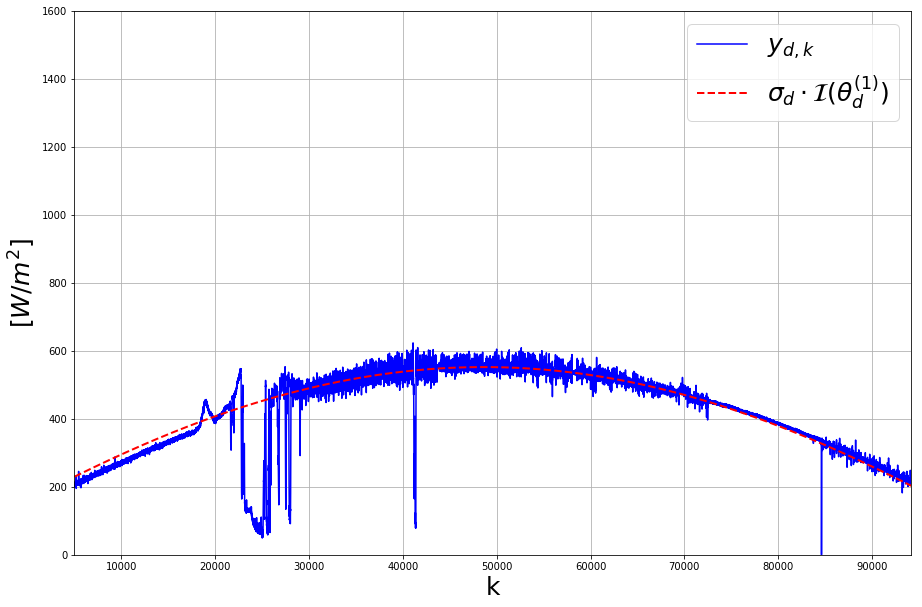

25181.742559169506 25120.39866908702


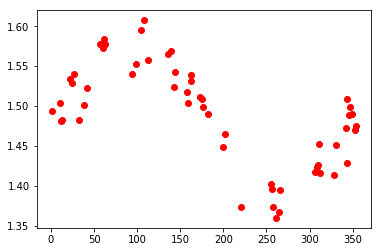

In [20]:
import numpy as np
import matplotlib.pyplot as plt
import pickle

from scipy.optimize import fmin_l_bfgs_b
from datetime import datetime

def Ib(x0, x1):
    return x0 * np.exp( - x1 / np.sin(np.radians(X)) )


def Ibc(x0, x1):
    return Ib(x0, x1) * np.cos(np.radians(90. - X))


def Idc(x0, x1, x2):
    return x2 * Ib(x0, x1) 


def Irc(x0, x1, x2, x3):
    return .5 * x3 * Ib(x0, x1) * ( np.sin(np.radians(X)) + x2 )


def Igsi(*var):
    
    x0 = var[0][0]
    x1 = var[0][1]
    x2 = var[0][2]
    #x3 = var[0][3]

    I = Ibc(x0, x1) 
    I+= Idc(x0, x1, x2) 
    #I+= Irc(x0, x1, x2, x3)
    return I

def Igsi_theorical(A, B, C):    
    Ib  = A * np.exp( - B/np.sin(np.radians(X)) )
    Ibc = Ib * np.cos(np.radians(90. - X))
    Idc = C * Ib 
    Ird = 0. #* x0 * Ib * ( np.sin(np.radians(X)) + C )
    return Ibc + Idc + Ird


def F(*var):
    return np.mean( np.sqrt( (Z - Igsi(var[0]))**2 ) )

# Random initialization of the line search for each kernel hyper-parameter within the bounds.
def random_initialization(b):
    d   = len(b)
    x_k = np.zeros(d)

    for i in range(d):
        x_k[i] = np.random.uniform(b[i][0], b[i][1])

    return x_k


# Implementation of the line search gradient based optimization method
def L_BFGS(F, x0, b, n_restarts_optimizer = 5):
    f_eval = []
    x_eval = []
    i = 0
    
    while i < n_restarts_optimizer:  
    
        x0 = random_initialization(b)

        # Run the line search BFGS optimization!
        OPT = fmin_l_bfgs_b(F, x0 = x0, args = (), bounds = b, maxfun = 15000, approx_grad = True)

        if not np.isnan(OPT[1]):
            i+=1
            #print(OPT[2]['grad'])
            f_eval.append(OPT[1])
            x_eval.append(OPT[0])
        
    i     = np.argmin(f_eval)
    f_opt = f_eval[i]
    x_opt = x_eval[i]
    return f_opt, x_opt, i


def load_data(file):
    
    with open(file, 'rb') as f:
        X = pickle.Unpickler(f).load()
        Y = pickle.Unpickler(f).load()
        Z = pickle.Unpickler(f).load()
        T = pickle.Unpickler(f).load()
    
    return X, Y, Z, T


def save_data(X, Y, Z, W, path, name):
    
    with open(path.format(name), 'wb') as f:
        pickle.dump(X, f); pickle.dump(Y, f)
        pickle.dump(Z, f); pickle.dump(W, f)


path = 'Q:{}'
name = 'clear_sky_normal_radiation.pkl'
#name = 'clear_sky_ghi_model_error.pkl'

DX, DY, DZ, DT = load_data(path.format(name))
print(len(DX), len(DY), len(DZ), len(DT))
print(DX[0].shape, DY[0].shape, DZ[0].shape, DT[0].shape)

BX = np.empty((0, 1))
BY = np.empty((0, 3))
c = []
d = []
e1 = 0
e2 = 0
for i in range(len(DX))[:-1]:
    
    X = DX[i]
    Y = DY[i]
    Z = DZ[i]
    T = DT[i]
    print(X.shape, Z.shape, T.shape)
    
    t = datetime.fromtimestamp(float(T[1,:]))
    n = t.timetuple().tm_yday
    d.append(n)
    A = 1160. +  75. * np.sin(np.radians( (360./365)*(n - 275.) ))
    B = 0.174 + .035 * np.sin(np.radians( (360./365)*(n - 100.) ))
    C = 0.095 + .04  * np.sin(np.radians( (360./365)*(n - 100.) ))
    
    x0  = np.array([0., 0., 0.])
    b   = [(100., 2000.), (0., 1.), (0., 1.)]
    OPT = L_BFGS(F, x0, b, n_restarts_optimizer = 5)
    
    
    s1 = Igsi(OPT[1]).max()/Igsi_theorical(A,B,C).max()
    s2 = np.mean(Igsi(OPT[1])/Igsi_theorical(A,B,C))

    print(t)
    print('Th. Coeff.: ', A, B, C, ' RMSE: ', np.mean( np.sqrt( (Z - Igsi_theorical(A, B, C))**2 ) ))
    print('Em. Coeff.: ', OPT[1][0], OPT[1][1], OPT[1][2], ' RMSE: ', OPT[0])
    print('Am. Coeff.: ', s1)
    
    c.append(s1)
    e1 += np.mean( np.sqrt( (Z - Igsi_theorical(A, B, C)/s1)**2 ) )
    e2 += np.mean( np.sqrt( (Z - Igsi_theorical(A, B, C)/s2)**2 ) )

    n = 5000
    
    #plt.figure(figsize = (15, 2.5))
    #plt.subplot(121)
    plt.figure(figsize = (15,10))
    plt.plot(Z, 'b-', markersize = .5, label = r'$y_{d,k}$')
    plt.plot(Igsi(OPT[1]), 'y--', linewidth = 2., label = r'$\mathcal{I} ( \hat \theta_d^{(1)} )$')
    plt.plot(Igsi_theorical(A,B,C), 'r--', linewidth = 2., label = r'$\mathcal{I} ( \theta_d^{(1)} )$')
    plt.xlabel(r'k', fontsize = 25)
    plt.ylabel(r'$[ W / m^2 ]$', fontsize = 25)
    plt.ylim(0, 1600)
    plt.xlim(n, Z.shape[0] - n)
    plt.legend(prop={'size': 25})
    plt.grid()
    plt.show()

    #plt.subplot(122)
    plt.figure(figsize = (15,10))
    plt.plot(Z/s1, 'b-', markersize = .5, label = r'$y_{d,k}$')
    plt.plot(Igsi_theorical(A,B,C), 'r--', linewidth = 2., label = r'$\sigma_d \cdot \mathcal{I} ( \theta_d^{(1)} )$')
    plt.xlabel(r'k', fontsize = 25)
    plt.ylabel(r'$[ W / m^2 ]$', fontsize = 25)
    plt.ylim(0, 1600)
    plt.xlim(n, Z.shape[0] - n)
    plt.legend(prop={'size': 25})
    plt.grid()
    plt.show()
    
    BX = np.vstack((BX, OPT[0]))
    BY = np.vstack((BY, OPT[1]))
    print(e1, e2)


D = np.array(d)
C = np.array(c)

plt.figure()
plt.plot(d, c, 'ro')
plt.show()

#save_data(BX, BY, D, C, path, name = 'clear_sky_solar_normal_radiation_fit.pkl')
#print(BX.shape, BY.shape, D.shape, C.shape)

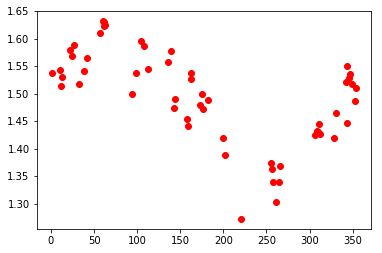

In [23]:
D = np.array(d)
C = np.array(c)

plt.figure()
plt.plot(d[:-1], c[:-1], 'ro')
plt.show()

In [ ]:
plt.figure(figsize = (15, 2.5))

plt.subplot(1, 2, 1)
plt.plot(X[3][1, :], 'b-', markersize = 5)
plt.plot(X[3][5, :], 'r--', linewidth = 1.)
plt.grid()
plt.ylim(1, 1200)
plt.xlim(0, 1390)

plt.subplot(1, 2, 2)
plt.axhline(y = 1, color = 'k', linewidth = 1.)
plt.plot(X[3][0, :], 'b', linewidth = 1.)
plt.grid()
plt.ylim(0, 2)
plt.xlim(0, 1390)

plt.show()

#  - Atmospheric Scattering Effect

### Program to copy infrared images from its directory to one where clear day data is analyzed.

In [7]:
import glob
from shutil import copy2

path_in  = 'E:ir_camera/{}/*'
path_out = 'E:clear_sky_data/{}'

for folder in glob.glob(path_out.format('*')):
    print(folder[-10:])
    
    for file in glob.glob(path_in.format(folder[-10:])):
        
        if file.endswith('IR.png'):
            print(file)
            copy2(file, path_out.format(folder[-10:]))

2017_12_08
E:ir_camera/2017_12_08\1512745695IR.png
E:ir_camera/2017_12_08\1512745710IR.png
E:ir_camera/2017_12_08\1512745725IR.png
E:ir_camera/2017_12_08\1512745740IR.png
E:ir_camera/2017_12_08\1512745755IR.png
E:ir_camera/2017_12_08\1512745770IR.png
E:ir_camera/2017_12_08\1512745785IR.png
E:ir_camera/2017_12_08\1512745800IR.png
E:ir_camera/2017_12_08\1512745815IR.png
E:ir_camera/2017_12_08\1512745830IR.png
E:ir_camera/2017_12_08\1512745845IR.png
E:ir_camera/2017_12_08\1512745860IR.png
E:ir_camera/2017_12_08\1512745875IR.png
E:ir_camera/2017_12_08\1512745890IR.png
E:ir_camera/2017_12_08\1512745905IR.png
E:ir_camera/2017_12_08\1512745920IR.png
E:ir_camera/2017_12_08\1512745935IR.png
E:ir_camera/2017_12_08\1512745950IR.png
E:ir_camera/2017_12_08\1512745965IR.png
E:ir_camera/2017_12_08\1512745980IR.png
E:ir_camera/2017_12_08\1512745995IR.png
E:ir_camera/2017_12_08\1512746010IR.png
E:ir_camera/2017_12_08\1512746025IR.png
E:ir_camera/2017_12_08\1512746040IR.png
E:ir_camera/2017_12_08\151274

### Program to extract information from Girasol measurements and infrared images. It needs shifting and attenuation model to correct the Sun position angles.

In [8]:
import glob
import cv2
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
from scipy.interpolate import interp1d
import pickle
from sklearn.preprocessing import PolynomialFeatures


def save_data(X, Y, path, name):
    
    with open(path.format(name), 'wb') as f:
        pickle.dump(X, f); pickle.dump(Y, f)
              
    
def load_image(file):
    return cv2.imread(file, cv2.IMREAD_UNCHANGED)


def sun_position(I, sun_pixels):
    return np.where(I >= sun_pixels)


def sun_patch(N, x0, y0, r = 10.):
    # Generating grid values and set them with reference to the Sun to denote their distance to the center of the image
    X, Y = np.meshgrid(np.linspace(0, N[1] - 1, N[1]), np.linspace(0, N[0] - 1, N[0]))
    X = X - x0
    Y = Y - y0
    H = np.sqrt(X**2 + Y**2)
    return H < r


def load_model(path, name):
    
    with open(path.format(name), 'rb') as f:
        C0 = pickle.Unpickler(f).load()
        C1 = pickle.Unpickler(f).load()

    print(C0.shape, len(C1))
    return C0, C1


def pyranometers_effect(t, C):
    
    def periodic_model(C, t, N = 365.):
        return C[0] * np.sin(C[1] + ( (2*np.pi) / N ) * t) + C[2]
    
    def picewise_model(C, x0, x1):
        d1 = C[3]
        d2 = C[4]
        
        if x1 < 2018:
            x0 -= 365
        
        if x0 <= d1:
            y1 = C[0]
    
        if x0 >  d1:
            y1 = C[1]
            
        if x0 > d2:
            y1 = C[2]
                       
        return y1

    x0 = t.timetuple().tm_yday
    x1 = t.timetuple().tm_year
    
    y0 = periodic_model(C[0], x0)
    y1 = picewise_model(C[1], x0, x1)
    print(x0, x1, y0, y1)
    return y0, int(y1/2)


def corr_tracker(A, C, N1, t):
    n  = t.timetuple().tm_yday
    N2 = A.shape[0]
    amp, inc = pyranometers_effect(t, C)     
    print(N1, N2, inc, int(inc * (N1/N2)) )
                
    if inc > 0:
        f0 = interp1d(np.linspace(0, N1, A[inc:, 0].shape[0]), A[inc:, 0], kind = 'cubic')
        f1 = interp1d(np.linspace(0, N1, A[inc:, 1].shape[0]), A[inc:, 1], kind = 'cubic')
    else:
        f0 = interp1d(np.linspace(0, N1, A[:inc, 0].shape[0]), A[:inc, 0], kind = 'cubic')
        f1 = interp1d(np.linspace(0, N1, A[:inc, 1].shape[0]), A[:inc, 1], kind = 'cubic')

    ELE = f0(np.linspace(0, N1, N1))[:, np.newaxis]
    AZ  = f1(np.linspace(0, N1, N1))[:, np.newaxis]
    print(ELE.shape, AZ.shape)
    return ELE, AZ

C = load_model(path = 'Q:{}', name = 'clear_sky_ghi_model.pkl')

path = 'E:clear_sky_data/{}'
name = '/trajectory_file.txt'

D = [60, 80]

for folder in glob.glob(path.format('*')):
    print(folder)
    
    F = glob.glob('{}\*'.format(folder))
    A = np.loadtxt(folder + name, delimiter = ',')
    N = len(F)
    t = datetime.strptime(folder[-10:], '%Y_%m_%d')
    print(t)
    
    ELE, AZ = corr_tracker(A, C, N, t)
    X = np.empty((0, 5), float)
    Y = np.empty((0, 4800), float)

    for idx in range(N):
        f = F[idx]

        if f.endswith('.png'):

            I  = load_image(f)
            x  = sun_position(I, sun_pixels = 45057.)
            
            if (len(x[0]) > 0) & (len(x[1]) > 0):
                ele = ELE[idx]
                az  =  AZ[idx]
                xc  = np.mean(x[1])
                yc  = np.mean(x[0])
                #print(idx, ze, az, xo, yo, I.flatten().shape)

                Y = np.vstack((Y, I.flatten()))
                X = np.vstack((X, np.array((ele, az, xc, yc, datetime.fromtimestamp(float(f[-16:-6])))) ))
                
    save_data(X, Y, path, name = '{}.pkl'.format(folder[-10:]))
    print(X.shape, Y.shape)

(3,) 7
E:clear_sky_data\2017_12_08
2017-12-08 00:00:00
342 2017 1.4573092914361951 -83.18181818181819
1851 27730 -41 -2
(1851, 1) (1851, 1)
(1847, 5) (1847, 4800)
E:clear_sky_data\2017_12_09
2017-12-09 00:00:00
343 2017 1.4588091982059206 -83.18181818181819
1849 27695 -41 -2
(1849, 1) (1849, 1)
(1843, 5) (1843, 4800)
E:clear_sky_data\2017_12_12
2017-12-12 00:00:00
346 2017 1.4633580496827268 -83.18181818181819
1843 27604 -41 -2
(1843, 1) (1843, 1)
(1836, 5) (1836, 4800)
E:clear_sky_data\2017_12_13
2017-12-13 00:00:00
347 2017 1.464889212857339 -83.18181818181819
1841 27579 -41 -2
(1841, 1) (1841, 1)
(1835, 5) (1835, 4800)
E:clear_sky_data\2017_12_15
2017-12-15 00:00:00
349 2017 1.4679711393044224 -83.18181818181819
1838 27538 -41 -2
(1838, 1) (1838, 1)
(1833, 5) (1833, 4800)
E:clear_sky_data\2017_12_19
2017-12-19 00:00:00
353 2017 1.4742005712971773 -83.18181818181819
1835 27491 -41 -2
(1835, 1) (1835, 1)
(1651, 5) (1651, 4800)
E:clear_sky_data\2017_12_20
2017-12-20 00:00:00
354 2017 1

### Save each day information into a single pickle file

In [4]:
import numpy as np
import pickle, glob

def _load_data(file):
    with open(file, 'rb') as f:
        X = pickle.Unpickler(f).load()
        Y = pickle.Unpickler(f).load()
    return X, Y

def _save_data(X, Y, path, name):
    with open(path.format(name), 'wb') as f:
        pickle.dump(X, f)
        pickle.dump(Y, f)
        

path = 'E:clear_sky_data/{}'

X_ = []
Y_ = []

for file in glob.glob(path.format('*')):

    if file.endswith('.pkl'):
        x_, y_ = _load_data(file)
        
        if x_.shape[0] > 0:
            print(file)
            X_.append(x_)
            Y_.append(y_)
            
print(len(X_), len(Y_))

path = r'Q:{}'
name = r'clear_sky_background_effect.pkl'
_save_data(X_, Y_, path, name)

E:clear_sky_data\2017_12_08.pkl
E:clear_sky_data\2017_12_09.pkl
E:clear_sky_data\2017_12_12.pkl
E:clear_sky_data\2017_12_13.pkl
E:clear_sky_data\2017_12_15.pkl
E:clear_sky_data\2017_12_19.pkl
E:clear_sky_data\2017_12_20.pkl
E:clear_sky_data\2018_01_01.pkl
E:clear_sky_data\2018_01_11.pkl
E:clear_sky_data\2018_01_12.pkl
E:clear_sky_data\2018_01_13.pkl
E:clear_sky_data\2018_01_22.pkl
E:clear_sky_data\2018_01_24.pkl
E:clear_sky_data\2018_01_27.pkl
E:clear_sky_data\2018_02_02.pkl
E:clear_sky_data\2018_02_07.pkl
E:clear_sky_data\2018_02_11.pkl
E:clear_sky_data\2018_02_26.pkl
E:clear_sky_data\2018_03_01.pkl
E:clear_sky_data\2018_03_02.pkl
E:clear_sky_data\2018_03_03.pkl
E:clear_sky_data\2018_03_04.pkl
E:clear_sky_data\2018_04_04.pkl
E:clear_sky_data\2018_04_09.pkl
E:clear_sky_data\2018_04_18.pkl
E:clear_sky_data\2018_04_23.pkl
E:clear_sky_data\2018_05_16.pkl
E:clear_sky_data\2018_05_19.pkl
E:clear_sky_data\2018_05_23.pkl
E:clear_sky_data\2018_05_24.pkl
E:clear_sky_data\2018_06_07.pkl
E:clear_

### Atmospheric scattering effect model fitting 

#### NOTES:

The backgroud effect due to the scattering solar irradiance depends on the air mass cloumn between the observer and the top of the atmosphere. And, this amount varies with respect to the observation angle. The effect along a day can be model by the fellowing function:

$f_1 = \alpha_1 \cdot \exp \left( \frac{Y_{ij} - y_c}{\gamma_1}\right)$

The Sun's effect on the image can be seen as an unormalized multivariate distribution. However, the Cauchy distribution as more flexibility on the height of the tails of the distribution. The multivariate Cauchy distribution function is given by this expression:

$f_2 = \frac{1}{2\pi} \cdot \left[ \frac{\gamma_2}{\left( (X_{ij} - x_c)^2 + (Y_{ij} - y_c)^2 + \gamma_2^2\right)^{1.5}} \right]$,

it can be easily transform to a Lorentzian function by adding the peak height parameter $\alpha_2$, so the function expression is now:

$f_3 = \alpha_2 \cdot \left[ \frac{\gamma_2^2}{\left( (X_{ij} - x_c)^2 + (Y_{ij} - y_c)^2 + \gamma_2^2\right)^{1.5}} \right]$,

this is not a probability distribution anymore, because the solution of its integral does not add to 1.

The functional to optimize the parameters that define the scattering effect observed in the atmosphere is,

$f = \alpha_1 \cdot \exp \left( \frac{Y_{ij} - y_c}{\gamma_1}\right) + \alpha_2 \cdot \left[ \frac{\gamma_2^2}{\left( (X_{ij} - x_c)^2 + (Y_{ij} - y_c)^2 + \gamma_2^2\right)^{1.5}} \right]$,


The scale paramters $\alpha$ and length scale parameters $\gamma$ can be found by minimizing the Root Mean Squere Error (RMSE),

$E(\theta) = \frac{1}{N \cdot D} \cdot \sqrt{\left( I_{ij} - f(\theta)_{ij} \right)^2}$

$D$ and $N$ are the dimensions of an image. This function is expressed by convention sum. The gradient of this expression is given by taking the partial derivatives of the function with respect to each paramter $\theta$:

$\frac{\partial E(\theta)}{\partial \theta_k} = - \frac{1}{N \cdot D} \cdot \frac{\left( I_{ij} - f(\theta)_{ij} \right)}{\left|\left( I_{ij} - f(\theta)_{ij} \right) \right|} \cdot \frac{\partial f(\theta)}{\partial \theta_k}$

where the gradiante of $f(\theta)$ is:

$\frac{\partial f(\theta)}{\partial \theta_1} = \exp \left( \frac{y_{i,j} - y_s}{\theta_2} \right)$

$\frac{\partial f(\theta)}{\partial \theta_2} = - \theta_1 \cdot \exp \left( \frac{y_{i,j} - y_s}{\theta_2} \right) \cdot \left( \frac{y_{i,j} - y_s}{\theta_2^2} \right) $

$\frac{\partial f(\theta)}{\partial \theta_3} = \frac{\theta_4^2}{\left[ \left( x_{i,j} - x_s \right)^2 + \left( y_{i,j} - y_s \right)^2 + \theta_4^2\right]^{\frac{3}{2}}} $

$\frac{\partial f(\theta)}{\partial \theta_4} =  \theta_3 \cdot \theta_4 \cdot  \left[ \frac{2 \left( x_{i,j} - x_s \right)^2 + 2 \left( y_{i,j} - y_s \right)^2 - \theta_4^2 }{\left[ \left( x_{i,j} - x_s \right)^2 + \left( y_{i,j} - y_s \right)^2 + \theta_4^2\right]^{\frac{5}{2}}} \right] $

In [48]:
import numpy as np
import pickle, datetime
import matplotlib.pyplot as plt

from scipy.optimize import fmin_l_bfgs_b
from scipy import interpolate

# Load Data from a pickle
def _load_data(file):
    with open(file, 'rb') as f:
        X = pickle.Unpickler(f).load()
        Y = pickle.Unpickler(f).load()
    return X, Y

# Save Data in a pickle
def _save_data(X_, path, name):
    with open(path.format(name), 'wb') as f:
        pickle.dump(X_, f)

def _coordinares_grid(M = 60, N = 80):
    X_, Y_ = np.meshgrid(np.linspace(0, N - 1, N), np.linspace(0, M - 1, M))
    Z_ = np.sqrt((X_ - 40)**2 + (Y_ - 30)**2)
    return np.concatenate([X_.flatten()[:, np.newaxis], Y_.flatten()[:, np.newaxis]], axis = 1)

path = 'Q:{}'
name = 'clear_sky_background_effect.pkl'
file = path.format(name)
print(file)
X_, Y_ = _load_data(file)
print(len(X_), len(Y_))
XYZ_ = _coordinares_grid(M = 60, N = 80)
print(XYZ_.shape)

Q:clear_sky_background_effect.pkl
55 55
(4800, 2)


In [53]:
# Direct radiation from the sun funcion
def _f_direct(w_2, w_3, XY_, x_):
    return w_2 * ( (w_3**2) / ( (XY_[:, 0] - x_[0])**2 + (XY_[:, 1] - x_[1])**2 + w_3**2 )**1.5 )[:, np.newaxis]

# Scatter radiation background function
def _f_scatter(w_0, w_1, XY_, x_):
    return w_0 * np.exp( (XY_[:, 1] - x_[1]) / w_1)[:, np.newaxis]

# Atmospheric Funtion
def _f(w_, XY_, x_):
    # Unpck function parameters
    w_0, w_1, w_2, w_3 = w_
    # Evaluation of the scatter radiation function
    f_1 = _f_scatter(w_0, w_1, XY_, x_)
    # Evaluation of the direct radiation function
    f_2 = _f_direct(w_2, w_3, XY_, x_) 
    # Adding together both fuctions to obtained the atmospheric function
    Z_hat_ = f_1 + f_2
    Z_hat_[Z_hat_ > 45057.] = 45057
    return Z_hat_

# Atmospheric Function gradient
def _g(w_, XY_, x_):
    # Unpck function parameters
    w_0, w_1, w_2, w_3 = w_
    # Gradinet Constant
    _h = (XY_[:, 0] - x_[0])**2 + (XY_[:, 1] - x_[1])**2 + w_3**2 
    # Calculate each parameter gradiante
    g_0_ = np.exp( (XY_[:, 1] - x_[1])/w_1 )
    g_1_ = - w_0 * ( (XY_[:, 1] - x_[1])/w_1**2 ) * np.exp( (XY_[:, 1] - x_[1])/w_1 )
    g_2_ = w_3**2 / _h**1.5
    g_3_ = w_2 * w_3 * (2*(XY_[:, 0] - x_[0])**2 + 2*(XY_[:, 1] - x_[1])**2 - w_3**2) / _h**2.5 
    # And concatenate together to define the function gradient
    return np.concatenate((g_0_[:, np.newaxis], g_1_[:, np.newaxis], g_2_[:, np.newaxis], g_3_[:, np.newaxis]), axis = 1)

# RMSE
def _E(w_, x_, z_, XY_, D):
    return np.sqrt( np.mean(  (z_ - _f(w_, XY_, x_))**2 ) )

# Derivatif of the RMSE
def _dE(w_, x_, z_, XY_, D):
    # Evaluation of the Atmoshperic function
    z_hat_  = _f(w_, XY_, x_)
    # Evaluation of the Atmospheric function gradient
    dZ_hat_ = _g(w_, XY_, x_)   
    # Definiton of the the error function gradient
    E_ = 2*dZ_hat_ - 2*z_*dZ_hat_
    return np.sum(E_, axis = 0)

# Implementation of the line search gradient based optimization method
def _optimize(_f, _g, bounds_, args_, n_init):
    # Random initialization of the line search for each kernel hyper-parameter within the bounds.
    def __rand_init(bounds_):
        n_var   = len(bounds_)
        x_init_ = np.zeros(n_var)
        for i in range(n_var):
            x_init_[i] = np.random.uniform(bounds_[i][0], bounds_[i][1])                             
        return x_init_
    # Variables Initialization
    f_ = []
    x_ = []
    i = 0
    # Loop over no. of initializations
    while i < n_init:  
        # Run the line search BFGS optimization!
        OPT_ = fmin_l_bfgs_b(_f, x0 = __rand_init(bounds_), fprime = _g, args = args_, 
                                     bounds = bounds_, maxfun = 15000, approx_grad = True)
        # Save only results that converge to optima
        if not np.isnan(OPT_[1]):
            f_.append(OPT_[1])
            x_.append(OPT_[0])
            i+=1
    # Get best result of all initializations
    i = np.argmin(f_)
    return f_[i], x_[i], i

# Calculate the model error in the circumsolar area
def _circumsolar_area_error(z_, z_hat_, XYZ_, x_, r = 5):
    idx_ = np.sqrt((XYZ_[:, 0] - x_[0])**2 + (XYZ_[:, 1] - x_[1])**2) < r
    return np.sqrt(np.mean((z_[idx_] - z_hat_[idx_])**2))

# List of results Initialization
BX_ = [] 
BY_ = [] 
BZ_ = [] 
BT_ = []
BD_ = [] 
# Optimization Parameters Boundaries 
bounds_ = [(0., 50000.), (1e2, 1e5), (0., 1e5), (1e-5, 2.)]
# loop over days
for i in range(len(X_)):
    # Variable Initialization
    DX_ = np.empty((0, 2))
    DY_ = np.empty((0, 4))
    DZ_ = np.empty((0, 1))
    DT_ = np.empty((0, 1), dtype = 'datetime64')
    day = str(X_[i][0, :][4]).split(' ')[0]
    # loop over samples in each day
    for ii in range(X_[i].shape[0]):
        # Extract Data and Define Dataset
        t_ = X_[i][ii, :][4]
        x_ = np.hstack((X_[i][ii, :][2], X_[i][ii, :][3]))[:, np.newaxis]
        z_ = Y_[i][ii, :][:, np.newaxis]
        D  = z_.shape[0] * z_.shape[1]
        # Optimiza Model
        OPT_ = _optimize(_E, _dE, bounds_, args_ = (x_, z_, XYZ_, D), n_init = 3)
        # Get Results of Model Approximation
        e  = OPT_[0]
        w_ = OPT_[1]
        a_ = np.array([X_[i][ii, :][0], X_[i][ii, :][1]]).T
        # Model prediction for test
        z_hat_ = _f(w_, XYZ_, x_)
        # Calculate the model error in the circumsolar area
        c = _circumsolar_area_error(z_, z_hat_, XYZ_, x_)
        # Diplay sample results summary
        print('>> Date: {} Error: {} C.A. Error: {} Theta: {}'.format(t_, e, c, w_))
        # Display and get best models according to error and circumsolar area error
        if e < 200. and c < 200.:
            plt.figure(figsize = (20, 5))
            plt.subplot(131)
            plt.plot(z_)
            plt.subplot(132)
            plt.plot(z_hat_)
            plt.subplot(133)
            plt.plot(z_ - z_hat_)
            plt.show()  
        # Save Model that approximate the function best
        DX_ = np.vstack((DX_, a_))
        DY_ = np.vstack((DY_, w_))
        DZ_ = np.vstack((DZ_, e))
        DT_ = np.vstack((DT_, t_))
    print(DX_.shape, DY_.shape, DZ_.shape, DT_.shape, DZ_.sum())
    # Append all the data from all the days
    BD_.append(day_)
    BX_.append(DX_)
    BY_.append(DY_)
    BZ_.append(DZ_)
    BT_.append(DT_)
    print(len(BD_), len(BX_), len(BY_), len(BZ_), len(BT_))
    
# save the Dataset
name = 'clear_sky_background_effect_fit.pkl'
_save_data([BD_, BX_, BY_, BZ_, BT_], path, name)

>> Date: 2017-12-08 08:08:30 Error: 424.07734667588306 C.A. Error: 881.0753040411703 Theta: [2.44867841e+04 3.23811203e+02 1.00000000e+05 5.24528546e-01]
>> Date: 2017-12-08 08:08:45 Error: 419.1789691758557 C.A. Error: 744.2534549475716 Theta: [2.44804056e+04 3.23245001e+02 1.00000000e+05 5.25035679e-01]
>> Date: 2017-12-08 08:09:00 Error: 417.2827764055343 C.A. Error: 698.5905239024411 Theta: [2.44934707e+04 3.24066139e+02 1.00000000e+05 5.22007729e-01]
>> Date: 2017-12-08 08:09:15 Error: 419.2384023966541 C.A. Error: 753.0843004439009 Theta: [2.44924744e+04 3.23870115e+02 1.00000000e+05 5.26855431e-01]
>> Date: 2017-12-08 08:09:30 Error: 424.773765618674 C.A. Error: 887.361774662765 Theta: [2.44835814e+04 3.23378403e+02 1.00000000e+05 5.30896413e-01]
>> Date: 2017-12-08 08:09:45 Error: 422.34343858042655 C.A. Error: 824.4330472212703 Theta: [2.45006636e+04 3.24310644e+02 1.00000000e+05 5.27105658e-01]
>> Date: 2017-12-08 08:10:00 Error: 1370.877288799161 C.A. Error: 789.601671054289

KeyboardInterrupt: 